In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
import matplotlib.pyplot as plt
import numpy as np
ppath = "/Users/glengyel/Library/Mobile Documents/com~apple~CloudDocs/Projects/Neural_link_of_CI/neural_link/results/"
import os
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import cm
from matplotlib.colors import ListedColormap
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from scipy.stats import gaussian_kde

from scipy.stats import multivariate_normal
from scipy.stats import norm

import h5py

clist = []
for cname in ["winter", "spring"]:
    c = cm.get_cmap(cname, 100)
    clist.append(ListedColormap(c(np.linspace(0, 1, 10))))

p = os.getcwd()
Pth = os.path.dirname(p)
FigPath= "/plots/"
saveFigPath = Pth+FigPath

FigParams = {
    "fig_size": 6,
    "font1": {"fontname": "Arial", "size": 30},
    "font2": {"fontname": "Arial", "size": 30},
    "line_w": 2,
    "colors_maps": clist,
    "colors_names": ["royalblue", "olivedrab", "darkorange", "firebrick"],
    "saveFigPath": saveFigPath,
    "ErrorBar": {'ErrDist':[0.4,0.4],
                 'ErrSize':1,
                 'ErrWid':4,
                 'sizedots':10,
                 'ErrColor':["royalblue", "olivedrab", "darkorange", "firebrick"],
                 'DotsColor':["royalblue", "olivedrab", "darkorange", "firebrick"],
                 'sizeMean':25},
}


def packParams():
    return (FigParams["fig_size"],
            FigParams["font1"],
            FigParams["font2"],
            FigParams["line_w"],
            FigParams["colors_maps"],
            FigParams["colors_names"],
            FigParams["saveFigPath"],)


def vector_subtract(direction1, speed1, direction2, speed2):
    # Convert direction and speed to Cartesian coordinates
    x1 = speed1 * np.cos(np.radians(direction1))
    y1 = speed1 * np.sin(np.radians(direction1))
    x2 = speed2 * np.cos(np.radians(direction2))
    y2 = speed2 * np.sin(np.radians(direction2))
    
    # Subtract the vectors
    x_diff = x1 - x2
    y_diff = y1 - y2
    
    # Convert the result back to direction and speed
    result_speed = np.sqrt(x_diff**2 + y_diff**2)
    result_direction = np.degrees(np.arctan2(y_diff, x_diff))
    
    # Ensure the direction is in the range [-180, 180)
    if result_direction >= 180:
        result_direction -= 360
    elif result_direction < -180:
        result_direction += 360
    
    return result_direction, result_speed



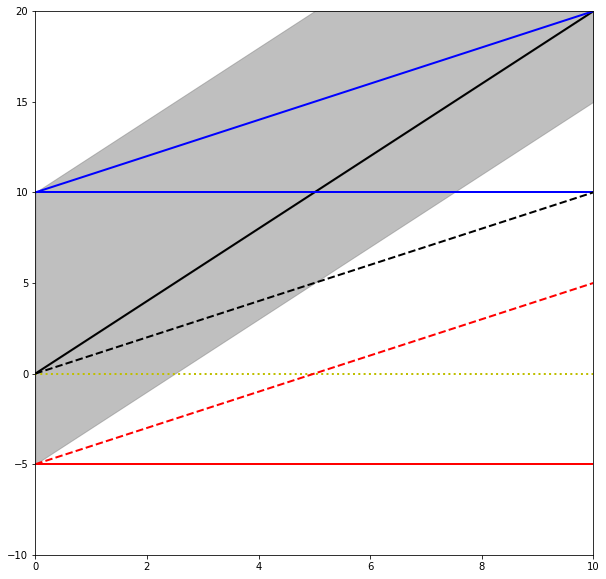

In [39]:
x = np.linspace(0, 10, 100)
D = 2*x
PL = -5
PR = 10
BL = D+PL
BR = D+PR
fig, ax = plt.subplots(figsize=(10, 10))
ax.plot(x, D, color="k", lw=2)
ax.fill_between(x, D, BL, color="gray", alpha=0.5)
ax.fill_between(x, D, BR, color="gray", alpha=0.5)
ax.plot(x, np.zeros(len(x)), 'y:', lw=2)
ax.plot(x, np.repeat(PL,len(x)), 'r-', lw=2)
ax.plot(x, np.repeat(PR,len(x)), 'b-', lw=2)
mov = np.cumsum(D)/np.cumsum(np.ones(len(D)))
ax.plot(x, mov, 'k--', lw=2)
ax.plot(x, mov+PL, 'r--', lw=2)
ax.plot(x, mov+PR, 'b-', lw=2)
ax.set_xlim([0, 10])
ax.set_ylim([-10, 20])
plt.show()


In [2]:
figS, f_font1, f_font2, line_w, cm, cn, sp = packParams()

In [41]:
# open the file in read mode
with h5py.File('/Users/glengyel/Projects_data/Neural Predictions/post_dir_relVar_subj2.mat', 'r') as file:
    # list all the keys in the root group
    print(list(file.keys()))

    # access a dataset
    dir_post = file['dir_post']
    print(dir_post.shape)
    dir_post = np.array(dir_post)
    print(dir_post.shape)



['dir_post']
(1000, 91, 91, 5, 5, 2, 4)
(1000, 91, 91, 5, 5, 2, 4)


In [42]:
# Example usage
direction1 = 0  # degrees
speed1 = 7  # units
direction2 = -125  # degrees
speed2 = 7  # units

result_direction, result_speed = vector_subtract(direction1, speed1, direction2, speed2)
print(f"Result Direction: {result_direction} degrees")
print(f"Result Speed: {result_speed} units")

Traceback (most recent call last):
  File "/Users/glengyel/anaconda3/lib/python3.9/site-packages/IPython/core/completer.py", line 2056, in _complete
    for m in matcher(text)])
  File "/Users/glengyel/anaconda3/lib/python3.9/site-packages/IPython/core/completer.py", line 1444, in python_matches
    matches = self.global_matches(text)
  File "/Users/glengyel/anaconda3/lib/python3.9/site-packages/IPython/core/completer.py", line 675, in global_matches
    for word in lst:
RuntimeError: dictionary changed size during iteration


Result Direction: 27.499999999999996 degrees
Result Speed: 12.418151664495104 units


Speed: 7cps
direction: center=0, surround= -125


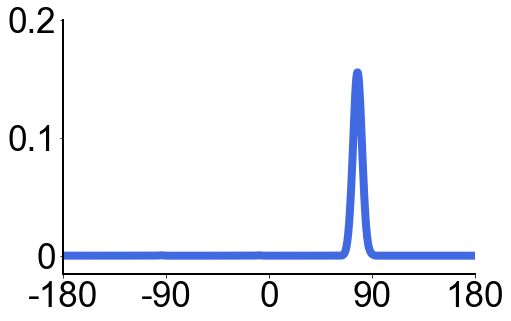

Speed: 7cps
direction: center=0, surround= -125


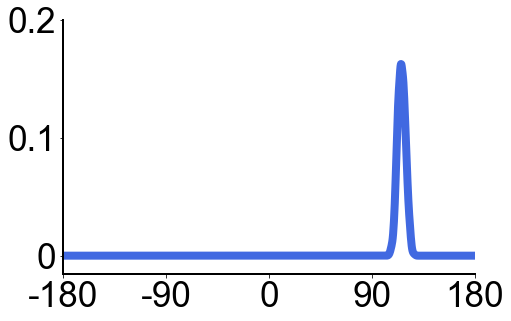

Speed: 7cps
direction: center=0, surround= -125


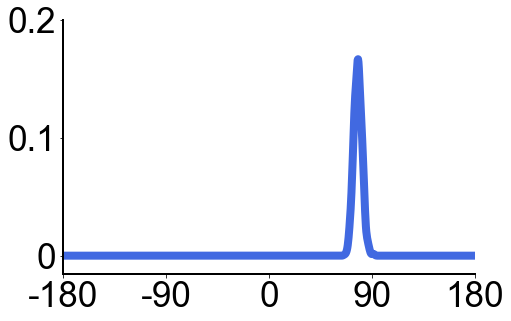

Speed: 7cps
direction: center=0, surround= -125


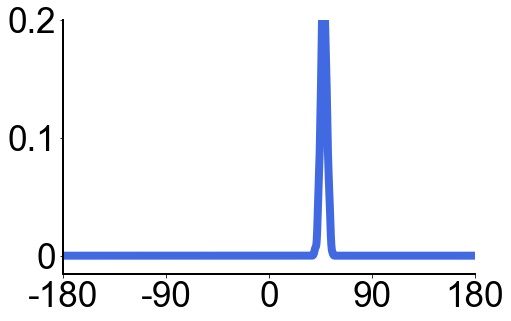

In [54]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
xtckL = ["-90","-45","0","45","90"]
ytck = [-180,-90,0,90,180]
ytckL = ["-90","-45","0","45","90"]
x_eval = np.linspace(-180, 180, num=1000)
deg0 = int(np.round(l/2))
deg45 = deg0+int(np.round(l/8))
xL = [str(round(i)) for i in x*360/l-180]
for c in range(4):
    _, ax = plt.subplots(1, 1, figsize=(figS*1.2, figS*.76))
    Y0 = dir_post[:,deg45,deg0,2,2,0,c]
    Y0[np.isnan(Y0)] = np.random.uniform(-180, 180, sum(np.isnan(Y0)))
    kde = gaussian_kde(Y0)
    print("Speed: 7cps")
    print("direction: center=0, surround=", xL[3])
    Y = kde(x_eval)
    X = x_eval.copy()
    ax.plot(X,Y,  color="royalblue", linewidth=line_w+6)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_linewidth(line_w)
    ax.spines["bottom"].set_linewidth(line_w)
    ax.spines["left"].set_linewidth(line_w)
    ax.grid(False)
    for label in (ax.get_xticklabels()+ax.get_yticklabels()):
        label.set_fontname(f_font1["fontname"])
        label.set_fontsize(35)
    ax.xaxis.set_ticks(ytck)
    ax.yaxis.set_ticks([0,0.065, 0.13])
    ax.xaxis.set_ticklabels(ytck)
    ax.set_xlim(-180, 180)
    ax.set_ylim(-0.01, 0.13)
    ax.yaxis.set_ticklabels([0, 0.1, 0.2])
    #ax.set_xlabel(" ")
    #ax.set_ylabel(L[i], **f_font2)
    plt.tight_layout()
    #plt.savefig(sp+"1PostDir_subj2_rel.pdf")
    plt.show()

In [ ]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
xtckL = ["-180","-90","0","90","180"]
ytck = [-40,20,0,20,40]
x_eval = np.linspace(-180, 180, num=1000)
deg45 = int(np.round(l/2))
x = np.arange(2,l-2,4)
xL = [str(round(i)) for i in x*360/l-180]
for c in range(4):
    _, ax = plt.subplots(1, 1, figsize=(figS*1.2, figS*.66))
    Y0 = dir_post[:,deg45,x[3],2,2,0,c]
    Y0[np.isnan(Y0)] = np.random.uniform(-180, 180, sum(np.isnan(Y0)))
    kde = gaussian_kde(Y0)
    print("Speed: 7cps")
    print("direction: center=0, surround=", xL[3])
    Y = kde(x_eval)
    X = x_eval.copy()
    ax.plot(X,Y,  color="royalblue", linewidth=line_w+10)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_linewidth(line_w)
    ax.spines["bottom"].set_linewidth(line_w)
    ax.spines["left"].set_linewidth(line_w)
    ax.grid(False)
    for label in (ax.get_xticklabels()+ax.get_yticklabels()):
        label.set_fontname(f_font1["fontname"])
        label.set_fontsize(35)
    ax.xaxis.set_ticks(ytck)
    ax.yaxis.set_ticks([0,0.05, 0.1])
    ax.xaxis.set_ticklabels(ytck)
    ax.set_xlim(-20, 40)
    ax.set_ylim(-0.001, 0.1)
    ax.yaxis.set_ticklabels([0,0.05, 0.1])
    #ax.set_xlabel(" ")
    #ax.set_ylabel(L[i], **f_font2)
    plt.tight_layout()
    #plt.savefig(sp+"1PostDir_subj2_rel.pdf")
    plt.show()

(1000, 8)


TypeError: NumPy boolean array indexing assignment requires a 0 or 1-dimensional input, input has 8 dimensions

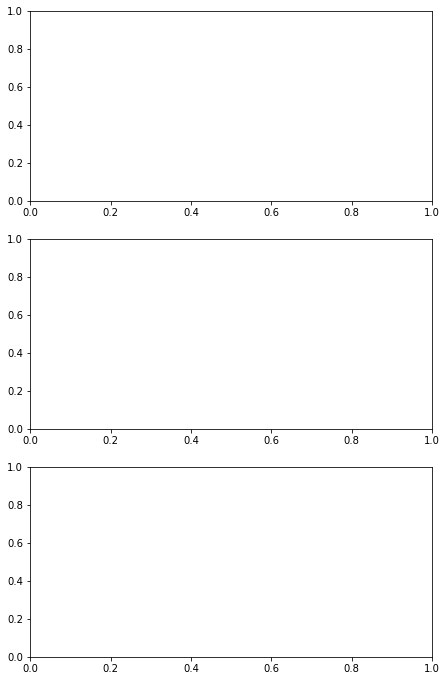

In [45]:


l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
xtckL = ["-90","-45","0","45","90"]
ytck = [-180,-90,0,90,179]
ytckL = ["-90","-45","0","45","90"]
x_eval = np.linspace(-180, 180, num=1000)
deg45 = int(np.round(l/2))
x = [2, 11, 13, 23, 34, 43, 45, 48, 57, 68, 78, 80,88]
xL = [-180,-135,-130,-90,-45,-10,0,10,45,90,130,135,180]
x = [45, 57,  78]
xL = [0,45,130]
ytck = [0,45,90,135,175]
ytckL = ["0","45","90","135","180"]
#ylab = "Center relative direction (deg.)"
ylab = "Center relative direction (deg.)"
s=1
_, ax = plt.subplots(len(x), 1, figsize=(figS*1.2, figS*len(x)*0.66))
for ti, t in enumerate(x):
    y1 = dir_post[:,t,deg45,2,2,s]
    y2 = dir_post[:,t,deg45-1,2,2,s]
    y = np.hstack((y1,y2))
    y = np.round(y,1)
    print(y.shape)
    y[np.isnan(y)] = np.random.uniform(-180, 180, sum(np.isnan(y)))
    if len(np.unique(y))<10:
        print("no variability",np.unique(y))
        Y = [0,2]
        m = int(np.round(np.mean(y)))
        X = [m,m]
    else:
        if (t==45) or (t==46):
             Y = np.repeat(1/len(x_eval), len(x_eval))
        elif (t==43):
             Y = norm.pdf(x_eval, loc=-25, scale=5)
        elif (t==48):
             Y = norm.pdf(x_eval, loc=25, scale=5)
        else:
            kde = gaussian_kde(y)
            Y = kde(x_eval)
        X = x_eval.copy()
    if ti == 0:
         Y = Y+0.01
    axins = ax[ti]
    axins.plot(X, Y, "-", color="royalblue", linewidth=line_w+5)
    #axins.set_xlim([0,1])
    axins.set_xlim([0, 179])
    stimType = 'Center direction = '+str(xL[ti])
    #axins.annotate(stimType, xy=(0.1,0.9),xycoords='axes fraction',fontsize=f_font1["size"])
    axins.spines["right"].set_visible(False)
    axins.spines["top"].set_visible(False)
    #axins.spines["bottom"].set_visible(False)
    axins.grid(False)
        #axins.tick_params(left=False,right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
    axins.xaxis.set_ticks(ytck)
    axins.xaxis.set_ticklabels(ytckL, **f_font1)
    axins.set_xlabel(" ")
        #xxr,xxrL = [0, np.round(np.max(Y[t, :, r])*0.66,2)], ["0", str(np.round(np.max(Y[t, :, r])*0.66,2))]
    axins.yaxis.set_ticks([0,0.1,0.2])
    axins.set_ylabel("Probability density", **f_font1)
    #axins.yaxis.set_ticklabels([])
    for labl in (axins.get_xticklabels()+axins.get_yticklabels()):
            labl.set_fontname(f_font1["fontname"])
            labl.set_fontsize(f_font1["size"])
    plt.tight_layout()
    plt.savefig(sp+"ujjj.pdf")
    plt.show()

ValueError: array must not contain infs or NaNs

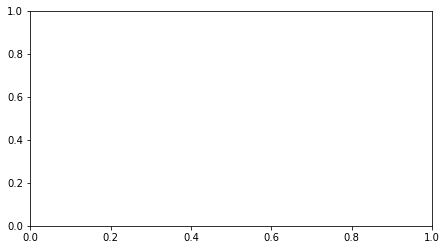

In [15]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
xtckL = ["-90","-45","0","45","90"]
ytck = [-20,0,20,40]
ytckL = ["-90","-45","0","45","90"]
x_eval = np.linspace(-180, 180, num=1000)
deg45 = int(np.round(l/2))
x = np.arange(2,l-2,4)
xL = [str(round(i)) for i in x*360/l-180]
_, ax = plt.subplots(1, 1, figsize=(figS*1.2, figS*.66))
kde = gaussian_kde(dir_post[:,deg45,x[3],2,2,1])
print("Speed: 7cps")
print("direction: center=0, surround=", xL[3])
Y = kde(x_eval)
X = x_eval.copy()
ax.plot(X,Y,  color="royalblue", linewidth=line_w+10)
yy = norm.pdf(x_eval, loc=X[np.argmax(Y)], scale=2.9)
ax.plot(X,yy*0.55, "--", color="darkorange", linewidth=line_w+10)
yy = norm.pdf(x_eval, loc=X[np.argmax(Y[:550])], scale=3.)
ax.plot(X,yy*0.45, "--", color="darkkhaki", linewidth=line_w+10)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_linewidth(line_w)
ax.spines["bottom"].set_linewidth(line_w)
ax.spines["left"].set_linewidth(line_w)
ax.grid(False)
for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    label.set_fontname(f_font1["fontname"])
    label.set_fontsize(35)
ax.xaxis.set_ticks(ytck)
ax.yaxis.set_ticks([0,0.05, 0.1])
ax.xaxis.set_ticklabels(ytck)
ax.set_xlim(-20, 40)
ax.set_ylim(-0.001, 0.1)
ax.yaxis.set_ticklabels([0,0.05, 0.1])
#ax.set_xlabel(" ")
#ax.set_ylabel(L[i], **f_font2)
plt.tight_layout()
plt.savefig(sp+"1PostDir_mix_subj2_rel.pdf")
plt.show()
print(X[np.argmax(Y)],X[np.argmax(Y[:550])])

ValueError: array must not contain infs or NaNs

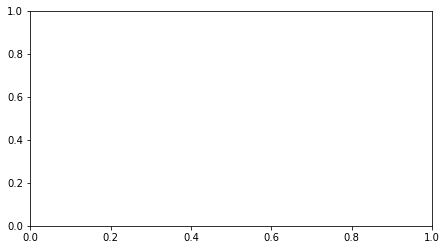

In [16]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
xtckL = ["-90","-45","0","45","90"]
ytck = [-20,0,20,40]
ytckL = ["-90","-45","0","45","90"]
x_eval = np.linspace(-180, 180, num=1000)
deg45 = int(np.round(l/2))
x = np.arange(2,l-2,4)
xL = [str(round(i)) for i in x*360/l-180]
_, ax = plt.subplots(1, 1, figsize=(figS*1.2, figS*.66))
kde = gaussian_kde(dir_post[:,deg45,x[3],2,2,1])
print("Speed: 7cps")
print("direction: center=0, surround=", xL[3])
Y = kde(x_eval)
X = x_eval.copy()
#ax.plot(X,Y,  color="royalblue", linewidth=line_w+5)
yy = norm.pdf(x_eval, loc=X[np.argmax(Y)], scale=2.9)
ax.plot(X,yy*0.55, "--", color="darkorange", linewidth=line_w+10)
#yy = norm.pdf(x_eval, loc=X[np.argmax(Y[:550])], scale=3.)
#ax.plot(X,yy*0.45, "--", color="gold", linewidth=line_w+5)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_linewidth(line_w)
ax.spines["bottom"].set_linewidth(line_w)
ax.spines["left"].set_linewidth(line_w)
ax.grid(False)
for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    label.set_fontname(f_font1["fontname"])
    label.set_fontsize(35)
ax.xaxis.set_ticks(ytck)
ax.yaxis.set_ticks([0,0.05, 0.1])
ax.xaxis.set_ticklabels(ytck)
ax.set_xlim(-20, 40)
ax.set_ylim(-0.001, 0.1)
ax.yaxis.set_ticklabels([0,0.05, 0.1])
#ax.set_xlabel(" ")
#ax.set_ylabel(L[i], **f_font2)
plt.tight_layout()
plt.savefig(sp+"1PostDir_mix1_subj2_rel.pdf")
plt.show()

ValueError: array must not contain infs or NaNs

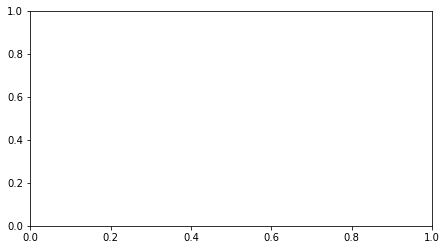

In [17]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
xtckL = ["-90","-45","0","45","90"]
ytck = [-20,0,20,40]
ytckL = ["-90","-45","0","45","90"]
x_eval = np.linspace(-180, 180, num=1000)
deg45 = int(np.round(l/2))
x = np.arange(2,l-2,4)
xL = [str(round(i)) for i in x*360/l-180]
_, ax = plt.subplots(1, 1, figsize=(figS*1.2, figS*.66))
kde = gaussian_kde(dir_post[:,deg45,x[3],2,2,1])
print("Speed: 7cps")
print("direction: center=0, surround=", xL[3])
Y = kde(x_eval)
X = x_eval.copy()
#ax.plot(X,Y,  color="royalblue", linewidth=line_w+5)
#yy = norm.pdf(x_eval, loc=X[np.argmax(Y)], scale=2.9)
#ax.plot(X,yy*0.55, "--", color="darkorange", linewidth=line_w+5)
yy = norm.pdf(x_eval, loc=X[np.argmax(Y[:550])], scale=3.)
ax.plot(X,yy*0.45, "--", color="darkkhaki", linewidth=line_w+10)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_linewidth(line_w)
ax.spines["bottom"].set_linewidth(line_w)
ax.spines["left"].set_linewidth(line_w)
ax.grid(False)
for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    label.set_fontname(f_font1["fontname"])
    label.set_fontsize(35)
ax.xaxis.set_ticks(ytck)
ax.yaxis.set_ticks([0,0.05, 0.1])
ax.xaxis.set_ticklabels(ytck)
ax.set_xlim(-20, 40)
ax.set_ylim(-0.001, 0.1)
ax.yaxis.set_ticklabels([0,0.05, 0.1])
#ax.set_xlabel(" ")
#ax.set_ylabel(L[i], **f_font2)
plt.tight_layout()
plt.savefig(sp+"1PostDir_mix2_subj2_rel.pdf")
plt.show()

In [18]:
x = np.arange(l)
xL = [str(round(i)) for i in x*360/l-180]
for i,j in enumerate(xL):
    print(i,j)

0 -180
1 -176
2 -172
3 -168
4 -164
5 -160
6 -156
7 -152
8 -148
9 -144
10 -140
11 -136
12 -133
13 -129
14 -125
15 -121
16 -117
17 -113
18 -109
19 -105
20 -101
21 -97
22 -93
23 -89
24 -85
25 -81
26 -77
27 -73
28 -69
29 -65
30 -61
31 -57
32 -53
33 -49
34 -45
35 -42
36 -38
37 -34
38 -30
39 -26
40 -22
41 -18
42 -14
43 -10
44 -6
45 -2
46 2
47 6
48 10
49 14
50 18
51 22
52 26
53 30
54 34
55 38
56 42
57 45
58 49
59 53
60 57
61 61
62 65
63 69
64 73
65 77
66 81
67 85
68 89
69 93
70 97
71 101
72 105
73 109
74 113
75 117
76 121
77 125
78 129
79 133
80 136
81 140
82 144
83 148
84 152
85 156
86 160
87 164
88 168
89 172
90 176


ValueError: array must not contain infs or NaNs

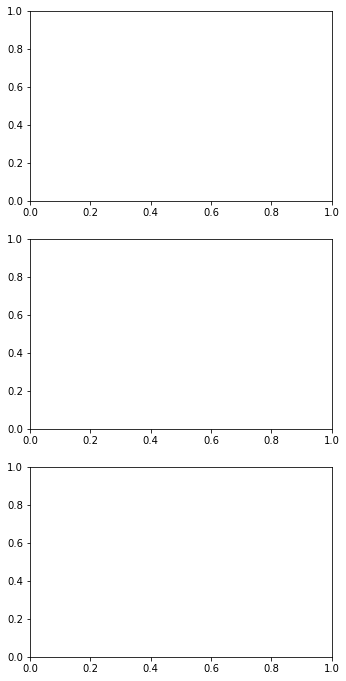

In [19]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
xtckL = ["-90","-45","0","45","90"]
ytck = [-90,-45,0,45,90]
ytckL = ["-90","-45","0","45","90"]
x_eval = np.linspace(-180, 180, num=1000)
deg45 = int(np.round(l/2))
x = range(deg45)
#xL = [-180,-135,-130,-90,-45,-10,0,10,45,90,130,135,180]
x = [[57,45], [45,90], [78,68]]
ytck = [0,60,120, 180]
ytckL = ["0","45","90","135","180"]
#ylab = "Center relative direction (deg.)"
ylab = " "
s=1
_, ax = plt.subplots(len(x), 1, figsize=(figS*0.9, figS*len(x)*0.66))
for ti, t in enumerate(x):
    y = dir_post[:,t[0],t[1],2,2,s]
    y = np.round(y,1)
    if len(np.unique(y))<10:
        print("no variability",np.unique(y))
        Y = [0,2]
        m = int(np.round(np.mean(y)))
        X = [m,m]
    else:
        kde = gaussian_kde(y)
        Y = kde(x_eval)
        X = x_eval.copy()
    axins = ax[ti]
    axins.plot(X, Y, "-", color="royalblue", linewidth=line_w+5)
    #axins.set_xlim([0,1])
    axins.set_xlim([-11, 185])
    #stimType = 'Surround direction = '+str(xL[ti])
    #axins.annotate(stimType, xy=(0.1,0.9),xycoords='axes fraction',fontsize=f_font1["size"])
    axins.spines["right"].set_visible(False)
    axins.spines["top"].set_visible(False)
    #axins.spines["bottom"].set_visible(False)
    axins.grid(False)
    #axins.spines["bottom"].set_visible(False)

    #axins.tick_params(right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
    axins.set_xlabel(ylab, **f_font1)
    axins.xaxis.set_ticks(ytck)
    axins.xaxis.set_ticklabels(ytck, **f_font1)

    
    axins.yaxis.set_ticks([0,0.1,0.2])
    axins.set_ylabel(" ", **f_font1)
    #axins.yaxis.set_ticklabels([])
    for labl in (axins.get_xticklabels()+axins.get_yticklabels()):
            labl.set_fontname(f_font1["fontname"])
            labl.set_fontsize(f_font1["size"])
plt.tight_layout()
plt.savefig(sp+"postDir0_samespeed_example_metam1_rel"+str(s)+".pdf")
plt.show()

In [20]:
X[np.argmax(Y)]

4.504504504504496

ValueError: array must not contain infs or NaNs

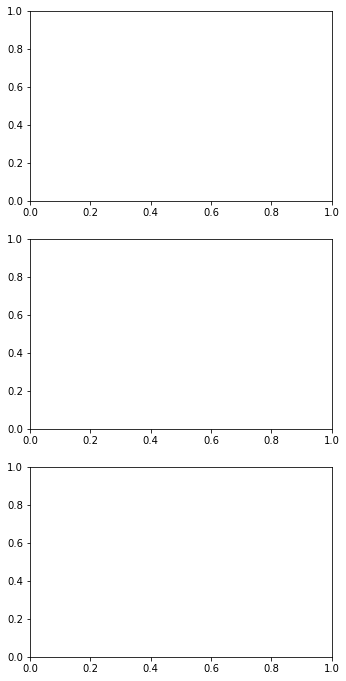

In [21]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
xtckL = ["-90","-45","0","45","90"]
ytck = [-90,-45,0,45,90]
ytckL = ["-90","-45","0","45","90"]
x_eval = np.linspace(-180, 180, num=1000)
deg45 = int(np.round(l/2))
x = range(deg45)
#xL = [-180,-135,-130,-90,-45,-10,0,10,45,90,130,135,180]
x = [[57,45], [45,90], [78,68]]
ytck = [0,60,120, 180]
ytckL = ["0","45","90","135","180"]
#ylab = "Center relative direction (deg.)"
ylab = " "
s=1
_, ax = plt.subplots(len(x), 1, figsize=(figS*0.9, figS*len(x)*0.66))
for ti, t in enumerate(x):
    y = dir_post[:,t[0],t[1],2,2,s]
    y = np.round(y,1)
    if len(np.unique(y))<10:
        print("no variability",np.unique(y))
        Y = [0,2]
        m = int(np.round(np.mean(y)))
        X = [m,m]
    else:
        kde = gaussian_kde(y)
        Y = kde(x_eval)
        X = x_eval.copy()
    axins = ax[ti]
    if ti==0:
        yy = norm.pdf(x_eval, loc=X[np.argmax(Y)], scale=3.8)
    elif ti==1:
        yy = norm.pdf(x_eval, loc=X[np.argmax(Y)], scale=2.5)
    elif ti==2:
        yy = norm.pdf(x_eval, loc=X[np.argmax(Y)], scale=4.9)
    print(X[np.argmax(Y)])
    #axins.plot(X, Y, "-", color="red", linewidth=line_w+5)
    axins.plot(X, yy, "-", color="royalblue", linewidth=line_w+5)
    #axins.set_xlim([0,1])
    axins.set_xlim([-11, 185])
    #stimType = 'Surround direction = '+str(xL[ti])
    #axins.annotate(stimType, xy=(0.1,0.9),xycoords='axes fraction',fontsize=f_font1["size"])
    axins.spines["right"].set_visible(False)
    axins.spines["top"].set_visible(False)
    #axins.spines["bottom"].set_visible(False)
    axins.grid(False)
    #axins.spines["bottom"].set_visible(False)

    #axins.tick_params(right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
    axins.set_xlabel(ylab, **f_font1)
    axins.xaxis.set_ticks(ytck)
    axins.xaxis.set_ticklabels(ytck, **f_font1)

    
    axins.yaxis.set_ticks([0,0.1,0.2])
    axins.set_ylabel(" ", **f_font1)
    #axins.yaxis.set_ticklabels([])
    for labl in (axins.get_xticklabels()+axins.get_yticklabels()):
            labl.set_fontname(f_font1["fontname"])
            labl.set_fontsize(f_font1["size"])
plt.tight_layout()
plt.savefig(sp+"postDir0_samespeed_example_metam2_rel"+str(s)+".pdf")
plt.show()

ValueError: array must not contain infs or NaNs

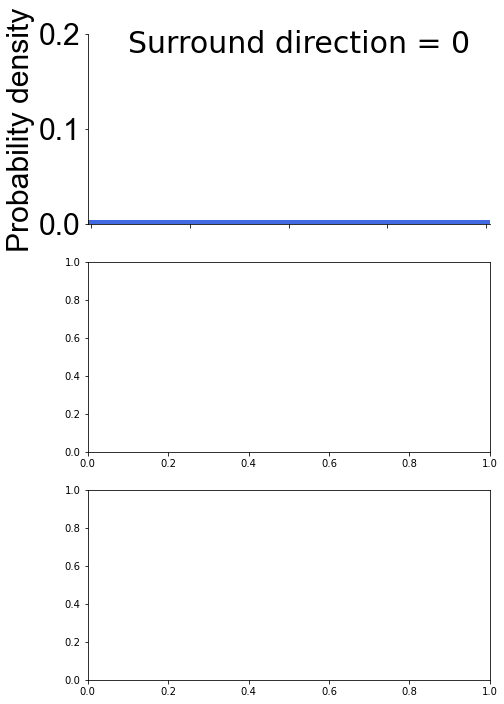

In [22]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
xtckL = ["-90","-45","0","45","90"]
ytck = [-90,-45,0,45,90]
ytckL = ["-90","-45","0","45","90"]
x_eval = np.linspace(-180, 180, num=1000)
deg45 = int(np.round(l/2))
x = [2, 11, 13, 23, 34, 43, 45, 48, 57, 68, 78, 80, 90]
xL = [-180,-135,-130,-90,-45,-10,0,10,45,90,130,135,180]
x = [45, 57, 78,]
xL = [0,45,130,]
ytck = [-60,-30,0,30,60]
ytckL = ["0","45","90","135","180"]
#ylab = "Center relative direction (deg.)"
ylab = "Center relative direction (deg.)"
s=1
_, ax = plt.subplots(len(x), 1, figsize=(figS*1.2, figS*len(x)*0.66))
for ti, t in enumerate(x):
    y1 = dir_post[:,deg45,t,2,2,s]
    y2 = dir_post[:,deg45-1,t,2,2,s]
    y = np.hstack((y1,y2))
    y = np.round(y,1)
    if len(np.unique(y))<10:
        print("no variability",np.unique(y))
        Y = [0,2]
        m = int(np.round(np.mean(y)))
        X = [m,m]
    else:
        if (t==45) or (t==46):
             Y = np.repeat(1/len(x_eval), len(x_eval))
        elif (t==43):
             Y = 0.5*np.repeat(1/len(x_eval), len(x_eval)) + 0.5*norm.pdf(x_eval, loc=21, scale=10)
        elif (t==48):
             Y = 0.5*np.repeat(1/len(x_eval), len(x_eval)) + 0.5*norm.pdf(x_eval, loc=-21, scale=10)
        else:
            kde = gaussian_kde(y)
            Y = kde(x_eval)
        X = x_eval.copy()
    axins = ax[ti]
    axins.plot(X, Y, "-", color="royalblue", linewidth=line_w+5)
    #axins.set_xlim([0,1])
    axins.set_xlim([-61, 61])
    stimType = 'Surround direction = '+str(xL[ti])
    axins.annotate(stimType, xy=(0.1,0.9),xycoords='axes fraction',fontsize=f_font1["size"])
    axins.spines["right"].set_visible(False)
    axins.spines["top"].set_visible(False)
    #axins.spines["bottom"].set_visible(False)
    axins.grid(False)
    if ti==len(x)-1:
        #axins.tick_params(right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
        axins.set_xlabel(ylab, **f_font1)
        axins.xaxis.set_ticks(ytck)
        axins.xaxis.set_ticklabels(ytck, **f_font1)
        #xxr,xxrL = [0,0.01], ["0","0.01"]
    else:
        #axins.tick_params(left=False,right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
        axins.xaxis.set_ticks(ytck)
        axins.xaxis.set_ticklabels([" " for i in range(len(ytck))], **f_font1)
        axins.set_xlabel(" ")
        #xxr,xxrL = [0, np.round(np.max(Y[t, :, r])*0.66,2)], ["0", str(np.round(np.max(Y[t, :, r])*0.66,2))]
    axins.yaxis.set_ticks([0,0.1,0.2])
    axins.set_ylabel("Probability density", **f_font1)
    #axins.yaxis.set_ticklabels([])
    for labl in (axins.get_xticklabels()+axins.get_yticklabels()):
            labl.set_fontname(f_font1["fontname"])
            labl.set_fontsize(f_font1["size"])
plt.tight_layout()
plt.savefig(sp+"postDir0_samespeed_3example_surround_rel"+str(s)+".pdf")
plt.show()

ValueError: array must not contain infs or NaNs

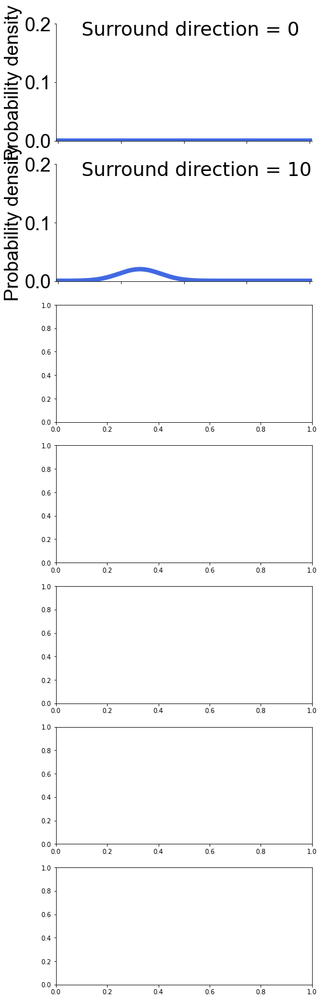

In [23]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
xtckL = ["-90","-45","0","45","90"]
ytck = [-90,-45,0,45,90]
ytckL = ["-90","-45","0","45","90"]
x_eval = np.linspace(-180, 180, num=1000)
deg45 = int(np.round(l/2))
x = [2, 11, 13, 23, 34, 43, 45, 48, 57, 68, 78, 80, 90]
xL = [-180,-135,-130,-90,-45,-10,0,10,45,90,130,135,180]
x = [45, 48, 57, 68, 78, 80,88]
xL = [0,10,45,90,130,135,180]
ytck = [-60,-30,0,30,60]
ytckL = ["0","45","90","135","180"]
#ylab = "Center relative direction (deg.)"
ylab = "Center relative direction (deg.)"
s=1
_, ax = plt.subplots(len(x), 1, figsize=(figS*1.2, figS*len(x)*0.66))
for ti, t in enumerate(x):
    y1 = dir_post[:,deg45,t,2,2,s]
    y2 = dir_post[:,deg45-1,t,2,2,s]
    y = np.hstack((y1,y2))
    y = np.round(y,1)
    if len(np.unique(y))<10:
        print("no variability",np.unique(y))
        Y = [0,2]
        m = int(np.round(np.mean(y)))
        X = [m,m]
    else:
        if (t==45) or (t==46):
             Y = np.repeat(1/len(x_eval), len(x_eval))
        elif (t==43):
             Y = 0.5*np.repeat(1/len(x_eval), len(x_eval)) + 0.5*norm.pdf(x_eval, loc=21, scale=10)
        elif (t==48):
             Y = 0.5*np.repeat(1/len(x_eval), len(x_eval)) + 0.5*norm.pdf(x_eval, loc=-21, scale=10)
        else:
            kde = gaussian_kde(y)
            Y = kde(x_eval)
        X = x_eval.copy()
    axins = ax[ti]
    axins.plot(X, Y, "-", color="royalblue", linewidth=line_w+5)
    #axins.set_xlim([0,1])
    axins.set_xlim([-61, 61])
    stimType = 'Surround direction = '+str(xL[ti])
    axins.annotate(stimType, xy=(0.1,0.9),xycoords='axes fraction',fontsize=f_font1["size"])
    axins.spines["right"].set_visible(False)
    axins.spines["top"].set_visible(False)
    #axins.spines["bottom"].set_visible(False)
    axins.grid(False)
    if ti==len(x)-1:
        #axins.tick_params(right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
        axins.set_xlabel(ylab, **f_font1)
        axins.xaxis.set_ticks(ytck)
        axins.xaxis.set_ticklabels(ytck, **f_font1)
        #xxr,xxrL = [0,0.01], ["0","0.01"]
    else:
        #axins.tick_params(left=False,right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
        axins.xaxis.set_ticks(ytck)
        axins.xaxis.set_ticklabels([" " for i in range(len(ytck))], **f_font1)
        axins.set_xlabel(" ")
        #xxr,xxrL = [0, np.round(np.max(Y[t, :, r])*0.66,2)], ["0", str(np.round(np.max(Y[t, :, r])*0.66,2))]
    axins.yaxis.set_ticks([0,0.1,0.2])
    axins.set_ylabel("Probability density", **f_font1)
    #axins.yaxis.set_ticklabels([])
    for labl in (axins.get_xticklabels()+axins.get_yticklabels()):
            labl.set_fontname(f_font1["fontname"])
            labl.set_fontsize(f_font1["size"])
plt.tight_layout()
plt.savefig(sp+"postDir0_samespeed_example_surround_rel"+str(s)+".pdf")
plt.show()

[[   nan -173.4  -12.5 ...  -35.6    8.7   -6.4]
 [   nan -137.4  -29.  ...   -3.9  -19.1   15.2]
 [   nan -102.2   -1.1 ...  128.7   -1.3    7.1]
 ...
 [   nan -162.9  -22.8 ...  -75.5   -4.    -0.4]
 [   nan -114.    -5.2 ...   26.3   14.3  -17.2]
 [   nan -149.1  -34.8 ...   50.9   36.8  -40.6]]
[[  nan 147.7  88.6 ... 117.  103.8  37.3]
 [ 94.5 110.5  63.7 ...  96.1  60.2  55.8]
 [  nan 103.4 109.6 ... 117.5  67.3  55.2]
 ...
 [  nan 112.  105.  ... 112.3  71.1  49.7]
 [  nan  99.   66.1 ... 116.5  73.2  44. ]
 [  nan 118.7 111.4 ... 101.2  58.9  58.5]]


ValueError: array must not contain infs or NaNs

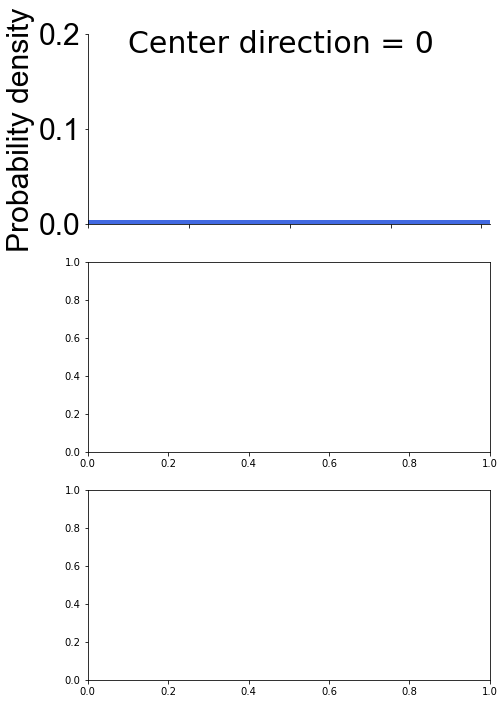

In [26]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
xtckL = ["-90","-45","0","45","90"]
ytck = [-180,-90,0,90,179]
ytckL = ["-90","-45","0","45","90"]
x_eval = np.linspace(-180, 180, num=1000)
deg45 = int(np.round(l/2))
x = [2, 11, 13, 23, 34, 43, 45, 48, 57, 68, 78, 80,88]
xL = [-180,-135,-130,-90,-45,-10,0,10,45,90,130,135,180]
x = [45, 57,  78]
xL = [0,45,130]
ytck = [0,45,90,135,175]
ytckL = ["0","45","90","135","180"]
#ylab = "Center relative direction (deg.)"
ylab = "Center relative direction (deg.)"
s=1
_, ax = plt.subplots(len(x), 1, figsize=(figS*1.2, figS*len(x)*0.66))
for ti, t in enumerate(x):
    y1 = dir_post[:,t,deg45,2,2,s]
    y2 = dir_post[:,t,deg45-1,2,2,s]
    y = np.hstack((y1,y2))
    y = np.round(y,1)
    print(y)
    if len(np.unique(y))<10:
        print("no variability",np.unique(y))
        Y = [0,2]
        m = int(np.round(np.mean(y)))
        X = [m,m]
    else:
        if (t==45) or (t==46):
             Y = np.repeat(1/len(x_eval), len(x_eval))
        elif (t==43):
             Y = norm.pdf(x_eval, loc=-25, scale=5)
        elif (t==48):
             Y = norm.pdf(x_eval, loc=25, scale=5)
        else:
            kde = gaussian_kde(y)
            Y = kde(x_eval)
        X = x_eval.copy()
    axins = ax[ti]
    axins.plot(X, Y, "-", color="royalblue", linewidth=line_w+5)
    #axins.set_xlim([0,1])
    axins.set_xlim([0, 179])
    stimType = 'Center direction = '+str(xL[ti])
    axins.annotate(stimType, xy=(0.1,0.9),xycoords='axes fraction',fontsize=f_font1["size"])
    axins.spines["right"].set_visible(False)
    axins.spines["top"].set_visible(False)
    #axins.spines["bottom"].set_visible(False)
    axins.grid(False)
    if ti==len(x)-1:
        #axins.tick_params(right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
        axins.set_xlabel(ylab, **f_font1)
        axins.xaxis.set_ticks(ytck)
        axins.xaxis.set_ticklabels(ytckL, **f_font1)
        #xxr,xxrL = [0,0.01], ["0","0.01"]
    else:
        #axins.tick_params(left=False,right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
        axins.xaxis.set_ticks(ytck)
        axins.xaxis.set_ticklabels([" " for i in range(len(ytck))], **f_font1)
        axins.set_xlabel(" ")
        #xxr,xxrL = [0, np.round(np.max(Y[t, :, r])*0.66,2)], ["0", str(np.round(np.max(Y[t, :, r])*0.66,2))]
    axins.yaxis.set_ticks([0,0.1,0.2])
    axins.set_ylabel("Probability density", **f_font1)
    #axins.yaxis.set_ticklabels([])
    for labl in (axins.get_xticklabels()+axins.get_yticklabels()):
            labl.set_fontname(f_font1["fontname"])
            labl.set_fontsize(f_font1["size"])
plt.tight_layout()
plt.savefig(sp+"postDir0_samespeed_3example_center_rel"+str(s)+".pdf")
plt.show()

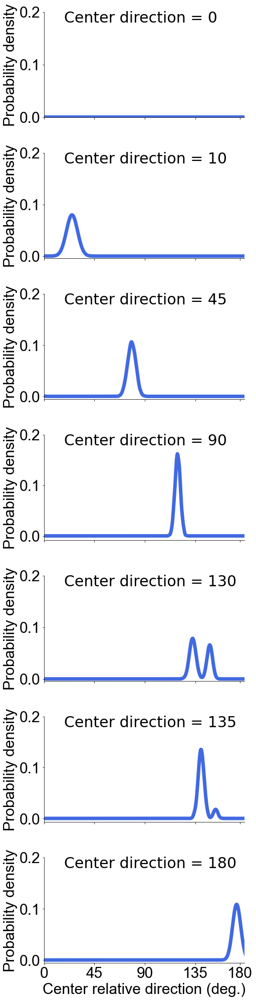

In [10]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
xtckL = ["-90","-45","0","45","90"]
ytck = [-180,-90,0,90,179]
ytckL = ["-90","-45","0","45","90"]
x_eval = np.linspace(-180, 180, num=1000)
deg45 = int(np.round(l/2))
x = [2, 11, 13, 23, 34, 43, 45, 48, 57, 68, 78, 80,88]
xL = [-180,-135,-130,-90,-45,-10,0,10,45,90,130,135,180]
x = [45, 48, 57, 68, 78, 80,88]
xL = [0,10,45,90,130,135,180]
ytck = [0,45,90,135,175]
ytckL = ["0","45","90","135","180"]
#ylab = "Center relative direction (deg.)"
ylab = "Center relative direction (deg.)"
s=1
_, ax = plt.subplots(len(x), 1, figsize=(figS*1.2, figS*len(x)*0.66))
for ti, t in enumerate(x):
    y1 = dir_post[:,t,deg45,2,2,s]
    y2 = dir_post[:,t,deg45-1,2,2,s]
    y = np.hstack((y1,y2))
    y = np.round(y,1)
    if len(np.unique(y))<10:
        print("no variability",np.unique(y))
        Y = [0,2]
        m = int(np.round(np.mean(y)))
        X = [m,m]
    else:
        if (t==45) or (t==46):
             Y = np.repeat(1/len(x_eval), len(x_eval))
        elif (t==43):
             Y = norm.pdf(x_eval, loc=-25, scale=5)
        elif (t==48):
             Y = norm.pdf(x_eval, loc=25, scale=5)
        else:
            kde = gaussian_kde(y)
            Y = kde(x_eval)
        X = x_eval.copy()
    axins = ax[ti]
    axins.plot(X, Y, "-", color="royalblue", linewidth=line_w+5)
    #axins.set_xlim([0,1])
    axins.set_xlim([0, 179])
    stimType = 'Center direction = '+str(xL[ti])
    axins.annotate(stimType, xy=(0.1,0.9),xycoords='axes fraction',fontsize=f_font1["size"])
    axins.spines["right"].set_visible(False)
    axins.spines["top"].set_visible(False)
    #axins.spines["bottom"].set_visible(False)
    axins.grid(False)
    if ti==len(x)-1:
        #axins.tick_params(right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
        axins.set_xlabel(ylab, **f_font1)
        axins.xaxis.set_ticks(ytck)
        axins.xaxis.set_ticklabels(ytckL, **f_font1)
        #xxr,xxrL = [0,0.01], ["0","0.01"]
    else:
        #axins.tick_params(left=False,right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
        axins.xaxis.set_ticks(ytck)
        axins.xaxis.set_ticklabels([" " for i in range(len(ytck))], **f_font1)
        axins.set_xlabel(" ")
        #xxr,xxrL = [0, np.round(np.max(Y[t, :, r])*0.66,2)], ["0", str(np.round(np.max(Y[t, :, r])*0.66,2))]
    axins.yaxis.set_ticks([0,0.1,0.2])
    axins.set_ylabel("Probability density", **f_font1)
    #axins.yaxis.set_ticklabels([])
    for labl in (axins.get_xticklabels()+axins.get_yticklabels()):
            labl.set_fontname(f_font1["fontname"])
            labl.set_fontsize(f_font1["size"])
plt.tight_layout()
plt.savefig(sp+"postDir0_samespeed_example_center_rel"+str(s)+".pdf")
plt.show()

no variability [1.8 1.9 2.  2.1 2.2]
no variability [3.8 3.9 4.  4.1 4.2]
no variability [5.7 5.8 5.9 6.  6.1 6.2]
no variability [7.7 7.8 7.9 8.  8.1 8.2]
no variability [ 9.6  9.7  9.8  9.9 10.  10.1 10.2]
no variability [11.4 11.5 11.6 11.7 11.8 11.9 12.  12.1 12.2]
no variability [13.4 13.5 13.6 13.7 13.8 13.9 14.  14.1 14.2]
no variability [0.]
no variability [-20.2 -20.1 -20.  -19.9 -19.8 -19.1 -19.  -18.9 -18.8]
no variability [-18.2 -18.1 -18.  -17.9 -17.8 -17.2 -17.1 -17.  -16.9]
no variability [-6.2 -6.1 -6.  -5.9 -5.8 -5.7 -5.6 -5.5 -5.4]
no variability [-4.2 -4.1 -4.  -3.9 -3.8 -3.7 -3.6 -3.5]
no variability [-2.2 -2.1 -2.  -1.9 -1.8 -1.7 -1.6]
no variability [-0.3 -0.2 -0.1 -0.   0.1  0.2  0.3  0.4]
no variability [1.8 1.9 2.  2.1 2.2 2.3]


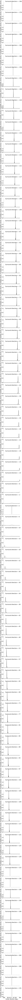

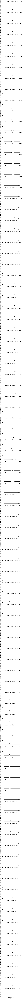

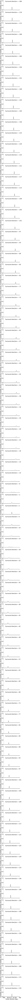

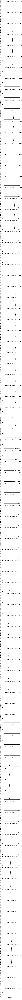

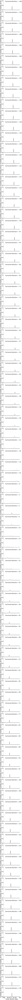

In [10]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
xtckL = ["-90","-45","0","45","90"]
ytck = [-180,-90,-45,0,45,90,180]
ytckL = ["-90","-45","0","45","90"]
x_eval = np.linspace(-180, 180, num=1000)
deg45 = int(np.round(l/2))
x = np.arange(l)
xL = [str(round(i)) for i in x*360/l-180]
#ylab = "Center relative direction (deg.)"
ylab = "Center direction (deg.)"
for s in range(5):
    _, ax = plt.subplots(l, 1, figsize=(figS*1.2, figS*l*0.6))
    for ti, t in enumerate(x):
        y = dir_post[:,deg45,t,2,2,s]
        y = np.round(y,1)
        if len(np.unique(y))<10:
            print("no variability",np.unique(y))
            Y = [0,2]
            m = int(np.round(np.mean(y)))
            X = [m,m]
        else:
            kde = gaussian_kde(y)
            Y = kde(x_eval)
            X = x_eval.copy()
        axins = ax[ti]
        axins.plot(X, Y, "-", color='k', linewidth=line_w)
        #axins.set_xlim([0,1])
        axins.set_xlim([-91, 91])
        stimType = 'Surround direction = '+str(xL[t])
        axins.annotate(stimType, xy=(0.1,0.9),xycoords='axes fraction',fontsize=f_font1["size"])
        axins.spines["right"].set_visible(False)
        axins.spines["top"].set_visible(False)
        #axins.spines["bottom"].set_visible(False)
        axins.grid(False)
        if ti==l-1:
            #axins.tick_params(right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
            axins.set_xlabel(ylab, **f_font1)
            axins.xaxis.set_ticks(ytck)
            axins.xaxis.set_ticklabels(ytck, **f_font1)
            #xxr,xxrL = [0,0.01], ["0","0.01"]
        else:
            #axins.tick_params(left=False,right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
            axins.xaxis.set_ticklabels([])
            axins.set_xlabel(" ")
            #xxr,xxrL = [0, np.round(np.max(Y[t, :, r])*0.66,2)], ["0", str(np.round(np.max(Y[t, :, r])*0.66,2))]
        axins.yaxis.set_ticks([0,0.5,1])
        axins.set_ylabel("Probability density", **f_font1)
        #axins.yaxis.set_ticklabels([])
        for labl in (axins.get_xticklabels()+axins.get_yticklabels()):
                labl.set_fontname(f_font1["fontname"])
                labl.set_fontsize(f_font1["size"])
    plt.tight_layout()
    plt.savefig(sp+"postDir0_samespeed_sub_ret"+str(s)+".pdf")
    plt.show()

no variability [3.6 3.7 3.8 3.9 4.  4.1 4.2 4.3 4.4]
no variability [3.6 3.7 3.8 3.9 4.  4.1 4.2 4.3 4.4]
no variability [3.6 3.7 3.8 3.9 4.  4.1 4.2 4.3 4.4]
no variability [3.7 3.8 3.9 4.  4.1 4.2 4.3 4.4]
no variability [3.7 3.8 3.9 4.  4.1 4.2 4.3 4.4 4.5]
no variability [3.6 3.7 3.8 3.9 4.  4.1 4.2 4.3 4.4]
no variability [3.6 3.7 3.8 3.9 4.  4.1 4.2 4.3 4.4]
no variability [3.6 3.7 3.8 3.9 4.  4.1 4.2 4.3 4.4]
no variability [3.6 3.7 3.8 3.9 4.  4.1 4.2 4.3 4.4]
no variability [3.6 3.7 3.8 3.9 4.  4.1 4.2 4.3 4.4]
no variability [3.8 3.9 4.  4.1 4.2]
no variability [3.6 3.7 3.8 3.9 4.  4.1 4.2 4.3 4.4]
no variability [3.6 3.7 3.8 3.9 4.  4.1 4.2 4.3 4.4]
no variability [3.6 3.7 3.8 3.9 4.  4.1 4.2 4.3 4.4]
no variability [3.6 3.7 3.8 3.9 4.  4.1 4.2 4.3 4.4]
no variability [3.6 3.7 3.8 3.9 4.  4.1 4.2 4.3 4.4]
no variability [3.6 3.7 3.8 3.9 4.  4.1 4.2 4.3 4.4]
no variability [3.6 3.7 3.8 3.9 4.  4.1 4.2 4.3 4.4]


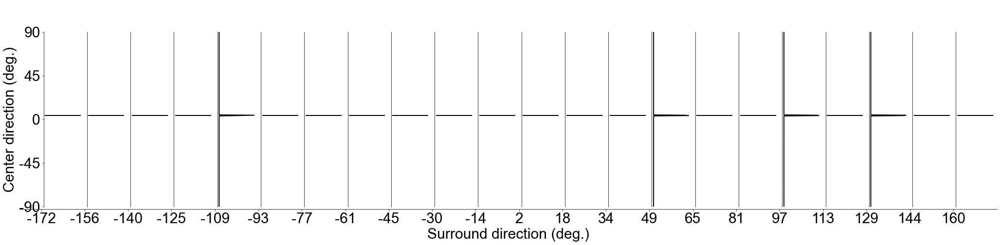

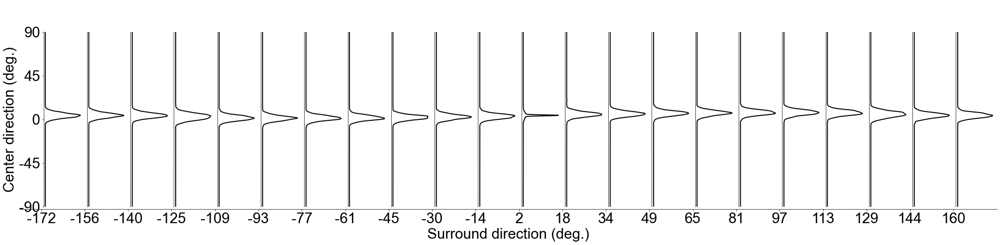

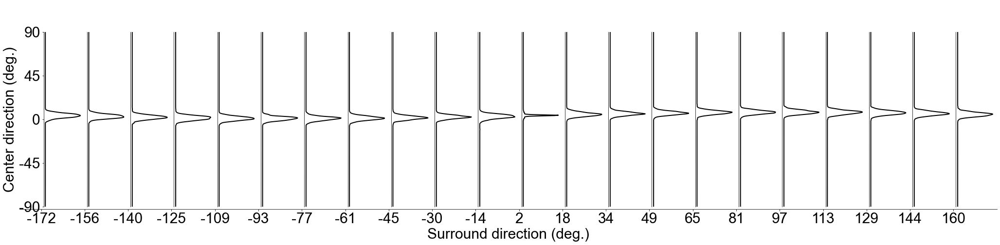

no variability [3.5 3.6 3.7 3.8 3.9 4.  4.1 4.2 4.3]


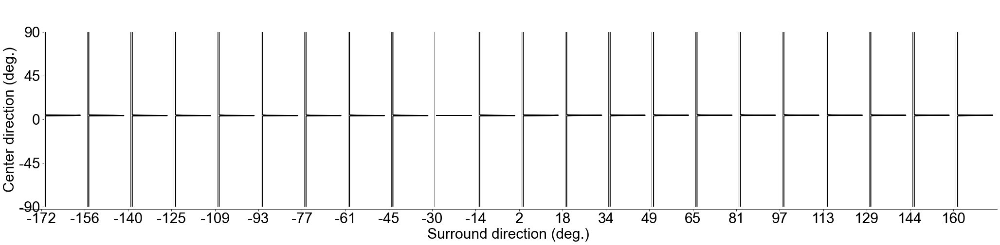

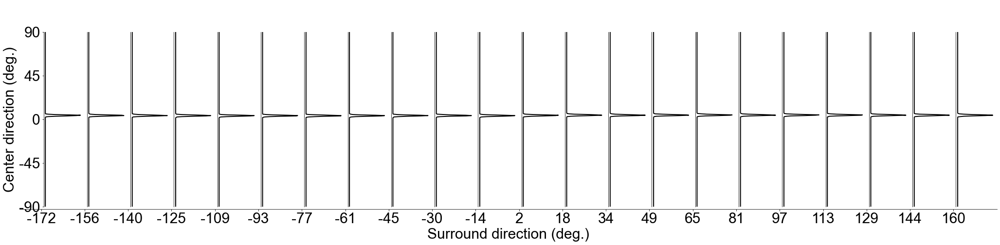

In [4]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
xtckL = ["-90","-45","0","45","90"]
ytck = [-90,-45,0,45,90]
ytckL = ["-90","-45","0","45","90"]
x_eval = np.linspace(-180, 180, num=1000)
deg45 = int(np.round(l/2))
x = np.arange(l)
xL = [str(round(i)) for i in x*360/l-180]
#ylab = "Center relative direction (deg.)"
ylab = "Center direction (deg.)"
for s in range(5):
    _, ax = plt.subplots(l, 1, figsize=(figS*6, figS*l))
    for ti, t in enumerate(x):
        y = dir_post[:,deg45,t,2,2,s]
        y = np.round(y,1)
        if len(np.unique(y))<10:
            print("no variability",np.unique(y))
            Y = [0,2]
            m = int(np.round(np.mean(y)))
            X = [m,m]
        else:
            kde = gaussian_kde(y)
            Y = kde(x_eval)
            X = x_eval.copy()
        axins=ax[ti]
        axins.plot(Y, X, "-", color='k', linewidth=line_w)
        #axins.set_xlim([0,1])
        axins.set_xlim([-91, 91])
        #axins.annotate(stimType, xy=(0.7,0.9),xycoords='axes fraction',fontsize=12)
        axins.spines["right"].set_visible(False)
        axins.spines["top"].set_visible(False)
        #axins.spines["bottom"].set_visible(False)
        axins.grid(False)
        if ti==l:
            #axins.tick_params(right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
            axins.set_xlabel(ylab, **f_font1)
            axins.xaxis.set_ticks(ytck)
            axins.xaxis.set_ticklabels(ytckL, **f_font1)
            #xxr,xxrL = [0,0.01], ["0","0.01"]
        else:
            #axins.tick_params(left=False,right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
            axins.xaxis.set_ticklabels([])
            axins.set_xlabel(" ")
            #xxr,xxrL = [0, np.round(np.max(Y[t, :, r])*0.66,2)], ["0", str(np.round(np.max(Y[t, :, r])*0.66,2))]
        #axins.xaxis.set_ticks(xxr)
        axins.yaxis.set_ticks([0,0.5,1])
        for labl in (axins.get_xticklabels()+axins.get_yticklabels()):
                labl.set_fontname(f_font1["fontname"])
                labl.set_fontsize(f_font1["size"])
     
    ax.set_xlabel('Surround direction (deg.)', **f_font1)
    ax.xaxis.set_ticks(x)
    ax.xaxis.set_ticklabels(xL, **f_font1)

    #ax.set_title(Tit[i], y=1.0, pad=-64, **f2)
    plt.savefig(sp+"postDir0_samespeed_sub_ret"+str(s)+".pdf")
    plt.show()

In [9]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
xtckL = ["-180","-90","0","90","180"]
ytck = [-180,-90,0,90,180]
ytckL = ["-180","-90","0","90","180"]
x_eval = np.linspace(-180, 180, num=1000)
deg45 = int(np.round(l/2))
x = np.arange(2,l-2,4)
xL = [str(round(i)) for i in x*360/l-180]
ylab = "Center relative direction (deg.)"
for s in range(5):
    _, ax = plt.subplots(1, 1, figsize=(figS*6, figS*1.3))
    for ti, t in enumerate(x):
        y = dir_post[:,deg45,t,4,2,s]
        y = np.round(y,1)
        if len(np.unique(y))<10:
            print("no variability",np.unique(y))
            Y = [0,2]
            m = int(np.round(np.mean(y)))
            X = [m,m]
        else:
            kde = gaussian_kde(y)
            Y = kde(x_eval)
            X = x_eval.copy()
        axins = inset_axes(ax, width=1.1, height=5,
                        bbox_to_anchor=(t, 0, t, 1),
                        bbox_transform=ax.transData, loc=3)
        
        axins.plot(Y, X, "-", color='k', linewidth=line_w)
        #axins.set_xlim([0,1])
        axins.set_ylim([-180, 180])
        #axins.annotate(stimType, xy=(0.7,0.9),xycoords='axes fraction',fontsize=12)
        axins.spines["right"].set_visible(False)
        axins.spines["top"].set_visible(False)
        axins.spines["bottom"].set_visible(False)
        axins.grid(False)
        if ti==0:
            axins.tick_params(right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
            axins.set_ylabel(ylab, **f_font1)
            axins.yaxis.set_ticks(ytck)
            axins.yaxis.set_ticklabels(ytckL, **f_font1)
            #xxr,xxrL = [0,0.01], ["0","0.01"]
        else:
            axins.tick_params(left=False,right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
            axins.yaxis.set_ticklabels([])
            axins.set_ylabel(" ")
            #xxr,xxrL = [0, np.round(np.max(Y[t, :, r])*0.66,2)], ["0", str(np.round(np.max(Y[t, :, r])*0.66,2))]
        #axins.xaxis.set_ticks(xxr)
        axins.xaxis.set_ticklabels([])
        for labl in (axins.get_xticklabels()+axins.get_yticklabels()):
                labl.set_fontname(f_font1["fontname"])
                labl.set_fontsize(f_font1["size"])
        #axins.legend(fontsize=10)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.grid(False)
    ax.tick_params(left=False,right=False)
    ax.set_xlabel('Surround direction (deg.)', **f_font1)
    ax.xaxis.set_ticks(x)
    ax.xaxis.set_ticklabels(xL, **f_font1)
    # ax.set_ylabel(self.model.params.perceptualFeature, **f1)
    #ax.set_ylim([0,1])
    ax.set_xlim([0,l-1])
    ax.yaxis.set_ticklabels([], **f_font1)
    for labl in (ax.get_xticklabels()+ax.get_yticklabels()):
                labl.set_fontname(f_font1["fontname"])
                labl.set_fontsize(f_font1["size"])
    #ax.set_title(Tit[i], y=1.0, pad=-64, **f2)
    plt.savefig(sp+"postDir0_slowSurr_sub"+str(s)+".pdf")
    plt.show()

NameError: name 'dir_post' is not defined

In [10]:
# open the file in read mode
with h5py.File('/Users/glengyel/Projects_data/Neural Predictions/post_mix_spd.mat', 'r') as file:
    # list all the keys in the root group
    print(list(file.keys()))

    # access a dataset
    spd_post = file['spe_post']
    print(spd_post.shape)
    spd_post = np.array(spd_post)
    print(spd_post.shape)

['spe_post']
(1000, 91, 91, 5, 5, 5)


KeyboardInterrupt: 

Speed: 7cps
direction: center=0, surround= -125


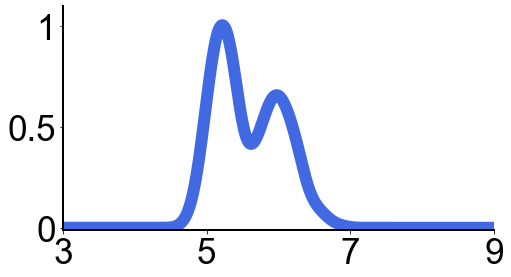

In [ ]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
ytck = [3,5,7,9]
ytckL = ["0","3","6","9","12"]
x_eval = np.linspace(0, 13, num=1000)
deg45 = int(np.round(l/2))
x = np.arange(2,l-2,4)
xL = [str(round(i)) for i in x*360/l-180]
_, ax = plt.subplots(1, 1, figsize=(figS*1.2, figS*.66))
kde = gaussian_kde(spd_post[:,deg45,x[3],2,2,1])
print("Speed: 7cps")
print("direction: center=0, surround=", xL[3])
Y = kde(x_eval)
X = x_eval.copy()
ax.plot(X,Y,  color="royalblue", linewidth=line_w+10)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_linewidth(line_w)
ax.spines["bottom"].set_linewidth(line_w)
ax.spines["left"].set_linewidth(line_w)
ax.grid(False)
for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    label.set_fontname(f_font1["fontname"])
    label.set_fontsize(35)
ax.xaxis.set_ticks(ytck)
ax.yaxis.set_ticks([0,0.5, 1])
ax.xaxis.set_ticklabels(ytck)
ax.set_xlim(3, 9)
ax.set_ylim(-0.01, 1.1)
ax.yaxis.set_ticklabels([0,0.5, 1])
#ax.set_xlabel(" ")
#ax.set_ylabel(L[i], **f_font2)
plt.tight_layout()
plt.savefig(sp+"1PostSpd_subj2_rel.pdf")
plt.show()

In [ ]:
np.where((Y>0.6) & (Y<0.8))[0]

array([384, 385, 386, 387, 388, 389, 414, 415, 416, 417, 418, 419, 450,
       451, 452, 453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463,
       464, 465, 466, 467, 468])

In [ ]:
Y[np.where((Y>0.6) & (Y<0.8))[0]]

array([0.62385195, 0.66059308, 0.69672622, 0.73197251, 0.76605654,
       0.79871056, 0.77591734, 0.74490434, 0.7134402 , 0.68192307,
       0.65075934, 0.62035332, 0.60362026, 0.61439418, 0.62420004,
       0.63292584, 0.64047477, 0.64676669, 0.65173917, 0.65534809,
       0.65756771, 0.65839028, 0.65782515, 0.65589737, 0.65264591,
       0.64812149, 0.64238413, 0.63550045, 0.62754091, 0.61857699,
       0.60867851])

Speed: 7cps
direction: center=0, surround= -125


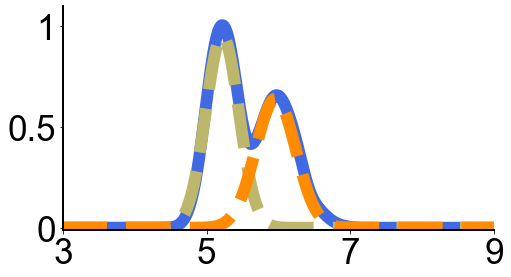

5.218218218218218 5.95995995995996


In [ ]:


l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
ytck = [3,5,7,9]
ytckL = ["0","3","6","9","12"]
x_eval = np.linspace(0, 13, num=1000)
deg45 = int(np.round(l/2))
x = np.arange(2,l-2,4)
xL = [str(round(i)) for i in x*360/l-180]
_, ax = plt.subplots(1, 1, figsize=(figS*1.2, figS*.66))
kde = gaussian_kde(spd_post[:,deg45,x[3],2,2,1])
print("Speed: 7cps")
print("direction: center=0, surround=", xL[3])
Y = kde(x_eval)
X = x_eval.copy()
ax.plot(X,Y,  color="royalblue", linewidth=line_w+10)
yy = norm.pdf(x_eval, loc=X[np.argmax(Y)], scale=.23)
ax.plot(X,yy*0.55, "--", color="darkkhaki", linewidth=line_w+10)
yy = norm.pdf(x_eval, loc=X[458], scale=.28)
ax.plot(X,yy*0.45, "--", color="darkorange", linewidth=line_w+10)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_linewidth(line_w)
ax.spines["bottom"].set_linewidth(line_w)
ax.spines["left"].set_linewidth(line_w)
ax.grid(False)
for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    label.set_fontname(f_font1["fontname"])
    label.set_fontsize(35)
ax.xaxis.set_ticks(ytck)
ax.yaxis.set_ticks([0,0.5, 1])
ax.xaxis.set_ticklabels(ytck)
ax.set_xlim(3, 9)
ax.set_ylim(-0.01, 1.1)
ax.yaxis.set_ticklabels([0,0.5, 1])
#ax.set_xlabel(" ")
#ax.set_ylabel(L[i], **f_font2)
plt.tight_layout()
plt.savefig(sp+"1PostSpd_mix_subj2_rel.pdf")
plt.show()
print(X[np.argmax(Y)], X[458])

Speed: 7cps
direction: center=0, surround= -125


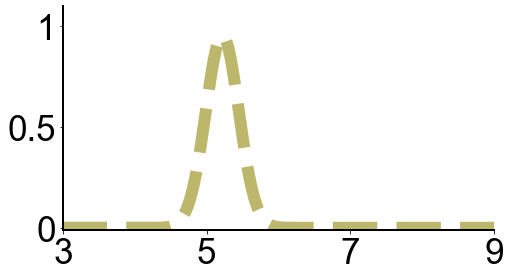

In [ ]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
ytck = [3,5,7,9]
ytckL = ["0","3","6","9","12"]
x_eval = np.linspace(0, 13, num=1000)
deg45 = int(np.round(l/2))
x = np.arange(2,l-2,4)
xL = [str(round(i)) for i in x*360/l-180]
_, ax = plt.subplots(1, 1, figsize=(figS*1.2, figS*.66))
kde = gaussian_kde(spd_post[:,deg45,x[3],2,2,1])
print("Speed: 7cps")
print("direction: center=0, surround=", xL[3])
Y = kde(x_eval)
X = x_eval.copy()
#ax.plot(X,Y,  color="royalblue", linewidth=line_w+5)
yy = norm.pdf(x_eval, loc=X[np.argmax(Y)], scale=.23)
ax.plot(X,yy*0.55, "--", color="darkkhaki", linewidth=line_w+10)
#yy = norm.pdf(x_eval, loc=X[458], scale=.28)
#ax.plot(X,yy*0.45, "--", color="darkorange", linewidth=line_w+5)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_linewidth(line_w)
ax.spines["bottom"].set_linewidth(line_w)
ax.spines["left"].set_linewidth(line_w)
ax.grid(False)
for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    label.set_fontname(f_font1["fontname"])
    label.set_fontsize(35)
ax.xaxis.set_ticks(ytck)
ax.yaxis.set_ticks([0,0.5, 1])
ax.xaxis.set_ticklabels(ytck)
ax.set_xlim(3, 9)
ax.set_ylim(-0.01, 1.1)
ax.yaxis.set_ticklabels([0,0.5, 1])
#ax.set_xlabel(" ")
#ax.set_ylabel(L[i], **f_font2)
plt.tight_layout()
plt.savefig(sp+"1PostSpd_mix1_subj2_rel.pdf")
plt.show()

Speed: 7cps
direction: center=0, surround= -125


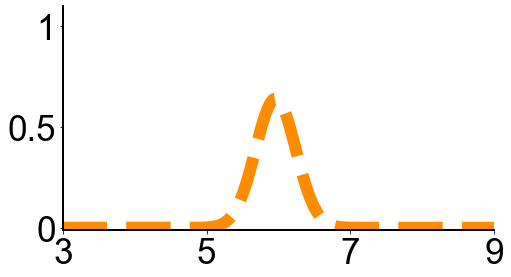

In [ ]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
ytck = [3,5,7,9]
ytckL = ["0","3","6","9","12"]
x_eval = np.linspace(0, 13, num=1000)
deg45 = int(np.round(l/2))
x = np.arange(2,l-2,4)
xL = [str(round(i)) for i in x*360/l-180]
_, ax = plt.subplots(1, 1, figsize=(figS*1.2, figS*.66))
kde = gaussian_kde(spd_post[:,deg45,x[3],2,2,1])
print("Speed: 7cps")
print("direction: center=0, surround=", xL[3])
Y = kde(x_eval)
X = x_eval.copy()
#ax.plot(X,Y,  color="royalblue", linewidth=line_w+5)
#yy = norm.pdf(x_eval, loc=X[np.argmax(Y)], scale=.23)
#ax.plot(X,yy*0.55, "--", color="gold", linewidth=line_w+5)
yy = norm.pdf(x_eval, loc=X[458], scale=.28)
ax.plot(X,yy*0.45, "--", color="darkorange", linewidth=line_w+10)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_linewidth(line_w)
ax.spines["bottom"].set_linewidth(line_w)
ax.spines["left"].set_linewidth(line_w)
ax.grid(False)
for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    label.set_fontname(f_font1["fontname"])
    label.set_fontsize(35)
ax.xaxis.set_ticks(ytck)
ax.yaxis.set_ticks([0,0.5, 1])
ax.xaxis.set_ticklabels(ytck)
ax.set_xlim(3, 9)
ax.set_ylim(-0.01, 1.1)
ax.yaxis.set_ticklabels([0,0.5, 1])
#ax.set_xlabel(" ")
#ax.set_ylabel(L[i], **f_font2)
plt.tight_layout()
plt.savefig(sp+"1PostSpd_mix2_subj2_rel.pdf")
plt.show()

Speed: 7cps
direction: center=0, surround= -125


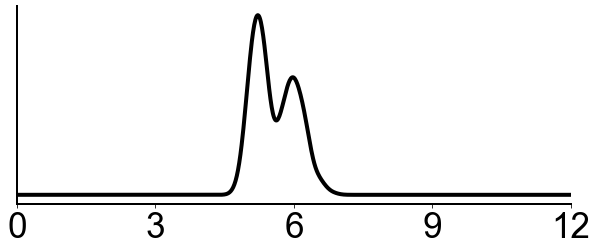

In [ ]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
#xtckL = ["-90","-45","0","45","90"]
ytck = [0,3,6,9,12]
ytckL = ["0","3","6","9","12"]
x_eval = np.linspace(0, 13, num=1000)
deg45 = int(np.round(l/2))
x = np.arange(2,l-2,4)
xL = [str(round(i)) for i in x*360/l-180]
_, ax = plt.subplots(1, 1, figsize=(figS*1.4, figS*.6))
kde = gaussian_kde(spd_post[:,deg45,x[3],2,2,1])
print("Speed: 7cps")
print("direction: center=0, surround=", xL[3])
Y = kde(x_eval)
X = x_eval.copy()
ax.plot(X,Y,  'k-', linewidth=line_w+2)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_linewidth(line_w)
ax.spines["bottom"].set_linewidth(line_w)
ax.spines["left"].set_linewidth(line_w)
ax.grid(False)
for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    label.set_fontname(f_font1["fontname"])
    label.set_fontsize(35)
ax.xaxis.set_ticks(ytck)
#ax.yaxis.set_ticks([0,0.5, 1])
ax.xaxis.set_ticklabels(ytckL)
ax.set_xlim(0, 12)
#ax.set_ylim(-0.03, 1)
ax.yaxis.set_ticks([])
#ax.set_xlabel(" ")
#ax.set_ylabel(L[i], **f_font2)
plt.tight_layout()
plt.savefig(sp+"onePostSpd_subj2_rel.pdf")
plt.show()

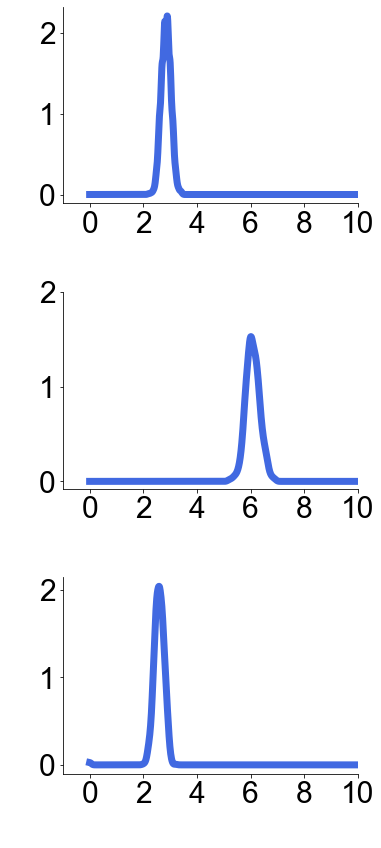

In [ ]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
xtckL = ["-90","-45","0","45","90"]
ytck = [-90,-45,0,45,90]
ytckL = ["-90","-45","0","45","90"]
x_eval = np.linspace(-180, 180, num=1000)
deg45 = int(np.round(l/2))
x = range(deg45)
#xL = [-180,-135,-130,-90,-45,-10,0,10,45,90,130,135,180]
x = [[57,45], [45,90], [78,68]]
ytck = [0,2,4,6,8,10]
ytckL = ["0","5","10","15","20"]
x_eval = np.linspace(0, 10, num=1000)
#ylab = "Center relative direction (deg.)"
ylab = " "
s=1
_, ax = plt.subplots(len(x), 1, figsize=(figS*0.9, figS*len(x)*0.66))
for ti, t in enumerate(x):
    y = spd_post[:,t[0],t[1],2,2,s]
    y = np.round(y,1)
    if len(np.unique(y))<10:
        print("no variability",np.unique(y))
        Y = [0,2]
        m = int(np.round(np.mean(y)))
        X = [m,m]
    else:
        kde = gaussian_kde(y)
        Y = kde(x_eval)
        X = x_eval.copy()
    axins = ax[ti]
    axins.plot(X, Y, "-", color="royalblue", linewidth=line_w+5)
    #axins.set_xlim([0,1])
    axins.set_xlim([-1, 10])
    #stimType = 'Surround direction = '+str(xL[ti])
    #axins.annotate(stimType, xy=(0.1,0.9),xycoords='axes fraction',fontsize=f_font1["size"])
    axins.spines["right"].set_visible(False)
    axins.spines["top"].set_visible(False)
    #axins.spines["bottom"].set_visible(False)
    axins.grid(False)
    #axins.spines["bottom"].set_visible(False)

    #axins.tick_params(right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
    axins.set_xlabel(ylab, **f_font1)
    axins.xaxis.set_ticks(ytck)
    axins.xaxis.set_ticklabels(ytck, **f_font1)

    
    axins.yaxis.set_ticks([0,1,2])
    axins.set_ylabel(" ", **f_font1)
    #axins.yaxis.set_ticklabels([])
    for labl in (axins.get_xticklabels()+axins.get_yticklabels()):
            labl.set_fontname(f_font1["fontname"])
            labl.set_fontsize(f_font1["size"])
plt.tight_layout()
plt.savefig(sp+"postSpd0_samespeed_example_metam1_rel"+str(s)+".pdf")
plt.show()

2.8928928928928928
6.016016016016016
2.5825825825825826


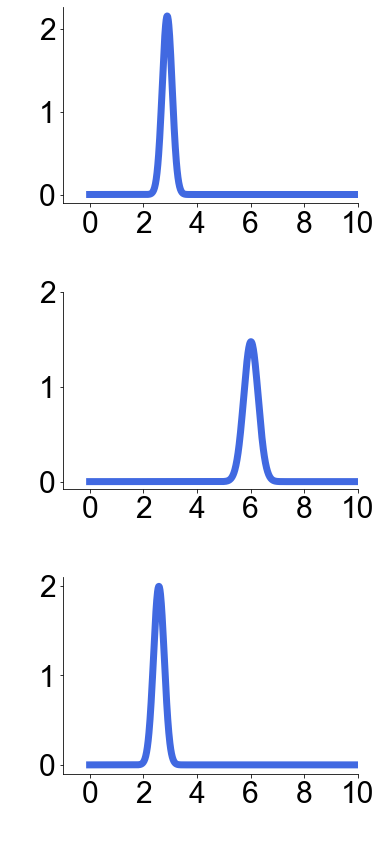

In [ ]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
xtckL = ["-90","-45","0","45","90"]
ytck = [-90,-45,0,45,90]
ytckL = ["-90","-45","0","45","90"]
x_eval = np.linspace(-180, 180, num=1000)
deg45 = int(np.round(l/2))
x = range(deg45)
#xL = [-180,-135,-130,-90,-45,-10,0,10,45,90,130,135,180]
x = [[57,45], [45,90], [78,68]]
ytck = [0,2,4,6,8,10]
ytckL = ["0","5","10","15","20"]
x_eval = np.linspace(0, 10, num=1000)
#ylab = "Center relative direction (deg.)"
ylab = " "
s=1
_, ax = plt.subplots(len(x), 1, figsize=(figS*0.9, figS*len(x)*0.66))
for ti, t in enumerate(x):
    y = spd_post[:,t[0],t[1],2,2,s]
    y = np.round(y,1)
    if len(np.unique(y))<10:
        print("no variability",np.unique(y))
        Y = [0,2]
        m = int(np.round(np.mean(y)))
        X = [m,m]
    else:
        kde = gaussian_kde(y)
        Y = kde(x_eval)
        X = x_eval.copy()
    axins = ax[ti]
    if ti==0:
        yy = norm.pdf(x_eval, loc=X[np.argmax(Y)], scale=.185)
    elif ti==1:
        yy = norm.pdf(x_eval, loc=X[np.argmax(Y)], scale=.27)
    elif ti==2:
        yy = norm.pdf(x_eval, loc=X[np.argmax(Y)], scale=.2)
    print(X[np.argmax(Y)])
    #axins.plot(X, Y, "-", color="red", linewidth=line_w+5)
    axins.plot(X, yy, "-", color="royalblue", linewidth=line_w+5)
    #axins.set_xlim([0,1])
    axins.set_xlim([-1, 10])
    #stimType = 'Surround direction = '+str(xL[ti])
    #axins.annotate(stimType, xy=(0.1,0.9),xycoords='axes fraction',fontsize=f_font1["size"])
    axins.spines["right"].set_visible(False)
    axins.spines["top"].set_visible(False)
    #axins.spines["bottom"].set_visible(False)
    axins.grid(False)
    #axins.spines["bottom"].set_visible(False)

    #axins.tick_params(right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
    axins.set_xlabel(ylab, **f_font1)
    axins.xaxis.set_ticks(ytck)
    axins.xaxis.set_ticklabels(ytck, **f_font1)

    
    axins.yaxis.set_ticks([0,1,2])
    axins.set_ylabel(" ", **f_font1)
    #axins.yaxis.set_ticklabels([])
    for labl in (axins.get_xticklabels()+axins.get_yticklabels()):
            labl.set_fontname(f_font1["fontname"])
            labl.set_fontsize(f_font1["size"])
plt.tight_layout()
plt.savefig(sp+"postSpd0_samespeed_example_metam2_rel"+str(s)+".pdf")
plt.show()

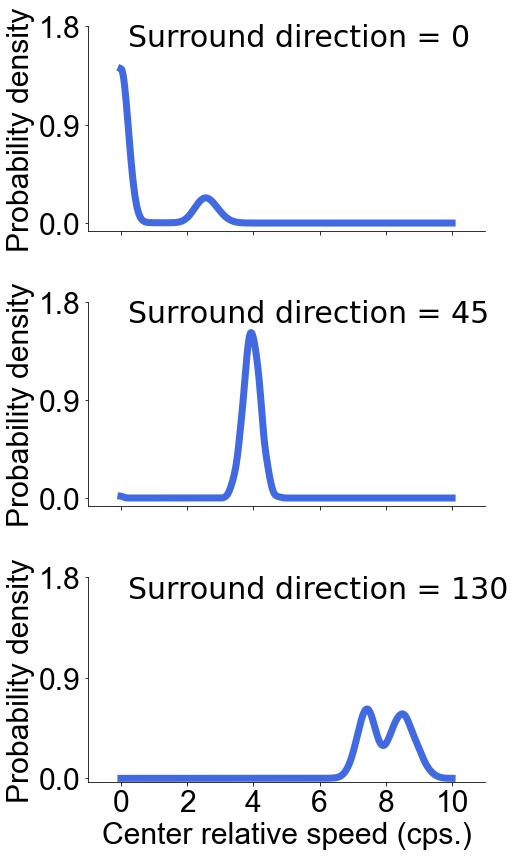

In [ ]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
#xtckL = ["-90","-45","0","45","90"]
ytck = [-90,-45,0,45,90]
ytck = [0,2,4,6,8,10]
ytckL = ["0","5","10","15","20"]
x_eval = np.linspace(0, 10, num=1000)
#x_eval = np.linspace(-180, 180, num=1000)
deg45 = int(np.round(l/2))
x = [2, 11, 13, 23, 34, 43, 45, 48, 57, 68, 78, 80]
xL = [-180,-135,-130,-90,-45,-10,0,10,45,90,130,135]
x = [45, 57, 78,]
xL = [0,45,130,]

#ylab = "Center relative direction (deg.)"
ylab = "Center relative speed (cps.)"
s=1
_, ax = plt.subplots(len(x), 1, figsize=(figS*1.2, figS*len(x)*0.66))
for ti, t in enumerate(x):
    y1 = spd_post[:,deg45,t,3,3,s]
    y2 = spd_post[:,deg45-1,t,3,3,s]
    y = np.hstack((y1,y2))
    y = np.round(y,1)
    if len(np.unique(y))<10:
        print("no variability",np.unique(y))
        Y = [0,2]
        m = int(np.round(np.mean(y)))
        X = [m,m]
    else:
        # if (t==45) or (t==46):
        #      Y = np.repeat(1/len(x_eval), len(x_eval))
        # elif (t==43):
        #      Y = 0.5*np.repeat(1/len(x_eval), len(x_eval)) + 0.5*norm.pdf(x_eval, loc=-31, scale=10)
        # elif (t==48):
        #      Y = 0.5*np.repeat(1/len(x_eval), len(x_eval)) + 0.5*norm.pdf(x_eval, loc=31, scale=10)
        # else:
        kde = gaussian_kde(y)
        Y = kde(x_eval)
        X = x_eval.copy()
    axins = ax[ti]
    axins.plot(X, Y, "-", color="royalblue", linewidth=line_w+5)
    #axins.set_xlim([0,1])
    axins.set_xlim([-1, 11])
    stimType = 'Surround direction = '+str(xL[ti])
    axins.annotate(stimType, xy=(0.1,0.9),xycoords='axes fraction',fontsize=f_font1["size"])
    axins.spines["right"].set_visible(False)
    axins.spines["top"].set_visible(False)
    #axins.spines["bottom"].set_visible(False)
    axins.grid(False)
    if ti==len(x)-1:
        #axins.tick_params(right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
        axins.set_xlabel(ylab, **f_font1)
        axins.xaxis.set_ticks(ytck)
        axins.xaxis.set_ticklabels(ytck, **f_font1)
        #xxr,xxrL = [0,0.01], ["0","0.01"]
    else:
        #axins.tick_params(left=False,right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
        axins.xaxis.set_ticks(ytck)
        axins.xaxis.set_ticklabels([" " for i in range(len(ytck))], **f_font1)
        axins.set_xlabel(" ")
        #xxr,xxrL = [0, np.round(np.max(Y[t, :, r])*0.66,2)], ["0", str(np.round(np.max(Y[t, :, r])*0.66,2))]
    axins.yaxis.set_ticks([0,0.9,1.8])
    axins.set_ylabel("Probability density", **f_font1)
    #axins.yaxis.set_ticklabels([])
    for labl in (axins.get_xticklabels()+axins.get_yticklabels()):
            labl.set_fontname(f_font1["fontname"])
            labl.set_fontsize(f_font1["size"])
plt.tight_layout()
plt.savefig(sp+"postSpd0_samespeed_3example_surround_rel"+str(s)+".pdf")
plt.show()

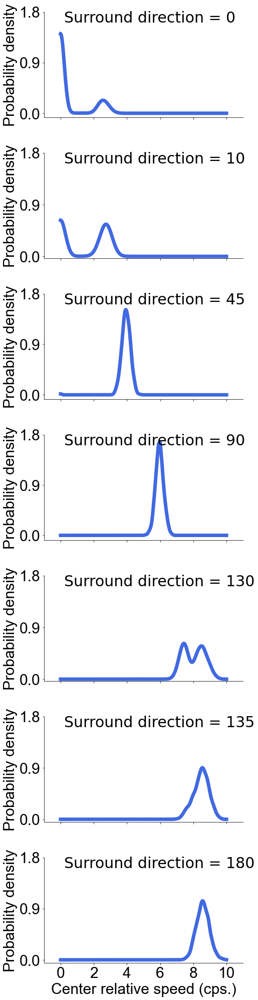

In [ ]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
#xtckL = ["-90","-45","0","45","90"]
ytck = [-90,-45,0,45,90]
ytck = [0,2,4,6,8,10]
ytckL = ["0","5","10","15","20"]
x_eval = np.linspace(0, 10, num=1000)
#x_eval = np.linspace(-180, 180, num=1000)
deg45 = int(np.round(l/2))
x = [2, 11, 13, 23, 34, 43, 45, 48, 57, 68, 78, 80]
xL = [-180,-135,-130,-90,-45,-10,0,10,45,90,130,135]
x = [45, 48, 57, 68, 78, 80,88]
xL = [0,10,45,90,130,135,180]

#ylab = "Center relative direction (deg.)"
ylab = "Center relative speed (cps.)"
s=1
_, ax = plt.subplots(len(x), 1, figsize=(figS*1.2, figS*len(x)*0.66))
for ti, t in enumerate(x):
    y1 = spd_post[:,deg45,t,3,3,s]
    y2 = spd_post[:,deg45-1,t,3,3,s]
    y = np.hstack((y1,y2))
    y = np.round(y,1)
    if len(np.unique(y))<10:
        print("no variability",np.unique(y))
        Y = [0,2]
        m = int(np.round(np.mean(y)))
        X = [m,m]
    else:
        # if (t==45) or (t==46):
        #      Y = np.repeat(1/len(x_eval), len(x_eval))
        # elif (t==43):
        #      Y = 0.5*np.repeat(1/len(x_eval), len(x_eval)) + 0.5*norm.pdf(x_eval, loc=-31, scale=10)
        # elif (t==48):
        #      Y = 0.5*np.repeat(1/len(x_eval), len(x_eval)) + 0.5*norm.pdf(x_eval, loc=31, scale=10)
        # else:
        kde = gaussian_kde(y)
        Y = kde(x_eval)
        X = x_eval.copy()
    axins = ax[ti]
    axins.plot(X, Y, "-", color="royalblue", linewidth=line_w+5)
    #axins.set_xlim([0,1])
    axins.set_xlim([-1, 11])
    stimType = 'Surround direction = '+str(xL[ti])
    axins.annotate(stimType, xy=(0.1,0.9),xycoords='axes fraction',fontsize=f_font1["size"])
    axins.spines["right"].set_visible(False)
    axins.spines["top"].set_visible(False)
    #axins.spines["bottom"].set_visible(False)
    axins.grid(False)
    if ti==len(x)-1:
        #axins.tick_params(right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
        axins.set_xlabel(ylab, **f_font1)
        axins.xaxis.set_ticks(ytck)
        axins.xaxis.set_ticklabels(ytck, **f_font1)
        #xxr,xxrL = [0,0.01], ["0","0.01"]
    else:
        #axins.tick_params(left=False,right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
        axins.xaxis.set_ticks(ytck)
        axins.xaxis.set_ticklabels([" " for i in range(len(ytck))], **f_font1)
        axins.set_xlabel(" ")
        #xxr,xxrL = [0, np.round(np.max(Y[t, :, r])*0.66,2)], ["0", str(np.round(np.max(Y[t, :, r])*0.66,2))]
    axins.yaxis.set_ticks([0,0.9,1.8])
    axins.set_ylabel("Probability density", **f_font1)
    #axins.yaxis.set_ticklabels([])
    for labl in (axins.get_xticklabels()+axins.get_yticklabels()):
            labl.set_fontname(f_font1["fontname"])
            labl.set_fontsize(f_font1["size"])
plt.tight_layout()
plt.savefig(sp+"postSpd0_samespeed_example_surround_rel"+str(s)+".pdf")
plt.show()

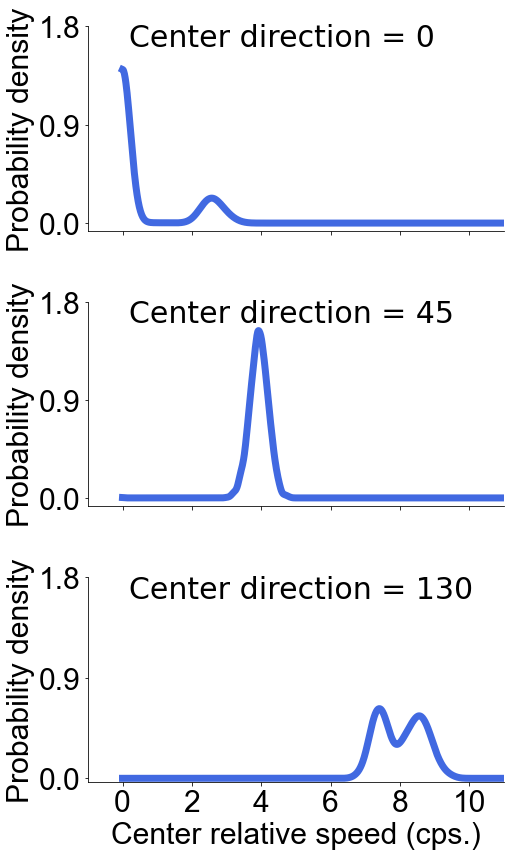

In [ ]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
#xtckL = ["-90","-45","0","45","90"]
ytck = [-90,-45,0,45,90]
ytck = [0,2,4,6,8,10]
ytckL = ["0","5","10","15","20"]
x_eval = np.linspace(0, 11, num=1000)
#x_eval = np.linspace(-180, 180, num=1000)
deg45 = int(np.round(l/2))
x = [2, 11, 13, 23, 34, 43, 45, 48, 57, 68, 78, 80]
xL = [-180,-135,-130,-90,-45,-10,0,10,45,90,130,135]
x = [45, 57, 78]
xL = [0,45,130]
#ylab = "Center relative direction (deg.)"
ylab = "Center relative speed (cps.)"
s=1
_, ax = plt.subplots(len(x), 1, figsize=(figS*1.2, figS*len(x)*0.66))
for ti, t in enumerate(x):
    y1 = spd_post[:,t,deg45,3,3,s]
    y2 = spd_post[:,t,deg45-1,3,3,s]
    y = np.hstack((y1,y2))
    y = np.round(y,1)
    if len(np.unique(y))<10:
        print("no variability",np.unique(y))
        Y = [0,2]
        m = int(np.round(np.mean(y)))
        X = [m,m]
    else:
        # if (t==45) or (t==46):
        #      Y = np.repeat(1/len(x_eval), len(x_eval))
        # elif (t==43):
        #      Y = 0.5*np.repeat(1/len(x_eval), len(x_eval)) + 0.5*norm.pdf(x_eval, loc=-31, scale=10)
        # elif (t==48):
        #      Y = 0.5*np.repeat(1/len(x_eval), len(x_eval)) + 0.5*norm.pdf(x_eval, loc=31, scale=10)
        # else:
        kde = gaussian_kde(y)
        Y = kde(x_eval)
        X = x_eval.copy()
    axins = ax[ti]
    axins.plot(X, Y, "-", color="royalblue", linewidth=line_w+5)
    #axins.set_xlim([0,1])
    axins.set_xlim([-1, 11])
    stimType = 'Center direction = '+str(xL[ti])
    axins.annotate(stimType, xy=(0.1,0.9),xycoords='axes fraction',fontsize=f_font1["size"])
    axins.spines["right"].set_visible(False)
    axins.spines["top"].set_visible(False)
    #axins.spines["bottom"].set_visible(False)
    axins.grid(False)
    if ti==len(x)-1:
        #axins.tick_params(right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
        axins.set_xlabel(ylab, **f_font1)
        axins.xaxis.set_ticks(ytck)
        axins.xaxis.set_ticklabels(ytck, **f_font1)
        #xxr,xxrL = [0,0.01], ["0","0.01"]
    else:
        #axins.tick_params(left=False,right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
        axins.xaxis.set_ticks(ytck)
        axins.xaxis.set_ticklabels([" " for i in range(len(ytck))], **f_font1)
        axins.set_xlabel(" ")
        #xxr,xxrL = [0, np.round(np.max(Y[t, :, r])*0.66,2)], ["0", str(np.round(np.max(Y[t, :, r])*0.66,2))]
    axins.yaxis.set_ticks([0,0.9,1.8])
    axins.set_ylabel("Probability density", **f_font1)
    #axins.yaxis.set_ticklabels([])
    for labl in (axins.get_xticklabels()+axins.get_yticklabels()):
            labl.set_fontname(f_font1["fontname"])
            labl.set_fontsize(f_font1["size"])
plt.tight_layout()
plt.savefig(sp+"postSpd0_samespeed_3example_center_rel"+str(s)+".pdf")
plt.show()

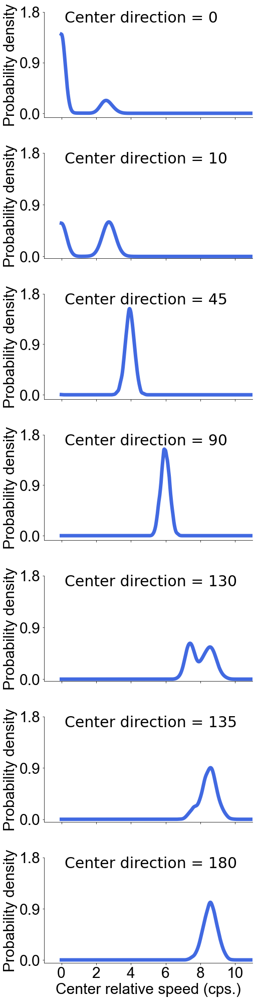

In [ ]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
#xtckL = ["-90","-45","0","45","90"]
ytck = [-90,-45,0,45,90]
ytck = [0,2,4,6,8,10]
ytckL = ["0","5","10","15","20"]
x_eval = np.linspace(0, 11, num=1000)
#x_eval = np.linspace(-180, 180, num=1000)
deg45 = int(np.round(l/2))
x = [2, 11, 13, 23, 34, 43, 45, 48, 57, 68, 78, 80]
xL = [-180,-135,-130,-90,-45,-10,0,10,45,90,130,135]
x = [45, 48, 57, 68, 78, 80,88]
xL = [0,10,45,90,130,135,180]
#ylab = "Center relative direction (deg.)"
ylab = "Center relative speed (cps.)"
s=1
_, ax = plt.subplots(len(x), 1, figsize=(figS*1.2, figS*len(x)*0.66))
for ti, t in enumerate(x):
    y1 = spd_post[:,t,deg45,3,3,s]
    y2 = spd_post[:,t,deg45-1,3,3,s]
    y = np.hstack((y1,y2))
    y = np.round(y,1)
    if len(np.unique(y))<10:
        print("no variability",np.unique(y))
        Y = [0,2]
        m = int(np.round(np.mean(y)))
        X = [m,m]
    else:
        # if (t==45) or (t==46):
        #      Y = np.repeat(1/len(x_eval), len(x_eval))
        # elif (t==43):
        #      Y = 0.5*np.repeat(1/len(x_eval), len(x_eval)) + 0.5*norm.pdf(x_eval, loc=-31, scale=10)
        # elif (t==48):
        #      Y = 0.5*np.repeat(1/len(x_eval), len(x_eval)) + 0.5*norm.pdf(x_eval, loc=31, scale=10)
        # else:
        kde = gaussian_kde(y)
        Y = kde(x_eval)
        X = x_eval.copy()
    axins = ax[ti]
    axins.plot(X, Y, "-", color="royalblue", linewidth=line_w+5)
    #axins.set_xlim([0,1])
    axins.set_xlim([-1, 11])
    stimType = 'Center direction = '+str(xL[ti])
    axins.annotate(stimType, xy=(0.1,0.9),xycoords='axes fraction',fontsize=f_font1["size"])
    axins.spines["right"].set_visible(False)
    axins.spines["top"].set_visible(False)
    #axins.spines["bottom"].set_visible(False)
    axins.grid(False)
    if ti==len(x)-1:
        #axins.tick_params(right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
        axins.set_xlabel(ylab, **f_font1)
        axins.xaxis.set_ticks(ytck)
        axins.xaxis.set_ticklabels(ytck, **f_font1)
        #xxr,xxrL = [0,0.01], ["0","0.01"]
    else:
        #axins.tick_params(left=False,right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
        axins.xaxis.set_ticks(ytck)
        axins.xaxis.set_ticklabels([" " for i in range(len(ytck))], **f_font1)
        axins.set_xlabel(" ")
        #xxr,xxrL = [0, np.round(np.max(Y[t, :, r])*0.66,2)], ["0", str(np.round(np.max(Y[t, :, r])*0.66,2))]
    axins.yaxis.set_ticks([0,0.9,1.8])
    axins.set_ylabel("Probability density", **f_font1)
    #axins.yaxis.set_ticklabels([])
    for labl in (axins.get_xticklabels()+axins.get_yticklabels()):
            labl.set_fontname(f_font1["fontname"])
            labl.set_fontsize(f_font1["size"])
plt.tight_layout()
plt.savefig(sp+"postSpd0_samespeed_example_center_rel"+str(s)+".pdf")
plt.show()

In [1]:
kappa=5
mu=78
xd = np.linspace(-180, 180, num=1000)
r_dir =  np.exp(kappa * (np.cos( ((xd-mu)/180)*np.pi )-1))

kappa=0.4
mu=0
n=2
xs = np.linspace(0, 18, num=1000)
r_spd = ((kappa*(xs - mu))**n * np.exp(-kappa*(xs - mu)))/(n**n * np.exp(-n))
c = ["royalblue", "olivedrab", "darkorange", "firebrick"]
error = 0.15
for i,Y in enumerate([r_dir, r_spd]):
    _, ax = plt.subplots(1, 1, figsize=(figS*1, figS*0.5))
    axins = ax
   
    if i==0:
        X = xd
        #axins.tick_params(right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
        axins.set_xlabel(" ", **f_font1)
        axins.xaxis.set_ticks([0,30,60,90,120,160])
        axins.xaxis.set_ticklabels([0,30,60,90,120,160], **f_font1)
        v1,v2 = 77.9,78.1
        v1,v2 = -.9,1.1
        v1,v2 = 158.9,160.1
        axins.set_xlim([0, 165])
        #xxr,xxrL = [0,0.01], ["0","0.01"]
    else:
        X=xs
        #axins.tick_params(left=False,right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
        axins.set_xlabel(" ", **f_font1)
        axins.xaxis.set_ticks([0,2,4,6,8,10])
        axins.xaxis.set_ticklabels([0,2,4,6,8,10], **f_font1)
        #xxr,xxrL = [0, np.round(np.max(Y[t, :, r])*0.66,2)], ["0", str(np.round(np.max(Y[t, :, r])*0.66,2))]
        v1,v2 = 2.99,3.01
        v1,v2 = 5.99,6.01
        v1,v2 = 2.45,2.55
        axins.set_xlim([0, 10])
    axins.set_ylim([0,1.2])
    axins.yaxis.set_ticks([0,0.5,1])
    axins.fill_between(X, Y-(error+error*Y), Y+(error+error*Y), color=c[1], alpha=0.4)
    axins.plot(X, Y, "-", color=c[1], linewidth=line_w+8)
    ix = np.where((X<v2) & (X>v1))[0][0]
    axins.plot([X[ix],X[ix]], [0,1.1], "-", color=c[0], linewidth=line_w+7)
    print(X[ix],Y[ix])
    axins.spines["right"].set_visible(False)
    axins.spines["top"].set_visible(False)
    #axins.spines["bottom"].set_visible(False)
    axins.grid(False)
    axins.set_ylabel(" ", **f_font1)
    #axins.yaxis.set_ticklabels([])
    for labl in (axins.get_xticklabels()+axins.get_yticklabels()):
            labl.set_fontname(f_font1["fontname"])
            labl.set_fontsize(f_font1["size"])
    plt.tight_layout()
    plt.savefig(sp+"TunC_example3_"+str(i)+".pdf")
    plt.show()


NameError: name 'np' is not defined

In [ ]:
Y[ix]

0.7992650300262982

In [ ]:
(error+error*Y[ix])

0.2698897545039447

In [ ]:
d[0][1]*d[1][1]

0.017562588896794244

In [ ]:
d

[[78.01801801801798, 0.9999997527657009, 0.2999999629148551],
 [2.990990990990991, 0.7992650300262982, 0.2698897545039447]]

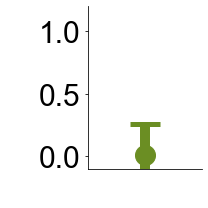

In [ ]:
d=[]
for i,Y in enumerate([r_dir, r_spd]):
        
        if i==0:
                X = xd
                
                v1,v2 = 77.9,78.1
                v1,v2 = -.9,1.1
                v1,v2 = 158.9,160.1

        else:
                X=xs

                v1,v2 = 2.99,3.01
                v1,v2 = 5.99,6.01
                v1,v2 = 2.45,2.55
        ix = np.where((X<v2) & (X>v1))[0][0]
        d.append([X[ix], Y[ix], (error+error*Y[ix])])
y = d[0][1]*d[1][1]
_, ax = plt.subplots(1, 1, figsize=(figS*0.5, figS*0.5))
axins = ax
axins.set_xlabel(" ", **f_font1)
axins.xaxis.set_ticks([ ])
axins.set_ylim([-0.1,1.2])
axins.yaxis.set_ticks([0,0.5,1])

axins.errorbar(1,y, yerr=np.array([[d[1][2]],[d[1][2]]]), fmt='-o', color=c[1], capsize=15, capthick=5, markersize=20, linewidth=line_w+8)
axins.spines["right"].set_visible(False)
axins.spines["top"].set_visible(False)
#axins.spines["bottom"].set_visible(False)
axins.grid(False)
axins.set_ylabel(" ", **f_font1)
#axins.yaxis.set_ticklabels([])
for labl in (axins.get_xticklabels()+axins.get_yticklabels()):
        labl.set_fontname(f_font1["fontname"])
        labl.set_fontsize(f_font1["size"])
plt.tight_layout()
#plt.savefig(sp+"fire_example4_"+str(i)+".pdf")
plt.show()


In [ ]:
d

[[159.09909909909908, 0.014605305925411264, 0.15219079588881168],
 [2.4504504504504503, 0.6659689207434096, 0.24989533811151143]]

In [ ]:
[[78.01801801801798, 0.9999997527657009, 0.2999999629148551],
 [2.990990990990991, 0.7992650300262982, 0.2698897545039447]]

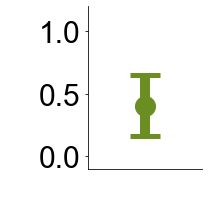

In [ ]:
_, ax = plt.subplots(1, 1, figsize=(figS*0.5, figS*0.5))
axins = ax
axins.set_xlabel(" ", **f_font1)
axins.xaxis.set_ticks([ ])
axins.set_ylim([-0.1,1.2])
axins.yaxis.set_ticks([0,0.5,1])
y = 0.5*(0.9999997527657009*0.7992650300262982)+0.5*(0.014605305925411264*0.6659689207434096)
ye = (0.5*(0.15219079588881168+0.24989533811151143)+0.5*(0.2999999629148551+0.2698897545039447))/2
axins.errorbar(1,y, yerr=np.array([[ye],[ye]]), fmt='-o', color=c[1], capsize=15, capthick=5, markersize=20, linewidth=line_w+8)
axins.spines["right"].set_visible(False)
axins.spines["top"].set_visible(False)
#axins.spines["bottom"].set_visible(False)
axins.grid(False)
axins.set_ylabel(" ", **f_font1)
#axins.yaxis.set_ticklabels([])
for labl in (axins.get_xticklabels()+axins.get_yticklabels()):
        labl.set_fontname(f_font1["fontname"])
        labl.set_fontsize(f_font1["size"])
plt.tight_layout()
plt.savefig(sp+"fire_example34_"+str(i)+".pdf")
plt.show()


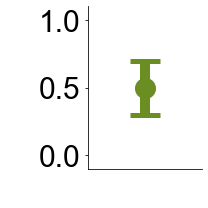

In [ ]:
c = ["royalblue", "olivedrab", "darkorange", "firebrick"]
_, ax = plt.subplots(1, 1, figsize=(figS*0.5, figS*0.5))
axins = ax
axins.set_xlabel(" ", **f_font1)
axins.xaxis.set_ticks([ ])
axins.set_ylim([-0.1,1.2])
axins.yaxis.set_ticks([0,0.5,1])
y = 0.5
ye = 0.2
axins.errorbar(1,y, yerr=np.array([[ye],[ye]]), fmt='-o', color=c[1], capsize=15, capthick=5, markersize=20, linewidth=line_w+8)
axins.spines["right"].set_visible(False)
axins.spines["top"].set_visible(False)
#axins.spines["bottom"].set_visible(False)
axins.set_ylim([-0.1,1.1])
axins.grid(False)
axins.set_ylabel(" ", **f_font1)
#axins.yaxis.set_ticklabels([])
for labl in (axins.get_xticklabels()+axins.get_yticklabels()):
        labl.set_fontname(f_font1["fontname"])
        labl.set_fontsize(f_font1["size"])
plt.tight_layout()
plt.savefig(sp+"fire_example222.pdf")
plt.show()

78.01801801801798 0.9999997527657009


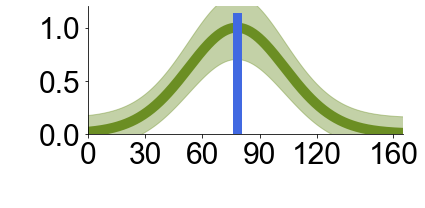

2.990990990990991 0.7992650300262982


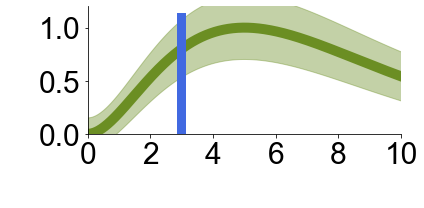

In [14]:
kappa=5
mu=78
xd = np.linspace(-180, 180, num=1000)
r_dir =  np.exp(kappa * (np.cos( ((xd-mu)/180)*np.pi )-1))

kappa=0.4
mu=0
n=2
xs = np.linspace(0, 18, num=1000)
r_spd = ((kappa*(xs - mu))**n * np.exp(-kappa*(xs - mu)))/(n**n * np.exp(-n))
c = ["royalblue", "olivedrab", "darkorange", "firebrick"]
error = 0.15
for i,Y in enumerate([r_dir, r_spd]):
    _, ax = plt.subplots(1, 1, figsize=(figS*1, figS*0.5))
    axins = ax
   
    if i==0:
        X = xd
        #axins.tick_params(right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
        axins.set_xlabel(" ", **f_font1)
        axins.xaxis.set_ticks([0,30,60,90,120,160])
        axins.xaxis.set_ticklabels([0,30,60,90,120,160], **f_font1)
        v1,v2 = 77.9,78.1
        axins.set_xlim([0, 165])
        #xxr,xxrL = [0,0.01], ["0","0.01"]
    else:
        X=xs
        #axins.tick_params(left=False,right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
        axins.set_xlabel(" ", **f_font1)
        axins.xaxis.set_ticks([0,2,4,6,8,10])
        axins.xaxis.set_ticklabels([0,2,4,6,8,10], **f_font1)
        #xxr,xxrL = [0, np.round(np.max(Y[t, :, r])*0.66,2)], ["0", str(np.round(np.max(Y[t, :, r])*0.66,2))]
        v1,v2 = 2.99,3.01

        axins.set_xlim([0, 10])
    axins.set_ylim([0,1.2])
    axins.yaxis.set_ticks([0,0.5,1])
    axins.fill_between(X, Y-(error+error*Y), Y+(error+error*Y), color=c[1], alpha=0.4)
    axins.plot(X, Y, "-", color=c[1], linewidth=line_w+8)
    ix = np.where((X<v2) & (X>v1))[0][0]
    axins.plot([X[ix],X[ix]], [0,1.1], "-", color=c[0], linewidth=line_w+7)
    print(X[ix],Y[ix])
    axins.spines["right"].set_visible(False)
    axins.spines["top"].set_visible(False)
    #axins.spines["bottom"].set_visible(False)
    axins.grid(False)
    axins.set_ylabel(" ", **f_font1)
    #axins.yaxis.set_ticklabels([])
    for labl in (axins.get_xticklabels()+axins.get_yticklabels()):
            labl.set_fontname(f_font1["fontname"])
            labl.set_fontsize(f_font1["size"])
    plt.tight_layout()
    plt.savefig(sp+"TunC1_"+str(i)+".pdf")
    plt.show()

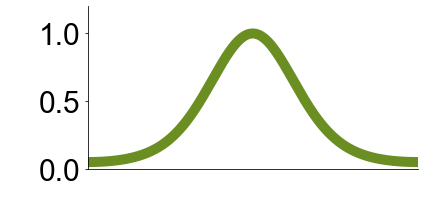

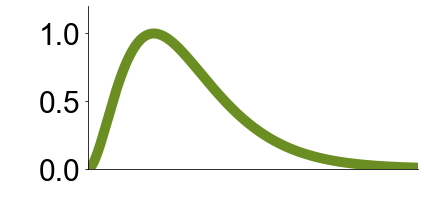

In [15]:
kappa=1.5
mu=0
xd = np.linspace(-180, 180, num=1000)
r_dir =  np.exp(kappa * (np.cos( ((xd-mu)/180)*np.pi )-1))

kappa=1
mu=0
n=2
xs = np.linspace(0, 18, num=1000)
r_spd = ((kappa*(xs - mu))**n * np.exp(-kappa*(xs - mu)))/(n**n * np.exp(-n))
c = ["royalblue", "olivedrab", "darkorange", "firebrick"]
error = 0.15
for i,Y in enumerate([r_dir, r_spd]):
    _, ax = plt.subplots(1, 1, figsize=(figS*1, figS*0.5))
    axins = ax
   
    if i==0:
        X = xd
        #axins.tick_params(right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
        axins.set_xlabel(" ", **f_font1)
        axins.xaxis.set_ticks([ ])
        #axins.xaxis.set_ticklabels([0,30,60,90,120,160], **f_font1)
        v1,v2 = 77.9,78.1
        v1,v2 = -.9,1.1
        v1,v2 = 158.9,160.1
        axins.set_xlim([-180, 180])
        #xxr,xxrL = [0,0.01], ["0","0.01"]
    else:
        X=xs
        #axins.tick_params(left=False,right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
        axins.set_xlabel(" ", **f_font1)
        axins.xaxis.set_ticks([ ])
        #axins.xaxis.set_ticklabels([0,2,4,6,8,10], **f_font1)
        #xxr,xxrL = [0, np.round(np.max(Y[t, :, r])*0.66,2)], ["0", str(np.round(np.max(Y[t, :, r])*0.66,2))]
        v1,v2 = 2.99,3.01
        v1,v2 = 5.99,6.01
        v1,v2 = 2.45,2.55
        axins.set_xlim([0, 10])
    axins.set_ylim([0,1.2])
    axins.yaxis.set_ticks([0,0.5,1])
    #axins.fill_between(X, Y-(error+error*Y), Y+(error+error*Y), color=c[1], alpha=0.4)
    axins.plot(X, Y, "-", color=c[1], linewidth=line_w+8)
    #ix = np.where((X<v2) & (X>v1))[0][0]
    #axins.plot([X[ix],X[ix]], [0,1.1], "-", color=c[0], linewidth=line_w+7)
    #print(X[ix],Y[ix])
    axins.spines["right"].set_visible(False)
    axins.spines["top"].set_visible(False)
    #axins.spines["bottom"].set_visible(False)
    axins.grid(False)
    axins.set_ylabel(" ", **f_font1)
    #axins.yaxis.set_ticklabels([])
    for labl in (axins.get_xticklabels()+axins.get_yticklabels()):
            labl.set_fontname(f_font1["fontname"])
            labl.set_fontsize(f_font1["size"])
    plt.tight_layout()
    plt.savefig(sp+"TunC_example33_"+str(i)+".pdf")
    plt.show()

no variability [19.  19.1 19.9 20.  20.1]
no variability [18.7 18.8 19.6 19.7 19.8]
no variability [18.1 18.2 18.9 19.  19.1]
no variability [17.1 17.2 17.9 18. ]
no variability [15.7 15.8 15.9 16.5 16.6]
no variability [14.1 14.2 14.8 14.9]
no variability [12.2 12.3 12.8 12.9]
no variability [10.1 10.2 10.5 10.6 10.7]
no variability [7.7 7.8 8.  8.1 8.2]
no variability [5.3 5.4 5.5 5.6]
no variability [2.7 2.8 2.9]
no variability [0.]
no variability [2.7 2.8]
no variability [5.2 5.3 5.4 5.5 5.6]
no variability [7.7 7.8 8.  8.1 8.2]
no variability [10.1 10.2 10.5 10.6 10.7]
no variability [12.2 12.3 12.8 12.9]
no variability [14.1 14.2 14.8 14.9]
no variability [15.7 15.8 15.9 16.5 16.6]
no variability [17.1 17.2 17.9 18. ]
no variability [18.1 18.2 18.9 19.  19.1]
no variability [18.7 18.8 19.6 19.7 19.8]


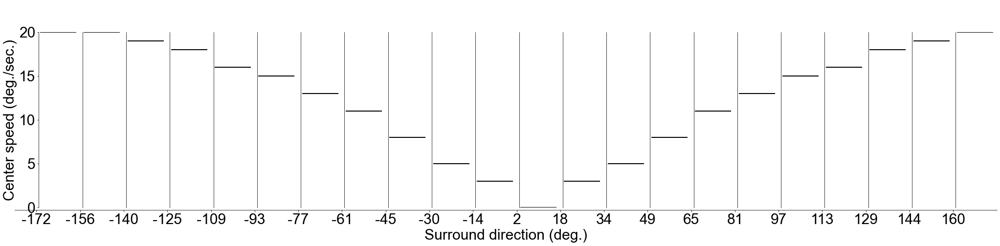

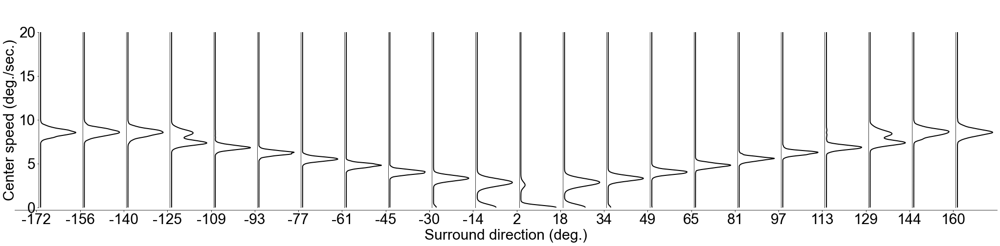

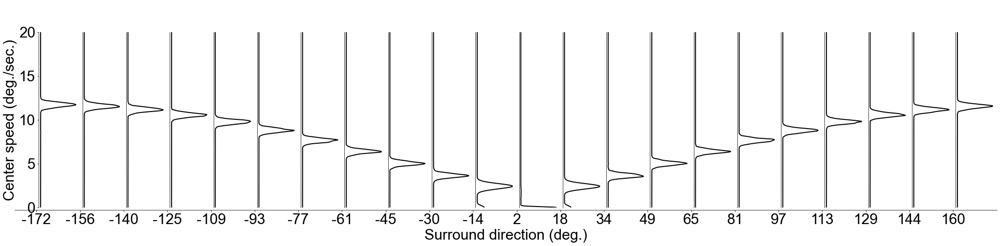

no variability [7.  7.1 7.2 7.3 7.4 7.5 7.6]
no variability [6.9 7.  7.1 7.2 7.3 7.4]
no variability [6.7 6.8 6.9 7.  7.1 7.2]
no variability [6.3 6.4 6.5 6.6 6.7 6.8 6.9]
no variability [5.8 5.9 6.  6.1 6.2 6.3 6.4]
no variability [5.2 5.3 5.4 5.5 5.6 5.7 5.8]
no variability [4.6 4.7 4.8 4.9 5.  5.1]
no variability [3.8 3.9 4.  4.1 4.2 4.3 4.4]
no variability [3.1 3.2 3.3 3.4 3.5 3.6]
no variability [2.3 2.4 2.5 2.6 2.7 2.8 2.9]
no variability [0.  0.9 1.  1.1 1.2 1.3 1.4 1.5]
no variability [2.3 2.4 2.5 2.6 2.7 2.8 2.9]
no variability [3.  3.1 3.2 3.3 3.4 3.5 3.6]
no variability [3.8 3.9 4.  4.1 4.2 4.3 4.4]
no variability [4.6 4.7 4.8 4.9 5.  5.1 5.2]
no variability [5.3 5.4 5.5 5.6 5.7 5.8]
no variability [5.9 6.  6.1 6.2 6.3 6.4]
no variability [6.3 6.4 6.5 6.6 6.7 6.8 6.9]
no variability [6.7 6.8 6.9 7.  7.1 7.2]
no variability [6.9 7.  7.1 7.2 7.3 7.4]


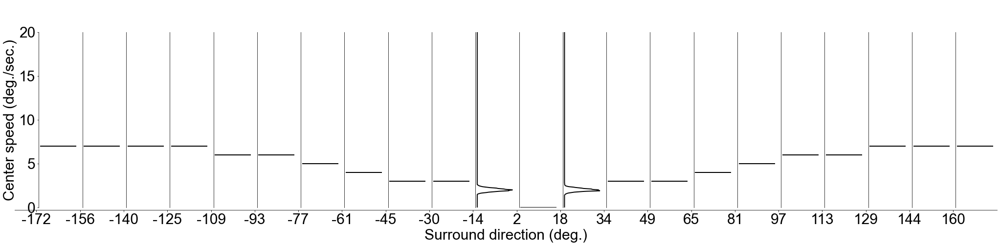

no variability [3.9 4.  4.1 4.2 4.3 4.4]
no variability [3.8 3.9 4.  4.1 4.2 4.3]
no variability [3.7 3.8 3.9 4.  4.1 4.2]
no variability [3.5 3.6 3.7 3.8 3.9 4. ]
no variability [3.3 3.4 3.5 3.6 3.7]
no variability [3.  3.1 3.2 3.3 3.4]
no variability [2.6 2.7 2.8 2.9 3. ]
no variability [2.2 2.3 2.4 2.5 2.6 2.7]
no variability [1.8 1.9 2.  2.1 2.2]
no variability [0.  1.4 1.5 1.6 1.7 1.8]
no variability [0.  1.4 1.5 1.6 1.7 1.8 1.9]
no variability [1.8 1.9 2.  2.1 2.2]
no variability [2.2 2.3 2.4 2.5 2.6]
no variability [2.6 2.7 2.8 2.9 3. ]
no variability [3.  3.1 3.2 3.3 3.4]
no variability [3.2 3.3 3.4 3.5 3.6 3.7]
no variability [3.5 3.6 3.7 3.8 3.9 4. ]
no variability [3.7 3.8 3.9 4.  4.1]
no variability [3.9 4.  4.1 4.2 4.3]


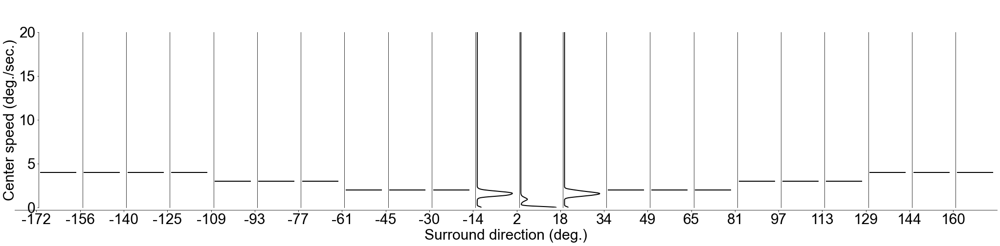

In [ ]:
l = dir_post.shape[1]
xtck = [0,int(np.round(l/4)),int(np.round(l/2)),int(np.round(l*3/4)),int(np.round(l))]
xtckL = ["-90","-45","0","45","90"]
ytck = [0,5,10,15,20]
ytckL = ["0","5","10","15","20"]
x_eval = np.linspace(0, 20, num=1000)
deg45 = int(np.round(l/2))
x = np.arange(2,l-2,4)
xL = [str(round(i)) for i in x*360/l-180]
#ylab = "Center relative speed (deg./sec.)"
ylab = "Center speed (deg./sec.)"
for s in range(5):
    _, ax = plt.subplots(1, 1, figsize=(figS*6, figS*1.3))
    for ti, t in enumerate(x):
        y = spd_post[:,deg45,t,3,3,s]
        y = np.round(y,1)
        if len(np.unique(y))<10:
            print("no variability",np.unique(y))
            Y = [0,2]
            m = int(np.round(np.mean(y)))
            X = [m,m]
        else:
            kde = gaussian_kde(y)
            Y = kde(x_eval)
            X = x_eval.copy()
        axins = inset_axes(ax, width=1.1, height=5,
                        bbox_to_anchor=(t, 0, t, 1),
                        bbox_transform=ax.transData, loc=3)
        
        axins.plot(Y, X, "-", color='k', linewidth=line_w)
        #axins.set_xlim([0,1])
        axins.set_ylim([0, 20])
        #axins.annotate(stimType, xy=(0.7,0.9),xycoords='axes fraction',fontsize=12)
        axins.spines["right"].set_visible(False)
        axins.spines["top"].set_visible(False)
        axins.spines["bottom"].set_visible(False)
        axins.grid(False)
        if ti==0:
            axins.tick_params(right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
            axins.set_ylabel(ylab, **f_font1)
            axins.yaxis.set_ticks(ytck)
            axins.yaxis.set_ticklabels(ytckL, **f_font1)
            #xxr,xxrL = [0,0.01], ["0","0.01"]
        else:
            axins.tick_params(left=False,right=False,bottom=False,top=False,labeltop=False,labelbottom=False)
            axins.yaxis.set_ticklabels([])
            axins.set_ylabel(" ")
            #xxr,xxrL = [0, np.round(np.max(Y[t, :, r])*0.66,2)], ["0", str(np.round(np.max(Y[t, :, r])*0.66,2))]
        #axins.xaxis.set_ticks(xxr)
        axins.xaxis.set_ticklabels([])
        for labl in (axins.get_xticklabels()+axins.get_yticklabels()):
                labl.set_fontname(f_font1["fontname"])
                labl.set_fontsize(f_font1["size"])
        #axins.legend(fontsize=10)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.grid(False)
    ax.tick_params(left=False,right=False)
    ax.set_xlabel('Surround direction (deg.)', **f_font1)
    ax.xaxis.set_ticks(x)
    ax.xaxis.set_ticklabels(xL, **f_font1)
    # ax.set_ylabel(self.model.params.perceptualFeature, **f1)
    #ax.set_ylim([0,1])
    ax.set_xlim([0,l-1])
    ax.yaxis.set_ticklabels([], **f_font1)
    for labl in (ax.get_xticklabels()+ax.get_yticklabels()):
                labl.set_fontname(f_font1["fontname"])
                labl.set_fontsize(f_font1["size"])
    #ax.set_title(Tit[i], y=1.0, pad=-64, **f2)
    plt.savefig(sp+"postSpd0_samespeed_sub_rel"+str(s)+".pdf")
    plt.show()

In [1]:
_, ax = plt.subplots(1, 1, figsize=(figS, figS*1.5))

x, y = np.mgrid[-1:1:.001, -1:1:.001]
pos = np.empty(x.shape + (2,))
pos[:, :, 0] = x
pos[:, :, 1] = y
M = [[-0.5,-0.5],
    [0,-0.5],
    [0.5,-0.5],
    [-0.5,0],
    [0,0],
    [0.5,0],
    [-0.5,0.5],
    [0,0.5],
    [0.5,0.5]
]
var = 0.0
C = [np.array([[var,0],
                [0,var]]),
    np.array([[var,0],
                [0,var]]),
    np.array([[var,0],
                [0,var]]),
    np.array([[var,0],
                [0,var]]),
    np.array([[var,0],
                [0,var]]),
    np.array([[var,0],
                [0,var]]),
    np.array([[var,0],
                [0,var]]),
    np.array([[var,0],
                [0,var]]),
    np.array([[var,0],
                [0,var]])]
P = 0
for m,c in zip(M,C):
    P = P + (1/len(M))*multivariate_normal.pdf(pos, mean=m, cov=c)
ax.contour(x, y, P, levels=4)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_linewidth(line_w)
ax.spines["bottom"].set_linewidth(line_w)
ax.spines["left"].set_linewidth(line_w)
ax.grid(False)
for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    label.set_fontname(f_font1["fontname"])
    label.set_fontsize(35)
#ax.xaxis.set_ticks([0, 1, 2])
#ax.xaxis.set_ticklabels([" ", " ", " "], rotation = -60)
#ax.set_xlim(-0.5, 2.5)
#ax.yaxis.set_ticks(yax)
#ax.set_xlabel(" ")
#ax.set_ylabel(L[i], **f_font2)
#plt.savefig(sp+"RMSE_paiwiseComp.pdf")
plt.show()

NameError: name 'plt' is not defined

In [4]:
_, ax = plt.subplots(1, 1, figsize=(figS*1.2, figS))
M = [[-0.5,-0.5],
    [0,-0.5],
    [0.5,-0.5],
    [-0.5,0],
    [0,0],
    [0.5,0],
    [-0.5,0.5],
    [0,0.5],
    [0.5,0.5]
]
R = [0.07, 0.15, 0.3]
ticks =[-1, -0.5, 0, 0.5, 1]
x = np.linspace(-4,4,10000)
col = ["saddlebrown", "firebrick",  "tomato"]
for m in M:
    ax.plot(m[0], m[1], "ko", markersize=7)
    for i,r in enumerate(R):
        ax.plot(m[0]+r*np.cos(x) , m[1]+r*np.sin(x), "-", linewidth=line_w+2, color=col[i])
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_linewidth(line_w)
ax.spines["bottom"].set_linewidth(line_w)
ax.spines["left"].set_linewidth(line_w)
ax.grid(False)
for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    label.set_fontname(f_font1["fontname"])
    label.set_fontsize(35)
ax.xaxis.set_ticks(ticks)
ax.yaxis.set_ticks(ticks)
#ax.xaxis.set_ticklabels([" ", " ", " "], rotation = -60)
#ax.set_xlim(-0.5, 2.5)
#ax.yaxis.set_ticks(yax)
#ax.set_xlabel(" ")
#ax.set_ylabel(L[i], **f_font2)
plt.tight_layout()
plt.savefig(sp+"concept_testBase.pdf")
plt.show()

NameError: name 'figS' is not defined

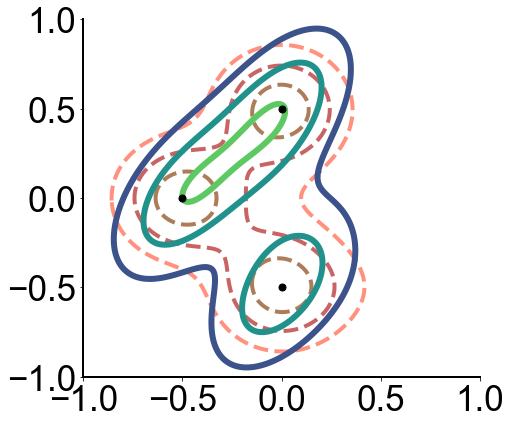

In [5]:
_, ax = plt.subplots(1, 1, figsize=(figS*1.2, figS))
M = [[-0.5,-0.5],
    [0,-0.5],
    [0.5,-0.5],
    [-0.5,0],
    [0,0],
    [0.5,0],
    [-0.5,0.5],
    [0,0.5],
    [0.5,0.5]
]
c, c_ = np.array([[0.05, 0], [0,0.05]]), np.array([[0.06, 0.1], [0.04,0.1]])
W = [0, 0.9, 0.1, 0.9, 0.1, 0, 0, 0.9, 0]
Y, Y_ = 0, 0
x, y = np.mgrid[-1:1:.001, -1:1:.001]
pos = np.empty(x.shape + (2,))
pos[:, :, 0] = x
pos[:, :, 1] = y
for w,m in zip(W,M):
    Y = Y + w * multivariate_normal.pdf(pos, mean=m, cov=c)
for w,m in zip(W,M):
    Y_ = Y_ + w * multivariate_normal.pdf(pos, mean=m, cov=c_)
ax.contour(x, y, Y, levels=3, colors=["saddlebrown", "tomato","firebrick",  ], linewidths=line_w+2, linestyles='dashed', alpha=0.7)
ax.contour(x, y, Y_, levels=3, linewidths=line_w+4, )
for m in [[0,-0.5],[-0.5,0],[0,0.5],]:
    ax.plot(m[0], m[1], "ko", markersize=7)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_linewidth(line_w)
ax.spines["bottom"].set_linewidth(line_w)
ax.spines["left"].set_linewidth(line_w)
ax.grid(False)
for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    label.set_fontname(f_font1["fontname"])
    label.set_fontsize(35)
ax.xaxis.set_ticks(ticks)
ax.yaxis.set_ticks(ticks)
#ax.xaxis.set_ticklabels([" ", " ", " "], rotation = -60)
#ax.set_xlim(-0.5, 2.5)
#ax.yaxis.set_ticks(yax)
#ax.set_xlabel(" ")
#ax.set_ylabel(L[i], **f_font2)
plt.tight_layout()
plt.savefig(sp+"concept_testPost.pdf")
plt.show()

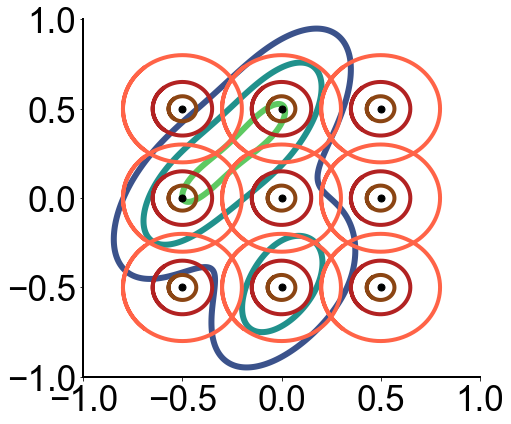

In [7]:
_, ax = plt.subplots(1, 1, figsize=(figS*1.2, figS))
M = [[-0.5,-0.5],
    [0,-0.5],
    [0.5,-0.5],
    [-0.5,0],
    [0,0],
    [0.5,0],
    [-0.5,0.5],
    [0,0.5],
    [0.5,0.5]
]

R = [0.07, 0.15, 0.3]
ticks =[-1, -0.5, 0, 0.5, 1]
x = np.linspace(-4,4,10000)
col = ["saddlebrown", "firebrick",  "tomato"]
for m in M:
    ax.plot(m[0], m[1], "ko", markersize=7)
    for i,r in enumerate(R):
        ax.plot(m[0]+r*np.cos(x) , m[1]+r*np.sin(x), "-", linewidth=line_w+2, color=col[i])
#ax.contour(x, y, Y, levels=3, colors=["saddlebrown", "tomato","firebrick",  ], linewidths=line_w+2,  alpha=0.7)
c, c_ = np.array([[0.05, 0], [0,0.05]]), np.array([[0.06, 0.1], [0.04,0.1]])
W = [0, 0.9, 0.1, 0.9, 0.1, 0, 0, 0.9, 0]
Y, Y_ = 0, 0
x, y = np.mgrid[-1:1:.001, -1:1:.001]
pos = np.empty(x.shape + (2,))
pos[:, :, 0] = x
pos[:, :, 1] = y
for w,m in zip(W,M):
    Y = Y + w * multivariate_normal.pdf(pos, mean=m, cov=c)
for w,m in zip(W,M):
    Y_ = Y_ + w * multivariate_normal.pdf(pos, mean=m, cov=c_)
ax.contour(x, y, Y_, levels=3, linewidths=line_w+4, )
# for m in [[0,-0.5],[-0.5,0],[0,0.5],]:
#     ax.plot(m[0], m[1], "ko", markersize=7)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_linewidth(line_w)
ax.spines["bottom"].set_linewidth(line_w)
ax.spines["left"].set_linewidth(line_w)
ax.grid(False)
for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    label.set_fontname(f_font1["fontname"])
    label.set_fontsize(35)
ax.xaxis.set_ticks(ticks)
ax.yaxis.set_ticks(ticks)
#ax.xaxis.set_ticklabels([" ", " ", " "], rotation = -60)
#ax.set_xlim(-0.5, 2.5)
#ax.yaxis.set_ticks(yax)
#ax.set_xlabel(" ")
#ax.set_ylabel(L[i], **f_font2)
plt.tight_layout()
plt.savefig(sp+"concept_testPostVv2.pdf")
plt.show()

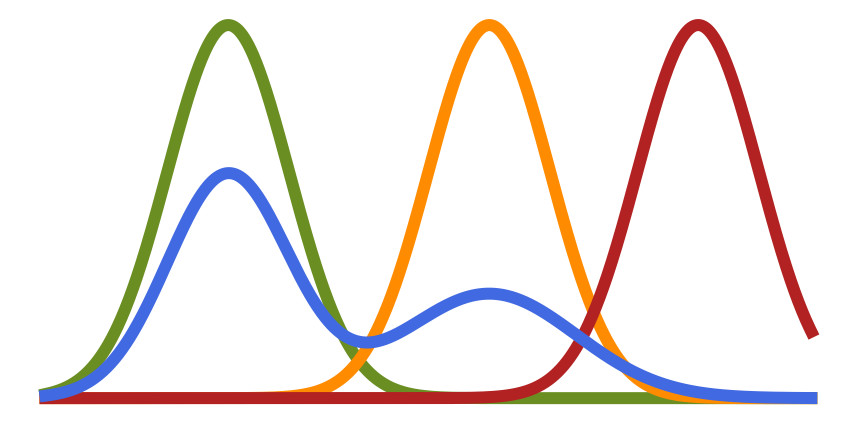

In [4]:
_, ax = plt.subplots(1, 1, figsize=(figS*2, figS))
c = ["royalblue", "olivedrab", "darkorange", "firebrick"]
x = np.linspace(-4.8,4,1000)
lw = 10
y = norm.pdf(x, loc=-2.7, scale=0.7)
ax.plot(x, y,  '-', linewidth=line_w+lw, color = c[1])
y = norm.pdf(x, loc=0.3, scale=0.7)
ax.plot(x, y,  '-', linewidth=line_w+lw, color = c[2])
y = norm.pdf(x, loc=2.7, scale=0.7)
ax.plot(x, y,  '-', linewidth=line_w+lw, color = c[3])
y = np.sum([0.6*norm.pdf(x, loc=-2.7, scale=0.7), 0.4*norm.pdf(x, loc=0.3, scale=1)], axis=0)
ax.plot(x, y,  '-', linewidth=line_w+lw, color = c[0])
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.spines["bottom"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.grid(False)
# for label in (ax.get_xticklabels()+ax.get_yticklabels()):
#     label.set_fontname(f_font1["fontname"])
#     label.set_fontsize(35)
#ax.xaxis.set_ticks(range(1,len(M)+1))
#ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
#ax.xaxis.set_ticklabels(["#"+str(i+1) for i in range(len(M))])
#ax.set_xlim(0, 10)
#ax.set_ylim(-0.03, 0.4)
#ax.yaxis.set_ticks(yax)
#ax.set_xlabel(" ")
#ax.set_ylabel(L[i], **f_font2)
plt.tick_params(top=False, bottom=False, left=False, right=False,
                labelleft=False, labelbottom=False)
plt.tight_layout()
plt.savefig(sp+"concept_mixture_1d.pdf")
plt.show()

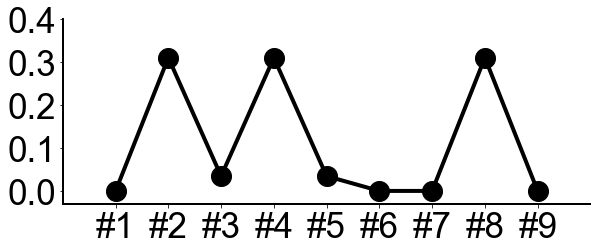

In [9]:
_, ax = plt.subplots(1, 1, figsize=(figS*1.4, figS*.6))
ax.plot(range(1,len(M)+1), W/np.sum(W),  'ko-', linewidth=line_w+2, markersize=20)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_linewidth(line_w)
ax.spines["bottom"].set_linewidth(line_w)
ax.spines["left"].set_linewidth(line_w)
ax.grid(False)
for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    label.set_fontname(f_font1["fontname"])
    label.set_fontsize(35)
ax.xaxis.set_ticks(range(1,len(M)+1))
ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
ax.xaxis.set_ticklabels(["#"+str(i+1) for i in range(len(M))])
ax.set_xlim(0, 10)
ax.set_ylim(-0.03, 0.4)
#ax.yaxis.set_ticks(yax)
#ax.set_xlabel(" ")
#ax.set_ylabel(L[i], **f_font2)
plt.tight_layout()
plt.savefig(sp+"11concept_weights.pdf")
plt.show()

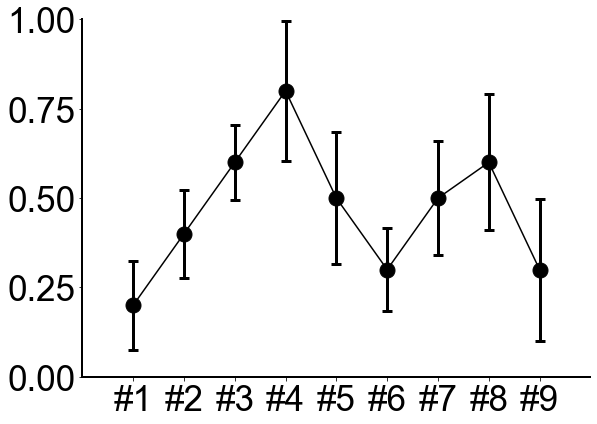

In [143]:
_, ax = plt.subplots(1, 1, figsize=(figS*1.4, figS))
err = 0.1 + 0.1*np.random.random(len(M))
r = np.array([0, 0.2, 0.4, 0.6, 0.3, 0.1, 0.3, 0.4, 0.1])+0.2
ax.errorbar(range(1,len(M)+1), r, yerr=err, color='k', fmt='o-', capsize=5, capthick=3, elinewidth=3, markersize=15)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_linewidth(line_w)
ax.spines["bottom"].set_linewidth(line_w)
ax.spines["left"].set_linewidth(line_w)
ax.grid(False)
for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    label.set_fontname(f_font1["fontname"])
    label.set_fontsize(35)
ax.xaxis.set_ticks(range(1,len(M)+1))
ax.yaxis.set_ticks([0,0.25,0.5,0.75,1])
ax.xaxis.set_ticklabels(["#"+str(i+1) for i in range(len(M))])
ax.set_xlim(0, 10)
ax.set_ylim(0, 1)
#ax.yaxis.set_ticks(yax)
#ax.set_xlabel(" ")
#ax.set_ylabel(L[i], **f_font2)
plt.tight_layout()
plt.savefig(sp+"concept_baseFire.pdf")
plt.show()

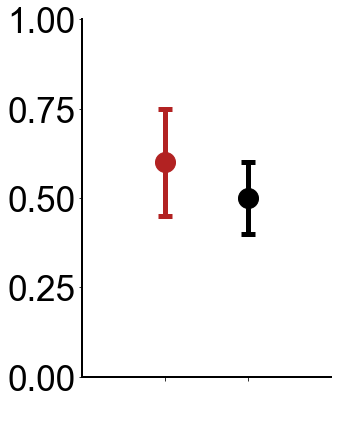

In [134]:
_, ax = plt.subplots(1, 1, figsize=(figS*0.8, figS))
err = [0.15, 0.1]
r = np.array([0.6, 0.5])
ax.errorbar(1, r[0], yerr=err[0], color="firebrick", fmt='o', capsize=7, capthick=5, elinewidth=5, markersize=20)
ax.errorbar(2, r[1], yerr=err[1], color='k', fmt='o', capsize=7, capthick=5, elinewidth=5, markersize=20)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_linewidth(line_w)
ax.spines["bottom"].set_linewidth(line_w)
ax.spines["left"].set_linewidth(line_w)
ax.grid(False)
for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    label.set_fontname(f_font1["fontname"])
    label.set_fontsize(35)
ax.xaxis.set_ticks(range(1,len(r)+1))
ax.yaxis.set_ticks([0,0.25,0.5,0.75,1])
ax.xaxis.set_ticklabels([" " for i in range(len(r))])
ax.set_xlim(0, 3)
ax.set_ylim(0, 1)
#ax.yaxis.set_ticks(yax)
#ax.set_xlabel(" ")
#ax.set_ylabel(L[i], **f_font2)
plt.tight_layout()
plt.savefig(sp+"concept_testFire.pdf")
plt.show()

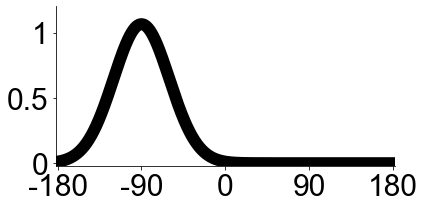

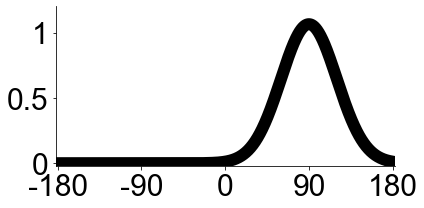

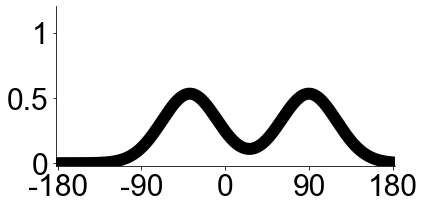

In [7]:
lw=10
x = np.linspace(-45,135,1000)
for mi,m in enumerate([0,90]):
    _, ax = plt.subplots(1, 1, figsize=(figS, figS*0.5))
    y = norm.pdf(x, loc=m, scale=15)
    ax.plot(x, y,  '-', linewidth=line_w+lw, color = "k")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    #ax.spines["bottom"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    ax.grid(False)
    # for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    #     label.set_fontname(f_font1["fontname"])
    #     label.set_fontsize(35)
    ax.xaxis.set_ticks([-45,0,45,90,135])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    ax.xaxis.set_ticklabels([ "-180", "-90", "0", "90","180"],**f_font1)
    ax.set_xlim(-46, 136)
    ax.set_ylim(-0.0005, 0.03)
    ax.yaxis.set_ticks([0,0.025/2,0.025])
    #ax.set_xlabel(" ")
    ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    #plt.tick_params(top=False, bottom=False, left=False, right=False,
    #                labelleft=False, labelbottom=False)
    plt.tight_layout()
    plt.savefig(sp+"post_ill_pred"+str(mi)+".pdf")
    plt.show()

_, ax = plt.subplots(1, 1, figsize=(figS, figS*0.5))
y1 = norm.pdf(x, loc=26, scale=15)
y2 = norm.pdf(x, loc=90, scale=15)
ax.plot(x, 0.5*y1+0.5*y2,  '-', linewidth=line_w+lw, color = "k")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
#ax.spines["left"].set_visible(False)
#ax.spines["bottom"].set_visible(False)
#ax.spines["left"].set_visible(False)
ax.grid(False)
# for label in (ax.get_xticklabels()+ax.get_yticklabels()):
#     label.set_fontname(f_font1["fontname"])
#     label.set_fontsize(35)
ax.xaxis.set_ticks([-45,0,45,90,135])
#ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
ax.xaxis.set_ticklabels([ "-180", "-90", "0", "90","180"],**f_font1)
ax.set_xlim(-46, 136)
ax.set_ylim(-0.0005, 0.03)
ax.yaxis.set_ticks([0,0.025/2,0.025])
#ax.set_xlabel(" ")
ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
#plt.tick_params(top=False, bottom=False, left=False, right=False,
#                labelleft=False, labelbottom=False)
plt.tight_layout()
plt.savefig(sp+"11post_ill_mixpred"+str(mi)+".pdf")
plt.show()

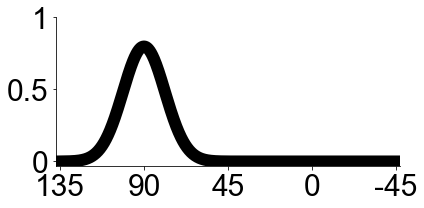

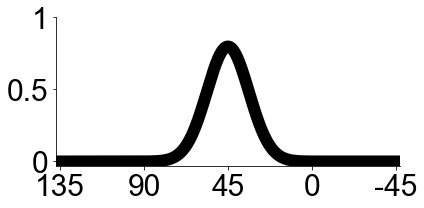

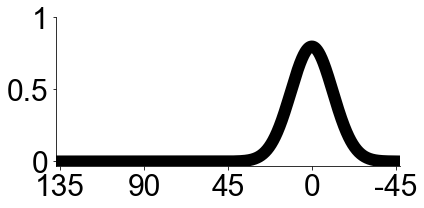

In [3]:
c = ["royalblue", "olivedrab", "darkorange", "firebrick"]
x = np.linspace(-4,4,1000)
lw = 10
for mi,m in enumerate([-2,0,2]):
    _, ax = plt.subplots(1, 1, figsize=(figS, figS*0.5))
    y = norm.pdf(x, loc=m, scale=0.5)
    ax.plot(x, y,  '-', linewidth=line_w+lw, color = "k")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    #ax.spines["bottom"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    ax.grid(False)
    # for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    #     label.set_fontname(f_font1["fontname"])
    #     label.set_fontsize(35)
    ax.xaxis.set_ticks([-4,-2,0,2,4])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    ax.xaxis.set_ticklabels(["135", "90", "45", "0", "-45"],**f_font1)
    ax.set_xlim(-4.1, 4.1)
    ax.set_ylim(-0.03, 1)
    ax.yaxis.set_ticks([0,0.5,1])
    #ax.set_xlabel(" ")
    ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    #plt.tick_params(top=False, bottom=False, left=False, right=False,
    #                labelleft=False, labelbottom=False)
    plt.tight_layout()
    plt.savefig(sp+"11post_base_pred"+str(mi)+".pdf")
    plt.show()

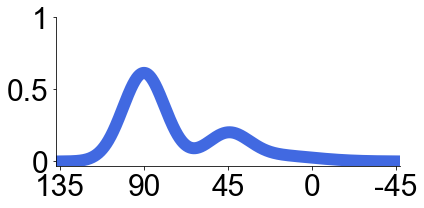

In [37]:
c = ["royalblue", "olivedrab", "darkorange", "firebrick"]
x = np.linspace(-4,4,1000)
lw = 10
w = [0.7, 0.2, 0.1]
sc = 1.1
_, ax = plt.subplots(1, 1, figsize=(figS, figS*0.5))

y1 = norm.pdf(x, loc=-2, scale=0.5)
#ax.plot(x, w[0]*y1,  '-', linewidth=line_w+lw, color = "k")
y2 = norm.pdf(x, loc=0, scale=0.5)
#ax.plot(x, w[1]*y2,  '-', linewidth=line_w+lw, color = "k")
y3 = norm.pdf(x, loc=2, scale=0.5)
#ax.plot(x, 0.05*y3,  '-', linewidth=line_w+lw, color = "k")
ym = np.sum([w[0]*sc*y1, w[1]*sc*y2, w[2]*sc*norm.pdf(x, loc=1, scale=1)], axis=0)
ax.plot(x, ym,  '-', linewidth=line_w+lw, color = c[0])
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
#ax.spines["left"].set_visible(False)
#ax.spines["bottom"].set_visible(False)
#ax.spines["left"].set_visible(False)
ax.grid(False)
# for label in (ax.get_xticklabels()+ax.get_yticklabels()):
#     label.set_fontname(f_font1["fontname"])
#     label.set_fontsize(35)
ax.xaxis.set_ticks([-4,-2,0,2,4])
#ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
ax.xaxis.set_ticklabels(["135", "90", "45", "0", "-45"],**f_font1)
ax.set_xlim(-4.1, 4.1)
ax.set_ylim(-0.03, 1)
ax.yaxis.set_ticks([0,0.5,1])
#ax.set_xlabel(" ")
ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
#plt.tick_params(top=False, bottom=False, left=False, right=False,
#                labelleft=False, labelbottom=False)
plt.tight_layout()
plt.savefig(sp+"post_test_pred1.pdf")
plt.show()

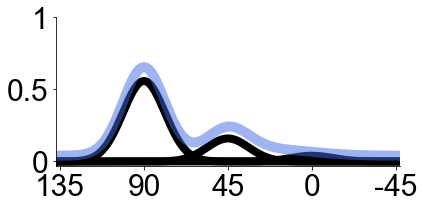

In [43]:
c = ["royalblue", "olivedrab", "darkorange", "firebrick"]
x = np.linspace(-4,4,1000)
lw = 6
w = [0.7, 0.2, 0.1]
sc = 1.1
_, ax = plt.subplots(1, 1, figsize=(figS, figS*0.5))

y1 = norm.pdf(x, loc=-2, scale=0.5)
ax.plot(x, w[0]*y1,  '-', linewidth=line_w+lw, color = "k")
y2 = norm.pdf(x, loc=0, scale=0.5)
ax.plot(x, w[1]*y2,  '-', linewidth=line_w+lw, color = "k")
y3 = norm.pdf(x, loc=2, scale=0.5)
ax.plot(x, 0.05*y3,  '-', linewidth=line_w+lw, color = "k")
ym = np.sum([w[0]*sc*y1, w[1]*sc*y2, w[2]*sc*norm.pdf(x, loc=1, scale=1)], axis=0)
ax.plot(x, ym+0.04,  '-', linewidth=line_w+lw+2, color = c[0], alpha=0.5)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
#ax.spines["left"].set_visible(False)
#ax.spines["bottom"].set_visible(False)
#ax.spines["left"].set_visible(False)
ax.grid(False)
# for label in (ax.get_xticklabels()+ax.get_yticklabels()):
#     label.set_fontname(f_font1["fontname"])
#     label.set_fontsize(35)
ax.xaxis.set_ticks([-4,-2,0,2,4])
#ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
ax.xaxis.set_ticklabels(["135", "90", "45", "0", "-45"],**f_font1)
ax.set_xlim(-4.1, 4.1)
ax.set_ylim(-0.03, 1)
ax.yaxis.set_ticks([0,0.5,1])
#ax.set_xlabel(" ")
ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
#plt.tick_params(top=False, bottom=False, left=False, right=False,
#                labelleft=False, labelbottom=False)
plt.tight_layout()
plt.savefig(sp+"post_test_mix_pred1.pdf")
plt.show()

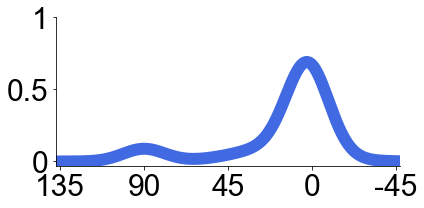

In [44]:
c = ["royalblue", "olivedrab", "darkorange", "firebrick"]
x = np.linspace(-4,4,1000)
lw = 10
w = [0.7, 0.2, 0.1]
sc = 1.1
_, ax = plt.subplots(1, 1, figsize=(figS, figS*0.5))

y1 = norm.pdf(x, loc=-2, scale=0.5)
#ax.plot(x, w[0]*y1,  '-', linewidth=line_w+lw, color = "k")
y2 = norm.pdf(x, loc=0, scale=0.5)
#ax.plot(x, w[1]*y2,  '-', linewidth=line_w+lw, color = "k")
y3 = norm.pdf(x, loc=2, scale=0.5)
#ax.plot(x, 0.05*y3,  '-', linewidth=line_w+lw, color = "k")
ym = np.sum([w[2]*sc*y1, w[1]*sc*sc*norm.pdf(x, loc=1.2, scale=1), w[0]*sc*norm.pdf(x, loc=1.9, scale=0.5)], axis=0)
ax.plot(x, ym,  '-', linewidth=line_w+lw, color = c[0])
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
#ax.spines["left"].set_visible(False)
#ax.spines["bottom"].set_visible(False)
#ax.spines["left"].set_visible(False)
ax.grid(False)
# for label in (ax.get_xticklabels()+ax.get_yticklabels()):
#     label.set_fontname(f_font1["fontname"])
#     label.set_fontsize(35)
ax.xaxis.set_ticks([-4,-2,0,2,4])
#ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
ax.xaxis.set_ticklabels(["135", "90", "45", "0", "-45"],**f_font1)
ax.set_xlim(-4.1, 4.1)
ax.set_ylim(-0.03, 1)
ax.yaxis.set_ticks([0,0.5,1])
#ax.set_xlabel(" ")
ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
#plt.tick_params(top=False, bottom=False, left=False, right=False,
#                labelleft=False, labelbottom=False)
plt.tight_layout()
plt.savefig(sp+"post_test_pred2.pdf")
plt.show()

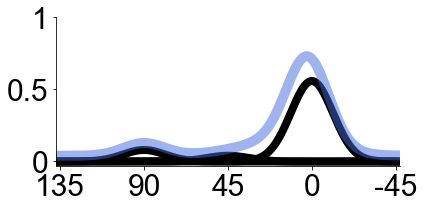

In [45]:
c = ["royalblue", "olivedrab", "darkorange", "firebrick"]
x = np.linspace(-4,4,1000)
lw = 6
w = [0.7, 0.2, 0.1]
sc = 1.1
_, ax = plt.subplots(1, 1, figsize=(figS, figS*0.5))

y1 = norm.pdf(x, loc=-2, scale=0.5)
ax.plot(x, w[2]*y1,  '-', linewidth=line_w+lw, color = "k")
y2 = norm.pdf(x, loc=0, scale=0.5)
ax.plot(x, 0.05*y2,  '-', linewidth=line_w+lw, color = "k")
y3 = norm.pdf(x, loc=2, scale=0.5)
ax.plot(x, w[0]*y3,  '-', linewidth=line_w+lw, color = "k")
ym = np.sum([w[2]*sc*y1, w[1]*sc*sc*norm.pdf(x, loc=1.2, scale=1), w[0]*sc*norm.pdf(x, loc=1.9, scale=0.5)], axis=0)
ax.plot(x, ym+0.04,  '-', linewidth=line_w+lw+2, color = c[0], alpha=0.5)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
#ax.spines["left"].set_visible(False)
#ax.spines["bottom"].set_visible(False)
#ax.spines["left"].set_visible(False)
ax.grid(False)
# for label in (ax.get_xticklabels()+ax.get_yticklabels()):
#     label.set_fontname(f_font1["fontname"])
#     label.set_fontsize(35)
ax.xaxis.set_ticks([-4,-2,0,2,4])
#ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
ax.xaxis.set_ticklabels(["135", "90", "45", "0", "-45"],**f_font1)
ax.set_xlim(-4.1, 4.1)
ax.set_ylim(-0.03, 1)
ax.yaxis.set_ticks([0,0.5,1])
#ax.set_xlabel(" ")
ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
#plt.tick_params(top=False, bottom=False, left=False, right=False,
#                labelleft=False, labelbottom=False)
plt.tight_layout()
plt.savefig(sp+"post_test_mix_pred2.pdf")
plt.show()

In [2]:
x, y = np.mgrid[-1:1:.001, -1:1:.001]
pos = np.empty(x.shape + (2,))
pos[:, :, 0] = x
pos[:, :, 1] = y
for w,m in zip(W,M):
    Y = Y + w * multivariate_normal.pdf(pos, mean=m, cov=c)
for w,m in zip(W,M):
    Y_ = Y_ + w * multivariate_normal.pdf(pos, mean=m, cov=c_)
ax.contour(x, y, Y_, levels=3, linewidths=line_w+4, )

NameError: name 'W' is not defined

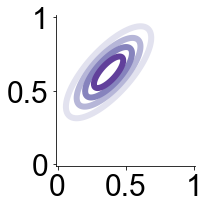

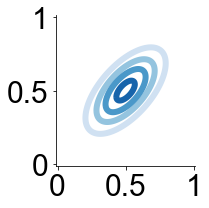

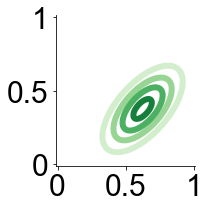

In [15]:
c = ["royalblue", "olivedrab", "darkorange", "firebrick"]
x, y = np.mgrid[-4:4:.01, -4:4:.01]
pos = np.empty(x.shape + (2,))
pos[:, :, 0] = x
pos[:, :, 1] = y
lw = 10
CM = ["Purples", "Blues", "Greens", "Oranges", "Reds"]
for mi,m,c in zip(range(3),[[-1,1],[0,0],[1,-1]], [np.array([[2, 1.5], [1.5, 2]]), np.array([[1.9, 1.2], [1.2,1.9]]), np.array([[1.9, 1.5], [1.2,1.9]])]):
    _, ax = plt.subplots(1, 1, figsize=(figS*0.5, figS*0.5))
    Y_ = multivariate_normal.pdf(pos, mean=m, cov=c)
    ax.contour(x, y, Y_, levels=4, linewidths=line_w+4, cmap=CM[mi])
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    #ax.spines["bottom"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    ax.grid(False)
    # for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    #     label.set_fontname(f_font1["fontname"])
    #     label.set_fontsize(35)
    ax.xaxis.set_ticks([-4,0,4])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    ax.xaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    ax.yaxis.set_ticks([-4,0,4])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    ax.set_xlim(-4.1, 4.1)
    ax.set_ylim(-4.1, 4.1)
    #plt.tick_params(top=False, bottom=False, left=False, right=False,
    #                labelleft=False, labelbottom=False)
    plt.tight_layout()
    plt.savefig(sp+"firing_base_pred"+str(mi)+".pdf")
    plt.show()

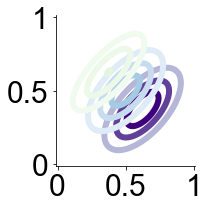

In [16]:
w = [[0.7, 0.2, 0.05],
     [0.12, 0.081, 0.8]]
mij,mj,cj = 0, [-1.5,1.5], np.array([[1, 0.3], [0.3,1]])
_, ax = plt.subplots(1, 1, figsize=(figS*0.5, figS*0.5))
for mi,m,c in zip(range(3),[[1,-1],[0,0],[-1,1]], [np.array([[1.9, 1.5], [1.2,1.9]]), np.array([[1.9, 1.2], [1.2,1.9]]),np.array([[2, 1.5], [1.5, 2]]) ]):
    Y_ = multivariate_normal.pdf(pos, mean=m, cov=c)
    ax.contour(x, y, Y_*w[mij][mi], levels=3, linewidths=line_w+4, cmap=CM[mi],vmin=0, vmax=0.05)
#Y_ = multivariate_normal.pdf(pos, mean=mj, cov=cj)
#ax.contour(x, y, Y_, levels=3, linewidths=line_w+4, cmap="Blues")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
#ax.spines["left"].set_visible(False)
#ax.spines["bottom"].set_visible(False)
#ax.spines["left"].set_visible(False)
ax.grid(False)
# for label in (ax.get_xticklabels()+ax.get_yticklabels()):
#     label.set_fontname(f_font1["fontname"])
#     label.set_fontsize(35)
ax.xaxis.set_ticks([-4,0,4])
#ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
ax.xaxis.set_ticklabels(["0","0.5","1"], **f_font1)
ax.yaxis.set_ticks([-4,0,4])
#ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
ax.set_xlim(-4.1, 4.1)
ax.set_ylim(-4.1, 4.1)
#plt.tick_params(top=False, bottom=False, left=False, right=False,
#                labelleft=False, labelbottom=False)
plt.tight_layout()
plt.savefig(sp+"firing_test_mix_pred1"+str(mij)+".pdf")
plt.show()

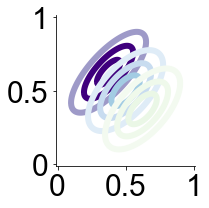

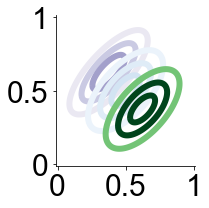

In [17]:
w = [[0.7, 0.2, 0.05],
     [0.25, 0.1, 0.8]]
for mij,mj,cj in zip(range(2),[[-1.5,1.5],[1.5,-1.5]], [np.array([[1, 0.3], [0.3,1]]), np.array([[1, 0.3], [0.3,1]])]):
    _, ax = plt.subplots(1, 1, figsize=(figS*0.5, figS*0.5))
    for mi,m,c in zip(range(3),[[-1,1],[0,0],[1,-1]], [np.array([[2, 1.5], [1.5, 2]]), np.array([[1.9, 1.2], [1.2,1.9]]), np.array([[1.9, 1.5], [1.2,1.9]])]):
        Y_ = multivariate_normal.pdf(pos, mean=m, cov=c)
        ax.contour(x, y, Y_*w[mij][mi], levels=3, linewidths=line_w+4, cmap=CM[mi],vmin=0, vmax=0.05)
    #Y_ = multivariate_normal.pdf(pos, mean=mj, cov=cj)
    #ax.contour(x, y, Y_, levels=3, linewidths=line_w+4, cmap="Blues")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    #ax.spines["bottom"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    ax.grid(False)
    # for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    #     label.set_fontname(f_font1["fontname"])
    #     label.set_fontsize(35)
    ax.xaxis.set_ticks([-4,0,4])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    ax.xaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    ax.yaxis.set_ticks([-4,0,4])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    ax.set_xlim(-4.1, 4.1)
    ax.set_ylim(-4.1, 4.1)
    #plt.tick_params(top=False, bottom=False, left=False, right=False,
    #                labelleft=False, labelbottom=False)
    plt.tight_layout()
    plt.savefig(sp+"firing_test_mix_pred1"+str(mij)+".pdf")
    plt.show()

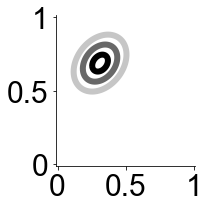

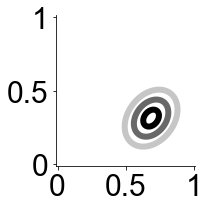

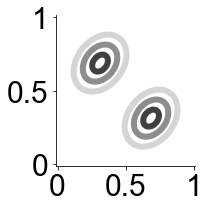

In [18]:
for mi,m,c in zip(range(2),[[-1.5,1.5],[1.5,-1.5]], [np.array([[1, 0.3], [0.3,1]]), np.array([[1, 0.3], [0.3,1]])]):
    _, ax = plt.subplots(1, 1, figsize=(figS*0.5, figS*0.5))
    Y_ = multivariate_normal.pdf(pos, mean=m, cov=c)
    ax.contour(x, y, Y_, levels=3, linewidths=line_w+4, cmap="Greys",vmin=0, vmax=0.15)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    #ax.spines["bottom"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    ax.grid(False)
    # for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    #     label.set_fontname(f_font1["fontname"])
    #     label.set_fontsize(35)
    ax.xaxis.set_ticks([-4,0,4])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    ax.xaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    ax.yaxis.set_ticks([-4,0,4])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    ax.set_xlim(-4.1, 4.1)
    ax.set_ylim(-4.1, 4.1)
    #plt.tick_params(top=False, bottom=False, left=False, right=False,
    #                labelleft=False, labelbottom=False)
    plt.tight_layout()
    plt.savefig(sp+"firing_ill_pred1"+str(mi)+".pdf")
    plt.show()

_, ax = plt.subplots(1, 1, figsize=(figS*0.5, figS*0.5))
Y_1 = multivariate_normal.pdf(pos, mean=[-1.5,1.5], cov=np.array([[1, 0.3], [0.3,1]]))
Y_2 = multivariate_normal.pdf(pos, mean=[1.5,-1.5], cov=np.array([[1, 0.3], [0.3,1]]))
ax.contour(x, y, 0.8*Y_1+0.8*Y_2, levels=3, linewidths=line_w+4, cmap="Greys",vmin=0, vmax=0.15)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
#ax.spines["left"].set_visible(False)
#ax.spines["bottom"].set_visible(False)
#ax.spines["left"].set_visible(False)
ax.grid(False)
# for label in (ax.get_xticklabels()+ax.get_yticklabels()):
#     label.set_fontname(f_font1["fontname"])
#     label.set_fontsize(35)
ax.xaxis.set_ticks([-4,0,4])
#ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
ax.xaxis.set_ticklabels(["0","0.5","1"], **f_font1)
ax.yaxis.set_ticks([-4,0,4])
#ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
ax.set_xlim(-4.1, 4.1)
ax.set_ylim(-4.1, 4.1)
#plt.tick_params(top=False, bottom=False, left=False, right=False,
#                labelleft=False, labelbottom=False)
plt.tight_layout()
plt.savefig(sp+"firing_ill_mixpred1.pdf")
plt.show()

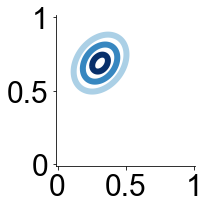

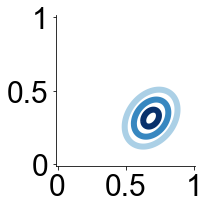

In [19]:
for mi,m,c in zip(range(2),[[-1.5,1.5],[1.5,-1.5]], [np.array([[1, 0.3], [0.3,1]]), np.array([[1, 0.3], [0.3,1]])]):
    _, ax = plt.subplots(1, 1, figsize=(figS*0.5, figS*0.5))
    Y_ = multivariate_normal.pdf(pos, mean=m, cov=c)
    ax.contour(x, y, Y_, levels=3, linewidths=line_w+4, cmap="Blues",vmin=0, vmax=0.15)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    #ax.spines["bottom"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    ax.grid(False)
    # for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    #     label.set_fontname(f_font1["fontname"])
    #     label.set_fontsize(35)
    ax.xaxis.set_ticks([-4,0,4])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    ax.xaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    ax.yaxis.set_ticks([-4,0,4])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    ax.set_xlim(-4.1, 4.1)
    ax.set_ylim(-4.1, 4.1)
    #plt.tick_params(top=False, bottom=False, left=False, right=False,
    #                labelleft=False, labelbottom=False)
    plt.tight_layout()
    plt.savefig(sp+"firing_test_pred1"+str(mi)+".pdf")
    plt.show()

In [50]:
np.mean(np.mean(Y_*w[mij][mi], axis=0))

0.0015430959047635423

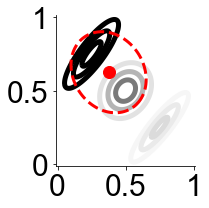

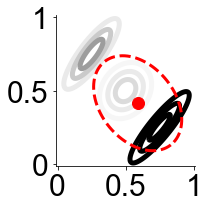

In [64]:
w = [[0.7, 0.2, 0.05],
     [0.12, 0.081, 0.8]]
for mij,mj,cj in zip(range(2),[[-1.5,1.5],[1.5,-1.5]], [np.array([[1, 0.3], [0.3,1]]), np.array([[1, 0.3], [0.3,1]])]):
    _, ax = plt.subplots(1, 1, figsize=(figS*0.5, figS*0.5))
    for mi,m,c in zip(range(3),[[-2,2],[0,0],[2,-2]], [np.array([[1, 1.4], [1, 1.4]]), np.array([[0.9, 0.2], [0.2,0.9]]), np.array([[1.2, 1.5], [1.2,1.5]])]):
        Y_ = multivariate_normal.pdf(pos, mean=m, cov=c)
        ax.contour(x, y, Y_*w[mij][mi], levels=3, linewidths=line_w+3, cmap="Greys",vmin=0, vmax=0.05)
    #Y_ = multivariate_normal.pdf(pos, mean=mj, cov=cj)
    #ax.contour(x, y, Y_, levels=3, linewidths=line_w+4, cmap="Blues")
    de = 1
    if mij==0:
        x0 = np.mean(np.mean(Y_*w[mij][mi], axis=0))-de
        y0=np.mean(np.mean(Y_*w[mij][mi], axis=1))+de
        ax.plot(x0, y0, "ro", markersize=12)
        # Define the semi-major and semi-minor axes
        a = 2.4  # length of semi-major axis
        b = 2  # length of semi-minor axis
    else:
        x0=np.mean(np.mean(Y_*w[mij][mi], axis=0))+de-0.3
        y0=np.mean(np.mean(Y_*w[mij][mi], axis=1))-de+0.3
        ax.plot(x0,y0, "ro", markersize=12)
        # Define the semi-major and semi-minor axes
        a = 3  # length of semi-major axis
        b = 2.1  # length of semi-minor axis
    

    # Generate angle values
    theta = np.linspace(0, 2 * np.pi, 100)

    # Parametric equation of the ellipse
    xe = a * np.cos(theta) + x0
    ye = b * np.sin(theta) + y0

    phi = np.radians(-45) 
    # Apply rotation to the ellipse
    x_rotated = (xe - x0) * np.cos(phi) - (ye - y0) * np.sin(phi) + x0
    y_rotated = (xe - x0) * np.sin(phi) + (ye - y0) * np.cos(phi) + y0

    ax.plot(x_rotated, y_rotated, "r--", linewidth=3)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    #ax.spines["bottom"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    ax.grid(False)
    # for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    #     label.set_fontname(f_font1["fontname"])
    #     label.set_fontsize(35)
    ax.xaxis.set_ticks([-4,0,4])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    ax.xaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    ax.yaxis.set_ticks([-4,0,4])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    ax.set_xlim(-4.1, 4.1)
    ax.set_ylim(-4.1, 4.1)
    #plt.tick_params(top=False, bottom=False, left=False, right=False,
    #                labelleft=False, labelbottom=False)
    plt.tight_layout()
    plt.savefig(sp+"firing_test_mix_pred"+str(mij)+".pdf")
    plt.show()

In [67]:
182/(182+198)

0.4789473684210526

In [68]:
198/(182+198)

0.5210526315789473

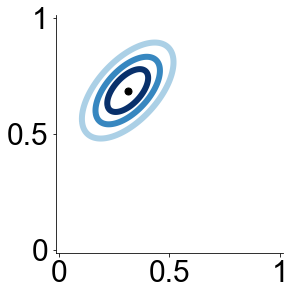

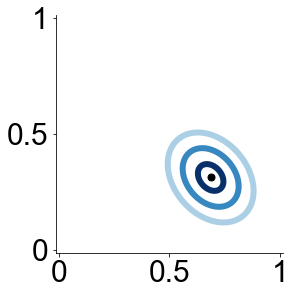

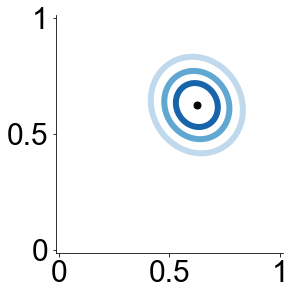

In [185]:
c = ["royalblue", "olivedrab", "darkorange", "firebrick"]
x, y = np.mgrid[-4:4:.01, -4:4:.01]
pos = np.empty(x.shape + (2,))
pos[:, :, 0] = x
pos[:, :, 1] = y
lw = 10
CM = ["Purples", "Blues", "Greens", "Oranges", "Reds"]
for mi,m,c in zip(range(3),[[-1.5,1.5],[1.5,-1.5], [1,1]], [np.array([[1, 0.59], [0.59,1]]), np.array([[1, -0.3], [-0.3,1]]), np.array([[1, -0.1], [-0.1,1]])]):
    _, ax = plt.subplots(1, 1, figsize=(figS*0.7, figS*0.7))
    Y_ = multivariate_normal.pdf(pos, mean=m, cov=c)
    ax.contour(x, y, Y_, levels=3, linewidths=line_w+4, cmap="Blues",vmin=0, vmax=0.15)
    ax.plot(m[0], m[1], "ko", markersize=7)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    #ax.spines["bottom"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    ax.grid(False)
    # for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    #     label.set_fontname(f_font1["fontname"])
    #     label.set_fontsize(35)
    ax.xaxis.set_ticks([-4,0,4])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    ax.xaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    ax.yaxis.set_ticks([-4,0,4])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    ax.set_xlim(-4.1, 4.1)
    ax.set_ylim(-4.1, 4.1)
    #plt.tick_params(top=False, bottom=False, left=False, right=False,
    #                labelleft=False, labelbottom=False)
    plt.tight_layout()
    plt.savefig(sp+"firing_example_meta1"+str(mi)+".pdf")
    plt.show()

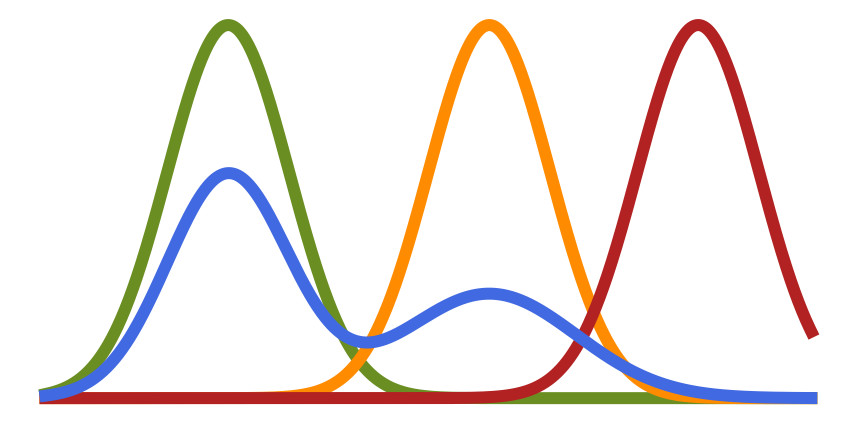

In [5]:
_, ax = plt.subplots(1, 1, figsize=(figS*2, figS))
c = ["royalblue", "olivedrab", "darkorange", "firebrick"]
x = np.linspace(-4.8,4,1000)
lw = 10
y = norm.pdf(x, loc=-2.7, scale=0.7)
ax.plot(x, y,  '-', linewidth=line_w+lw, color = c[1])
y = norm.pdf(x, loc=0.3, scale=0.7)
ax.plot(x, y,  '-', linewidth=line_w+lw, color = c[2])
y = norm.pdf(x, loc=2.7, scale=0.7)
ax.plot(x, y,  '-', linewidth=line_w+lw, color = c[3])
y = np.sum([0.6*norm.pdf(x, loc=-2.7, scale=0.7), 0.4*norm.pdf(x, loc=0.3, scale=1)], axis=0)
ax.plot(x, y,  '-', linewidth=line_w+lw, color = c[0])
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.spines["bottom"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.grid(False)
# for label in (ax.get_xticklabels()+ax.get_yticklabels()):
#     label.set_fontname(f_font1["fontname"])
#     label.set_fontsize(35)
#ax.xaxis.set_ticks(range(1,len(M)+1))
#ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
#ax.xaxis.set_ticklabels(["#"+str(i+1) for i in range(len(M))])
#ax.set_xlim(0, 10)
#ax.set_ylim(-0.03, 0.4)
#ax.yaxis.set_ticks(yax)
#ax.set_xlabel(" ")
#ax.set_ylabel(L[i], **f_font2)
plt.tick_params(top=False, bottom=False, left=False, right=False,
                labelleft=False, labelbottom=False)
plt.tight_layout()
plt.savefig(sp+"mixture_pred1.pdf")
plt.show()

/var/folders/7v/b8fs48v95fxb7gdt_3bqj7q00000gp/T/ipykernel_24809/1877645258.py:25: UserWarning: linewidths is ignored by contourf
  ax.contourf(x, y, Y_, levels=40, linewidths=line_w+4, cmap=CM[2])#,vmin=0, vmax=0.05)


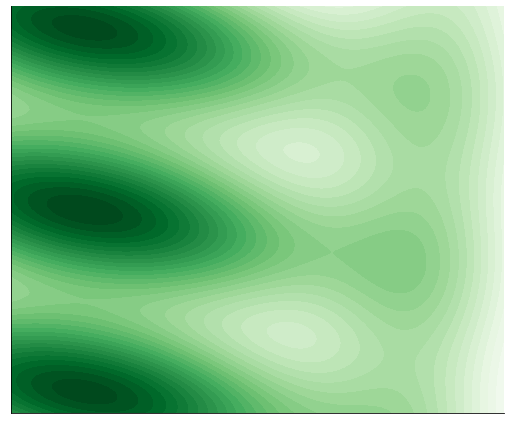

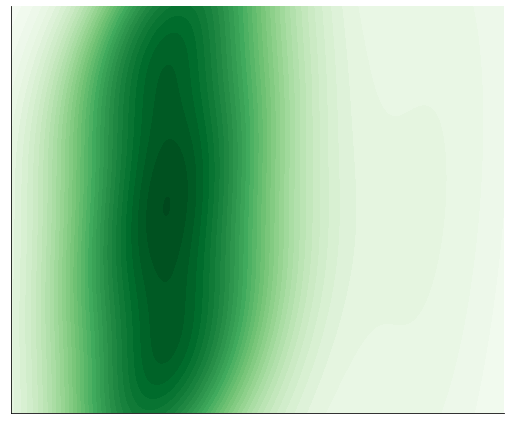

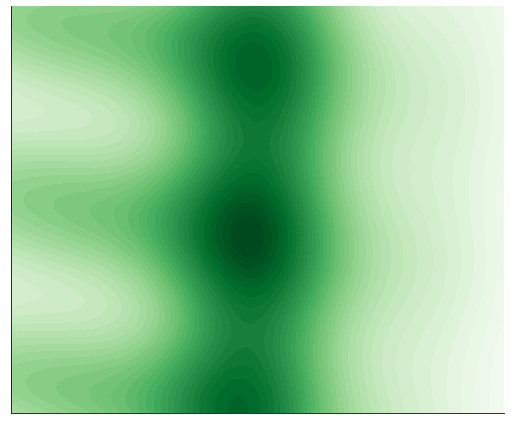

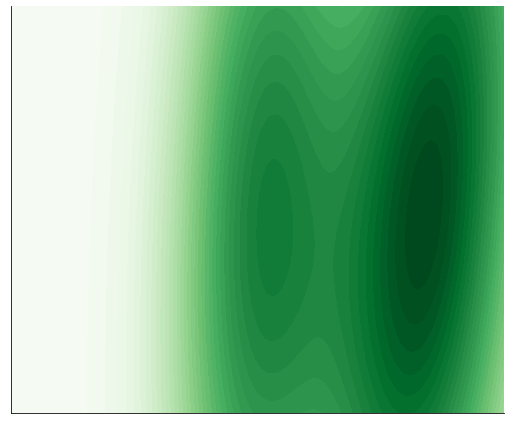

In [13]:
x, y = np.mgrid[-1:1:.001, -1:1:.001]
pos = np.empty(x.shape + (2,))
pos[:, :, 0] = x
pos[:, :, 1] = y
CM = ["Purples", "Blues", "Greens", "Oranges", "Reds"]
w = [[2/3, 2/3, 2/3, 2/3], 
     [2/5, 3/5,3/5,3/5, 2/5], 
     [1/5, 1/5,1/5,1/5, 3/5],
    [3/4, 2/4]]
MM = [[[0.7,0],[-0.7,0.9],[-0.7,0],[-0.7,-0.9]],
    [[0.7,0],[-0.4,0.9],[-0.4,0],[-0.4,-0.9], [0,0]],
    [[0.7,0],[-0.7,0.9],[-0.7,0],[-0.7,-0.9],[0,0]],
    [[0.7,0],[0,0]]]
CC = [[np.array([[0.1, 0.3], [0.2,3]]),np.array([[0.5, -0.1], [-0.1,0.1]]),np.array([[0.5, -0.1], [-0.1,0.1]]),np.array([[0.5, -0.1], [-0.1,0.1]])],
    [np.array([[0.1, 0.3], [0.2,3]]),np.array([[0.1, 0.1], [0.1,0.3]]),np.array([[0.1, 0.1], [0.1,0.3]]),np.array([[0.1, 0.1], [0.1,0.3]]),np.array([[0.07, 0.1], [0.1,3]])],
    [np.array([[0.1, 0.3], [0.2,3]]),np.array([[0.5, -0.1], [-0.1,0.1]]),np.array([[0.5, -0.1], [-0.1,0.1]]),np.array([[0.5, -0.1], [-0.1,0.1]]), np.array([[0.07, 0.1], [0.1,3]])],
    [np.array([[0.1, 0.3], [0.2,3]]),np.array([[0.07, 0.1], [0.1,3]])]]
for Mi,M,C in zip(range(len(MM)),MM, CC):
    _, ax = plt.subplots(1, 1, figsize=(figS*1.2, figS))
    Y_ = 0
    for mi,m,c in zip(range(len(M)),M, C):
        y_ = multivariate_normal.pdf(pos, mean=m, cov=c)
        Y_ += w[Mi][mi]*y_
    #ax.contour(x, y, Y_, levels=20, linewidths=line_w+4, cmap=CM[0])#,vmin=0, vmax=0.05)
    ax.contourf(x, y, Y_, levels=40, linewidths=line_w+4, cmap=CM[2])#,vmin=0, vmax=0.05)
    #ax.imshow(Y_)
    #Y_ = multivariate_normal.pdf(pos, mean=mj, cov=cj)
    #ax.contour(x, y, Y_, levels=3, linewidths=line_w+4, cmap="Blues")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    #ax.spines["bottom"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    ax.grid(False)
    # for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    #     label.set_fontname(f_font1["fontname"])
    #     label.set_fontsize(35)
    ax.xaxis.set_ticks([ ])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    #ax.xaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    ax.yaxis.set_ticks([ ])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    #ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    #ax.set_xlim(-1, 1)
    #ax.set_ylim(-1, 1)
    #plt.tick_params(top=False, bottom=False, left=False, right=False,
    #                labelleft=False, labelbottom=False)
    plt.tight_layout()
    plt.savefig(sp+"post1.pdf")
    plt.show()

/var/folders/7v/b8fs48v95fxb7gdt_3bqj7q00000gp/T/ipykernel_13094/1602213805.py:4: UserWarning: linewidths is ignored by contourf
  ax.contourf(x, y, y_, levels=20, linewidths=line_w+4, cmap=CM[1])#,vmin=0, vmax=0.05)


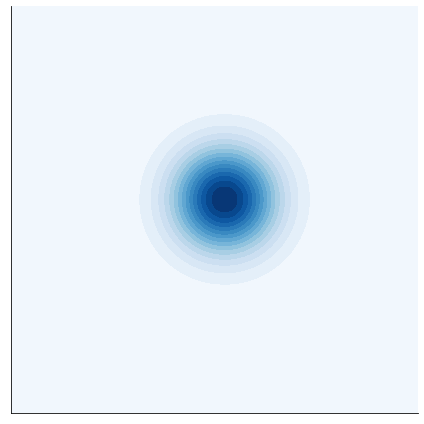

In [22]:
x, y = np.mgrid[-1:1:.001, -1:1:.001]
pos = np.empty(x.shape + (2,))
pos[:, :, 0] = x
pos[:, :, 1] = y
_, ax = plt.subplots(1, 1, figsize=(figS, figS))
y_ = multivariate_normal.pdf(pos, mean=[0.2,0.2], cov=[[0.5,0.],[0.,0.5]])
#ax.contour(x, y, Y_, levels=20, linewidths=line_w+4, cmap=CM[0])#,vmin=0, vmax=0.05)
ax.contourf(x, y, y_, levels=20, linewidths=line_w+4, cmap=CM[1])#,vmin=0, vmax=0.05)
#ax.imshow(Y_)
#Y_ = multivariate_normal.pdf(pos, mean=mj, cov=cj)
#ax.contour(x, y, Y_, levels=3, linewidths=line_w+4, cmap="Blues")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
#ax.spines["left"].set_visible(False)
#ax.spines["bottom"].set_visible(False)
#ax.spines["left"].set_visible(False)
ax.grid(False)
# for label in (ax.get_xticklabels()+ax.get_yticklabels()):
#     label.set_fontname(f_font1["fontname"])
#     label.set_fontsize(35)
ax.xaxis.set_ticks([ ])
#ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
#ax.xaxis.set_ticklabels(["0","0.5","1"], **f_font1)
ax.yaxis.set_ticks([ ])
#ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
#ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
#ax.set_xlim(-1, 1)
#ax.set_ylim(-1, 1)
#plt.tick_params(top=False, bottom=False, left=False, right=False,
#                labelleft=False, labelbottom=False)
plt.tight_layout()
plt.savefig(sp+"post1.pdf")
plt.show()

/var/folders/7v/b8fs48v95fxb7gdt_3bqj7q00000gp/T/ipykernel_13094/1223130292.py:20: UserWarning: linewidths is ignored by contourf
  ax.contourf(x, y, mixture_pdf, levels=20, linewidths=line_w+4, cmap=CM[1])#,vmin=0, vmax=0.05)


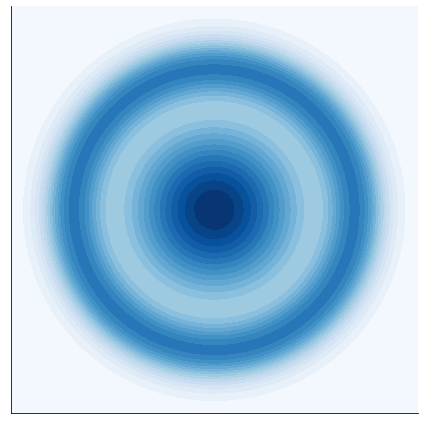

In [36]:


x, y = np.mgrid[-1:1:.001, -1:1:.001]
pos = np.empty(x.shape + (2,))
pos[:, :, 0] = x
pos[:, :, 1] = y
_, ax = plt.subplots(1, 1, figsize=(figS, figS))
mean1 = [0,0]
pdf1 = multivariate_normal.pdf(pos, mean=mean1, cov=[[0.1,0.],[0.,0.1]])

# Define the radial distance from the mean for the second PDF
r = np.sqrt((x - mean1[0])**2 + (y - mean1[1])**2)
sigma_r = 0.1  # Controls the width of the ring
center_r = 0.7  # Controls the radius of the ring
pdf2 = np.exp(-0.5 * ((r - center_r) / sigma_r) ** 2)

# Combine the two PDFs into a mixture density
weight1 = 0.5  # Weight for the first PDF
weight2 = 0.5  # Weight for the second PDF
mixture_pdf = weight1 * pdf1 + weight2 * pdf2
#ax.contour(x, y, Y_, levels=20, linewidths=line_w+4, cmap=CM[0])#,vmin=0, vmax=0.05)
ax.contourf(x, y, mixture_pdf, levels=20, linewidths=line_w+4, cmap=CM[1])#,vmin=0, vmax=0.05)
#ax.imshow(Y_)
#Y_ = multivariate_normal.pdf(pos, mean=mj, cov=cj)
#ax.contour(x, y, Y_, levels=3, linewidths=line_w+4, cmap="Blues")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
#ax.spines["left"].set_visible(False)
#ax.spines["bottom"].set_visible(False)
#ax.spines["left"].set_visible(False)
ax.grid(False)
# for label in (ax.get_xticklabels()+ax.get_yticklabels()):
#     label.set_fontname(f_font1["fontname"])
#     label.set_fontsize(35)
ax.xaxis.set_ticks([ ])
#ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
#ax.xaxis.set_ticklabels(["0","0.5","1"], **f_font1)
ax.yaxis.set_ticks([ ])
#ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
#ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
#ax.set_xlim(-1, 1)
#ax.set_ylim(-1, 1)
#plt.tick_params(top=False, bottom=False, left=False, right=False,
#                labelleft=False, labelbottom=False)
plt.tight_layout()
plt.savefig(sp+"post1_conc.pdf")
plt.show()

/var/folders/7v/b8fs48v95fxb7gdt_3bqj7q00000gp/T/ipykernel_13094/194528703.py:10: UserWarning: linewidths is ignored by contourf
  ax.contourf(x, y, Y_, levels=20, linewidths=line_w+4, cmap=CM[1])#,vmin=0, vmax=0.05)


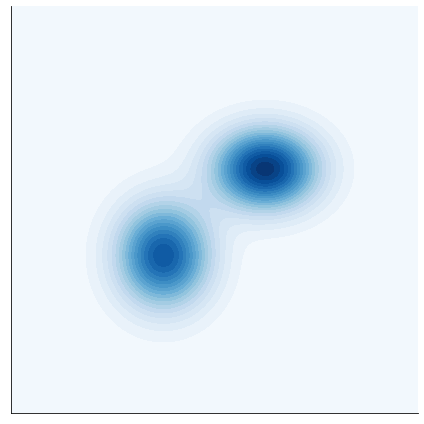

In [28]:

M = [[-1,-.9],[1,0.8]]
C = [np.array([[0.4, 0.], [0.,0.5]]),np.array([[0.5, 0.], [0.,0.3]])]

_, ax = plt.subplots(1, 1, figsize=(figS, figS))
Y_ = 0
for mi,m,c in zip(range(len(M)),M, C):
    y_ = multivariate_normal.pdf(pos, mean=m, cov=c)
    Y_ += 0.5*y_
#ax.contour(x, y, Y_, levels=20, linewidths=line_w+4, cmap=CM[0])#,vmin=0, vmax=0.05)
ax.contourf(x, y, Y_, levels=20, linewidths=line_w+4, cmap=CM[1])#,vmin=0, vmax=0.05)
#ax.imshow(Y_)
#Y_ = multivariate_normal.pdf(pos, mean=mj, cov=cj)
#ax.contour(x, y, Y_, levels=3, linewidths=line_w+4, cmap="Blues")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
#ax.spines["left"].set_visible(False)
#ax.spines["bottom"].set_visible(False)
#ax.spines["left"].set_visible(False)
ax.grid(False)
# for label in (ax.get_xticklabels()+ax.get_yticklabels()):
#     label.set_fontname(f_font1["fontname"])
#     label.set_fontsize(35)
ax.xaxis.set_ticks([ ])
#ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
#ax.xaxis.set_ticklabels(["0","0.5","1"], **f_font1)
ax.yaxis.set_ticks([ ])
#ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
#ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
#ax.set_xlim(-1, 1)
#ax.set_ylim(-1, 1)
#plt.tick_params(top=False, bottom=False, left=False, right=False,
#                labelleft=False, labelbottom=False)
plt.tight_layout()
plt.savefig(sp+"post2.pdf")
plt.show()

/var/folders/7v/b8fs48v95fxb7gdt_3bqj7q00000gp/T/ipykernel_13094/2579337710.py:9: UserWarning: linewidths is ignored by contourf
  ax.contourf(x, y, y_, levels=20, linewidths=line_w+4, cmap=CM[1])#,vmin=0, vmax=0.05)


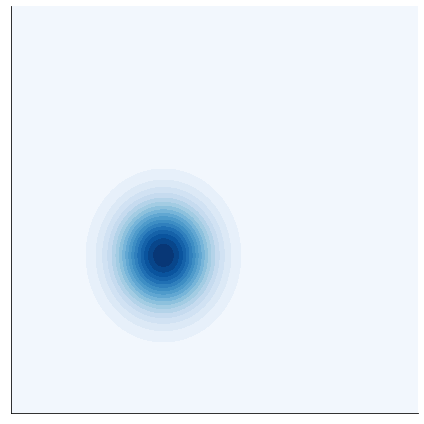

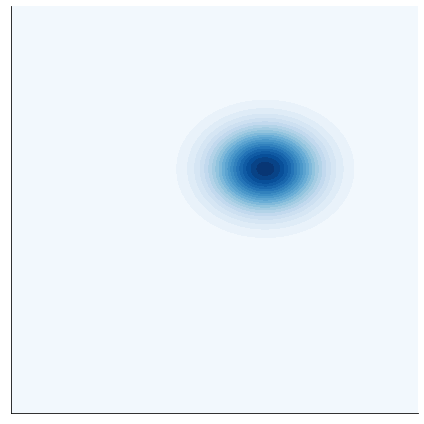

In [29]:
M = [[-1,-.9],[1,0.8]]
C = [np.array([[0.4, 0.], [0.,0.5]]),np.array([[0.5, 0.], [0.,0.3]])]


for mi,m,c in zip(range(len(M)),M, C):

    _, ax = plt.subplots(1, 1, figsize=(figS, figS))
    y_ = multivariate_normal.pdf(pos, mean=m, cov=c)
    ax.contourf(x, y, y_, levels=20, linewidths=line_w+4, cmap=CM[1])#,vmin=0, vmax=0.05)
    #ax.imshow(Y_)
    #Y_ = multivariate_normal.pdf(pos, mean=mj, cov=cj)
    #ax.contour(x, y, Y_, levels=3, linewidths=line_w+4, cmap="Blues")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    #ax.spines["bottom"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    ax.grid(False)
    # for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    #     label.set_fontname(f_font1["fontname"])
    #     label.set_fontsize(35)
    ax.xaxis.set_ticks([ ])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    #ax.xaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    ax.yaxis.set_ticks([ ])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    #ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    #ax.set_xlim(-1, 1)
    #ax.set_ylim(-1, 1)
    #plt.tick_params(top=False, bottom=False, left=False, right=False,
    #                labelleft=False, labelbottom=False)
    plt.tight_layout()
    plt.savefig(sp+"post2"+str(mi)+".pdf")
    plt.show()

/var/folders/7v/b8fs48v95fxb7gdt_3bqj7q00000gp/T/ipykernel_24809/2501095866.py:10: UserWarning: linewidths is ignored by contourf
  con = ax.contourf(x, y, Y_, levels=30, linewidths=line_w+4, cmap=CM[1])#,vmin=0, vmax=0.05)


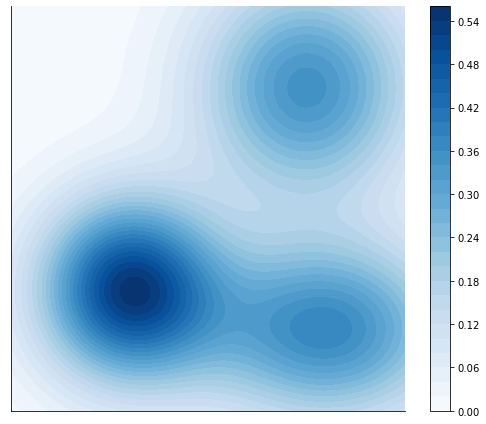

In [17]:

M = [[-0.4,-0.4],[0.6,-0.6],[0.5,0.6]]
C = [np.array([[0.1, 0.], [0.,0.1]]),np.array([[0.2, 0.], [0.,0.1]]),np.array([[0.15, 0.], [0.,0.15]])]

_, ax = plt.subplots(1, 1, figsize=(figS*1.2, figS))
Y_ = 0
for mi,m,c in zip(range(len(M)),M, C):
    y_ = multivariate_normal.pdf(pos, mean=m, cov=c)
    Y_ += 0.33*y_
#ax.contour(x, y, Y_, levels=20, linewidths=line_w+4, cmap=CM[0])#,vmin=0, vmax=0.05)
con = ax.contourf(x, y, Y_, levels=30, linewidths=line_w+4, cmap=CM[1])#,vmin=0, vmax=0.05)
#ax.imshow(Y_)
#Y_ = multivariate_normal.pdf(pos, mean=mj, cov=cj)
#ax.contour(x, y, Y_, levels=3, linewidths=line_w+4, cmap="Blues")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
#ax.spines["left"].set_visible(False)
#ax.spines["bottom"].set_visible(False)
#ax.spines["left"].set_visible(False)
ax.grid(False)
# for label in (ax.get_xticklabels()+ax.get_yticklabels()):
#     label.set_fontname(f_font1["fontname"])
#     label.set_fontsize(35)
ax.xaxis.set_ticks([ ])
#ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
#ax.xaxis.set_ticklabels(["0","0.5","1"], **f_font1)
ax.yaxis.set_ticks([ ])
#ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
#ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
#ax.set_xlim(-1, 1)
#ax.set_ylim(-1, 1)
#plt.tick_params(top=False, bottom=False, left=False, right=False,
#                labelleft=False, labelbottom=False)
plt.colorbar(con)
plt.tight_layout()
plt.savefig(sp+"post3.pdf")
plt.show()

In [18]:
sigmoid(x,0.3)

TypeError: sigmoid() missing 1 required positional argument: 'b'

/var/folders/7v/b8fs48v95fxb7gdt_3bqj7q00000gp/T/ipykernel_13094/3826972534.py:23: UserWarning: linewidths is ignored by contourf
  con = ax.contourf(x, y, Y_, levels=20, linewidths=line_w+4, cmap=CM[-1])#,vmin=0, vmax=0.05)


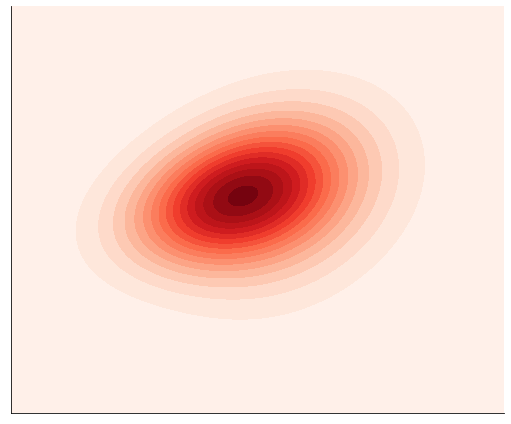

In [38]:
def sigmoid(x,s,b):
    return 1 / (1 + np.exp((-x+b)/s))
x, y = np.mgrid[-2:2:.001, -2:2:.001]
pos = np.empty(x.shape + (2,))
pos[:, :, 0] = x
pos[:, :, 1] = y
#M = [[-0.6,-0.6],[0,0]]
#C = [np.array([[0.2, 0.1], [0.1,0.2]]),np.array([[0.4, 0.1], [0.1,0.4]])]
M = [[0.3,0.3],[0.,0.]]
C = [np.array([[0.2, 0.1], [0.1,0.2]]),np.array([[0.2, 0.1], [0.1,0.2]])]
M = [[-0.4,0.],[0,0]]
C = [np.array([[0.3, 0.], [0.1,0.2]]),np.array([[0.4, 0.1], [0.1,0.4]])]
#M = [[0.4,-0.3],[0,0]]
#C = [np.array([[0.2, 0.1], [0.,0.2]]),np.array([[0.4, 0.1], [0.1,0.4]])]
ss = 0.5
bb = -0.3
_, ax = plt.subplots(1, 1, figsize=(figS*1.2, figS))
Y_ = 0
for mi,m,c in zip(range(len(M)),M, C):
    y_ = multivariate_normal.pdf(pos, mean=m, cov=c)
    Y_ += 0.5*y_*(0.5*sigmoid(x,ss,bb)+0.5*sigmoid(y,ss,bb))
#ax.contour(x, y, Y_, levels=20, linewidths=line_w+4, cmap=CM[0])#,vmin=0, vmax=0.05)
con = ax.contourf(x, y, Y_, levels=20, linewidths=line_w+4, cmap=CM[-1])#,vmin=0, vmax=0.05)
#ax.imshow(Y_)
#Y_ = multivariate_normal.pdf(pos, mean=mj, cov=cj)
#ax.contour(x, y, Y_, levels=3, linewidths=line_w+4, cmap="Blues")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
#ax.spines["left"].set_visible(False)
#ax.spines["bottom"].set_visible(False)
#ax.spines["left"].set_visible(False)
ax.grid(False)
# for label in (ax.get_xticklabels()+ax.get_yticklabels()):
#     label.set_fontname(f_font1["fontname"])
#     label.set_fontsize(35)
ax.xaxis.set_ticks([ ])
#ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
#ax.xaxis.set_ticklabels(["0","0.5","1"], **f_font1)
ax.yaxis.set_ticks([ ])
#ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
#ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
#ax.set_xlim(-1, 1)
#ax.set_ylim(-1, 1)
#plt.tick_params(top=False, bottom=False, left=False, right=False,
#                labelleft=False, labelbottom=False)
#plt.colorbar(con)
plt.tight_layout()
plt.savefig(sp+"r4.pdf")
plt.show()

/var/folders/7v/b8fs48v95fxb7gdt_3bqj7q00000gp/T/ipykernel_24809/192348744.py:7: UserWarning: linewidths is ignored by contourf
  ax.contourf(x, y, y_, levels=20, linewidths=line_w+4, cmap=CM[1])#,vmin=0, vmax=0.05)


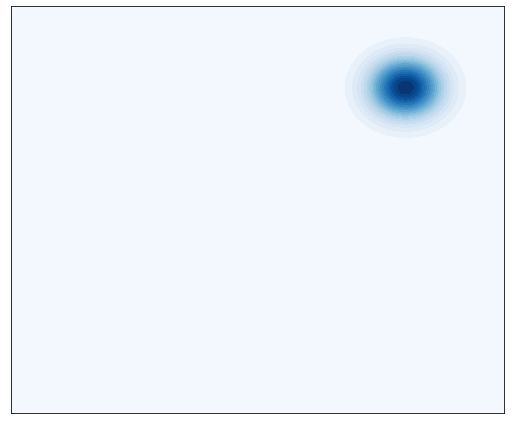

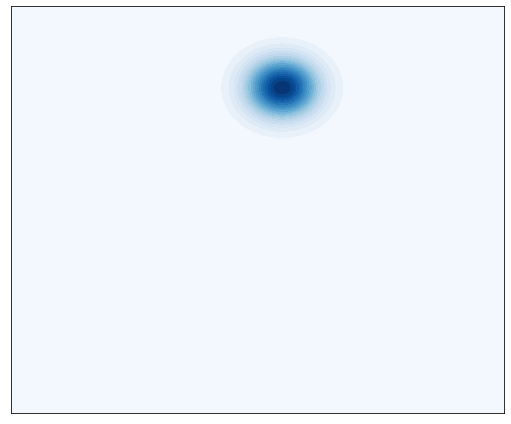

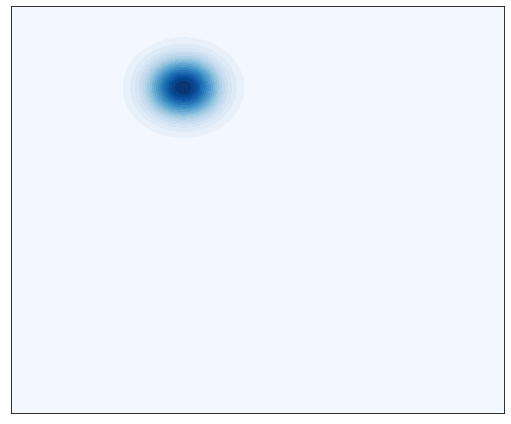

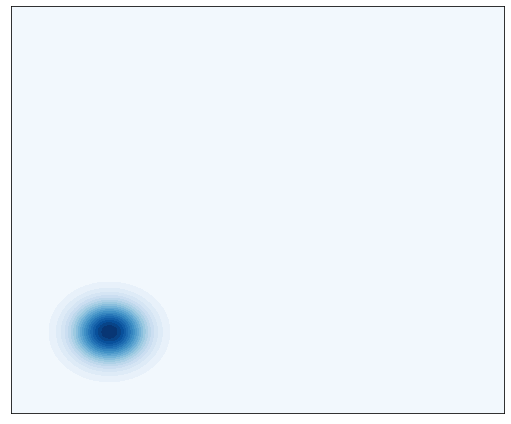

In [38]:
x1 = [0.6,0.1,-0.3,-0.6]
x2 = [0.6,0.6,0.6,-0.6]
for i in range(4):
    _, ax = plt.subplots(1, 1, figsize=(figS*1.2, figS))
    y_ = multivariate_normal.pdf(pos, mean=[x1[i],x2[i]], cov=[[0.01,0.],[0.,0.01]])
    #ax.contour(x, y, Y_, levels=20, linewidths=line_w+4, cmap=CM[0])#,vmin=0, vmax=0.05)
    ax.contourf(x, y, y_, levels=20, linewidths=line_w+4, cmap=CM[1])#,vmin=0, vmax=0.05)
    #ax.imshow(Y_)
    #Y_ = multivariate_normal.pdf(pos, mean=mj, cov=cj)
    #ax.contour(x, y, Y_, levels=3, linewidths=line_w+4, cmap="Blues")
    #ax.spines["top"].set_visible(False)
    #ax.spines["right"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    #ax.spines["bottom"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    ax.grid(False)
    # for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    #     label.set_fontname(f_font1["fontname"])
    #     label.set_fontsize(35)
    ax.xaxis.set_ticks([ ])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    #ax.xaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    ax.yaxis.set_ticks([ ])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    #ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    #ax.set_xlim(-1, 1)
    #ax.set_ylim(-1, 1)
    #plt.tick_params(top=False, bottom=False, left=False, right=False,
    #                labelleft=False, labelbottom=False)
    plt.tight_layout()
    plt.savefig(sp+"post_sharp"+str(i)+".pdf")
    plt.show()

/var/folders/7v/b8fs48v95fxb7gdt_3bqj7q00000gp/T/ipykernel_24809/2877461240.py:10: UserWarning: linewidths is ignored by contourf
  ax.contourf(x, y, Y_, levels=30, linewidths=line_w+4, cmap=CM[1])#,vmin=0, vmax=0.05)


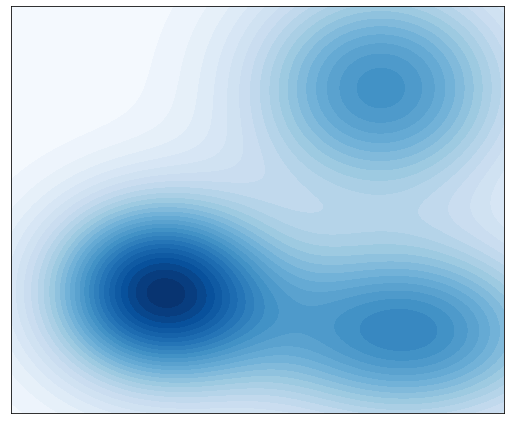

In [37]:

M = [[-0.4,-0.4],[0.6,-0.6],[0.5,0.6]]
C = [np.array([[0.1, 0.], [0.,0.1]]),np.array([[0.2, 0.], [0.,0.1]]),np.array([[0.15, 0.], [0.,0.15]])]

_, ax = plt.subplots(1, 1, figsize=(figS*1.2, figS))
Y_ = 0
for mi,m,c in zip(range(len(M)),M, C):
    y_ = multivariate_normal.pdf(pos, mean=m, cov=c)
    Y_ += 0.33*y_
#ax.contour(x, y, Y_, levels=20, linewidths=line_w+4, cmap=CM[0])#,vmin=0, vmax=0.05)
ax.contourf(x, y, Y_, levels=30, linewidths=line_w+4, cmap=CM[1])#,vmin=0, vmax=0.05)
#ax.imshow(Y_)
#Y_ = multivariate_normal.pdf(pos, mean=mj, cov=cj)
#ax.contour(x, y, Y_, levels=3, linewidths=line_w+4, cmap="Blues")
#ax.spines["top"].set_visible(False)
#ax.spines["right"].set_visible(False)
#ax.spines["left"].set_visible(False)
#ax.spines["bottom"].set_visible(False)
#ax.spines["left"].set_visible(False)
ax.grid(False)
# for label in (ax.get_xticklabels()+ax.get_yticklabels()):
#     label.set_fontname(f_font1["fontname"])
#     label.set_fontsize(35)
ax.xaxis.set_ticks([ ])
#ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
#ax.xaxis.set_ticklabels(["0","0.5","1"], **f_font1)
ax.yaxis.set_ticks([ ])
#ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
#ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
#ax.set_xlim(-1, 1)
#ax.set_ylim(-1, 1)
#plt.tick_params(top=False, bottom=False, left=False, right=False,
#                labelleft=False, labelbottom=False)
plt.tight_layout()
plt.savefig(sp+"post3.pdf")
plt.show()

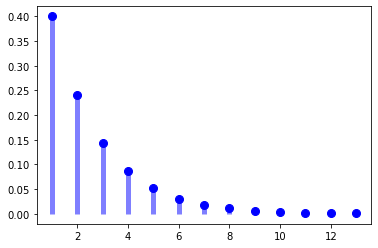

In [3]:
fig, ax = plt.subplots(1, 1)
ax.plot(x, geom.pmf(x, p), 'bo', ms=8, label='geom pmf')

ax.vlines(x, 0, geom.pmf(x, p), colors='b', lw=5, alpha=0.5)

In [4]:
y = geom.pmf(x, p)

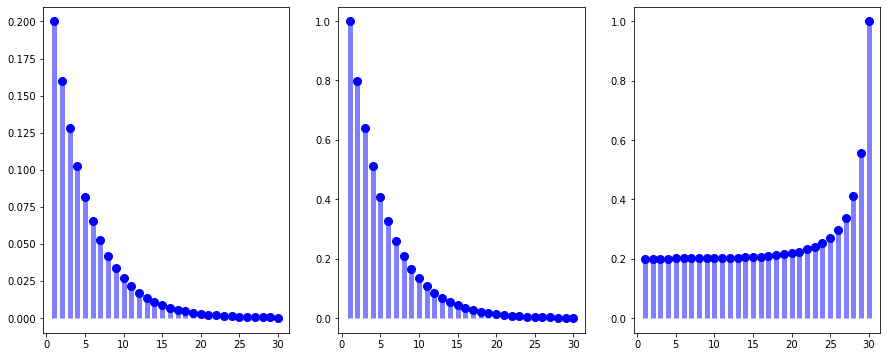

In [5]:
p = 0.2
gap = np.arange(geom.ppf(0.001, p), geom.ppf(0.999, p))
priorGap = geom.pmf(gap, p)

survival = np.array([np.sum(priorGap[int(t-1):]) for t in gap])
hazard = priorGap / survival

fig, ax = plt.subplots(1, 3, figsize=(15, 6))
ax[0].plot(gap, priorGap, 'bo', ms=8, label='geom pmf')
ax[0].vlines(gap, 0, priorGap, colors='b', lw=5, alpha=0.5)
ax[1].plot(gap, survival, 'bo', ms=8, label='geom survival')
ax[1].vlines(gap, 0, survival, colors='b', lw=5, alpha=0.5)
ax[2].plot(gap, hazard, 'bo', ms=8, label='geom hazard')
ax[2].vlines(gap, 0, hazard, colors='b', lw=5, alpha=0.5)
plt.show()


In [6]:
survival

array([9.98762060e-01, 7.98762060e-01, 6.38762060e-01, 5.10762060e-01,
       4.08362060e-01, 3.26442060e-01, 2.60906060e-01, 2.08477260e-01,
       1.66534220e-01, 1.32979788e-01, 1.06136242e-01, 8.46614059e-02,
       6.74815367e-02, 5.37376413e-02, 4.27425251e-02, 3.39464320e-02,
       2.69095576e-02, 2.12800581e-02, 1.67764585e-02, 1.31735788e-02,
       1.02912750e-02, 7.98543200e-03, 6.14075759e-03, 4.66501806e-03,
       3.48442644e-03, 2.53995315e-03, 1.78437451e-03, 1.17991160e-03,
       6.96341272e-04, 3.09485010e-04])

In [7]:
priorGap

array([0.2       , 0.16      , 0.128     , 0.1024    , 0.08192   ,
       0.065536  , 0.0524288 , 0.04194304, 0.03355443, 0.02684355,
       0.02147484, 0.01717987, 0.0137439 , 0.01099512, 0.00879609,
       0.00703687, 0.0056295 , 0.0045036 , 0.00360288, 0.0028823 ,
       0.00230584, 0.00184467, 0.00147574, 0.00118059, 0.00094447,
       0.00075558, 0.00060446, 0.00048357, 0.00038686, 0.00030949])

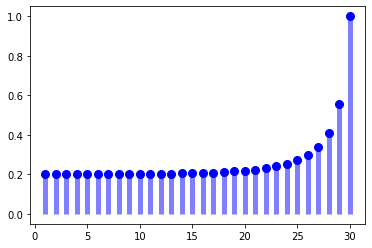

In [8]:
fig, ax = plt.subplots(1, 1)
ax.plot(gap, hazard, 'bo', ms=8, label='geom pmf')
ax.vlines(gap, 0, hazard, colors='b', lw=5, alpha=0.5)

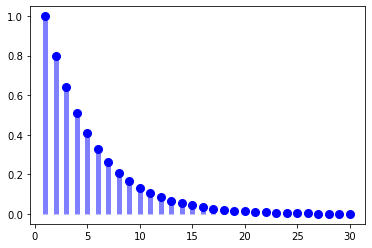

In [9]:
fig, ax = plt.subplots(1, 1)
ax.plot(gap, survival, 'bo', ms=8, label='geom pmf')
ax.vlines(gap, 0, survival, colors='b', lw=5, alpha=0.5)

In [10]:
# Growth probability
RunLengthDataJointProb[t+2, :] = (RunLengthDataJointProb[t, :]
                                            * prediction
                                            * (1 - hazard[t]))
# change point probability
RunLengthDataJointProb[t+1, :] = (RunLengthDataJointProb[t, :]
                                            * prediction
                                            * hazard[t])



NameError: name 'RunLengthDataJointProb' is not defined

In [11]:
z = normalize(survivalFun())

NameError: name 'normalize' is not defined

In [12]:
def normalize(x):
    return x/np.sum(x)

In [13]:
plt.plot(z)

NameError: name 'z' is not defined

In [14]:
np.dot(np.array([4]), np.array([5]))

20

In [42]:
from scipy.stats import norm

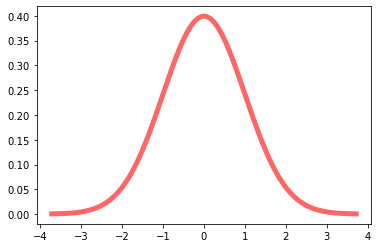

In [45]:
x = np.linspace(norm.ppf(0.0001), norm.ppf(0.9999), 1000)
fig, ax = plt.subplots(1, 1)
ax.plot(x, norm.pdf(x,0,1),'r-', lw=5, alpha=0.6, label='norm pdf')
plt.show()

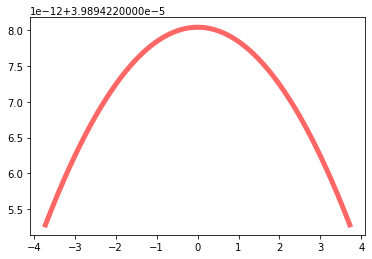

In [48]:
fig, ax = plt.subplots(1, 1)
ax.plot(x, norm.pdf(x,0,10000),'r-', lw=5, alpha=0.6, label='norm pdf')
plt.show()

In [49]:
grid = np.linspace(0, 200, 1000)
x,y = np.meshgrid(grid,grid)

In [53]:
np.vstack((x.flatten(),y.flatten())).T

array([[  0.       ,   0.       ],
       [  0.2002002,   0.       ],
       [  0.4004004,   0.       ],
       ...,
       [199.5995996, 200.       ],
       [199.7997998, 200.       ],
       [200.       , 200.       ]])

In [100]:
0**2

0